In [191]:
%reset
#IMPORTING PANDAS AND DIFFERENT TABLES WITH DATA
import pandas as pd
directory63 = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\63x\READY'
directory63r = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\repeat\63x\READY'
#directory20 = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\20x\READY'

table63_plin2 = pd.read_table('{}\data_table_63x_PLIN2.txt'.format(directory63))
table63_plin2r = pd.read_table('{}\data_table_63x_PLIN2.txt'.format(directory63r))
#table20_plin2 = pd.read_table('{}\data_table_20x_PLIN2.txt'.format(directory20))

table63_pgc1a = pd.read_table('{}\data_table_63x_PGC1a.txt'.format(directory63))
table63_pgc1ar = pd.read_table('{}\data_table_63x_PGC1a.txt'.format(directory63r))
#table20_pgc1a = pd.read_table('{}\data_table_20x_PGC1a.txt'.format(directory20))

table63_pck1 = pd.read_table('{}\data_table_63x_PCK1.txt'.format(directory63))
table63_pck1r = pd.read_table('{}\data_table_63x_PCK1.txt'.format(directory63r))
#table20_pck1 = pd.read_table('{}\data_table_20x_PCK1.txt'.format(directory20))

table63 = pd.concat([table63_plin2, table63_pgc1a, table63_pck1], axis=0, ignore_index=True, sort=False)
table63r = pd.concat([table63_plin2r, table63_pgc1ar, table63_pck1r], axis=0, ignore_index=True, sort=False)
table63_all = pd.concat([table63_plin2, table63_pgc1a, table63_pck1, table63_plin2r, table63_pgc1ar, table63_pck1r], axis=0, ignore_index=True, sort=False)

#table20 = pd.concat([table20_plin2, table20_pgc1a, table20_pck1], axis=0, ignore_index=True, sort=False)
#table63

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [8]:
table63

,fileName,BCAA,EPS,Tube_LD_sigfrac,Tube_PLIN5_sigfrac,Tube_PLIN2_sigfrac,Tube_LD_#,Tube_LD_#per_mm3,Tube_LD_diam,Blast_LD_sigfrac,Blast_PLIN5_sigfrac,Blast_PLIN2_sigfrac,Blast_LD_#,Blast_LD_#per_mm3,Blast_LD_diam,Tube_PGC1a_sigfrac,Blast_PGC1a_sigfrac,Tube_PCK1_sigfrac,Blast_PCK1_sigfrac
0,1a_CTR_08BCAA_63x,08,no,0.000901,0.000355,0.000220,312,34.4439,0.3399,0.001344,0.000304,0.000097,240,51.9198,0.2586,NaN,NaN,NaN,NaN
1,1a_CTR_noBCAA_63x,no,no,0.000306,0.001283,0.000217,354,40.8617,0.2778,0.000410,0.001785,0.000091,176,22.4040,0.2363,NaN,NaN,NaN,NaN
2,1a_EPS_08BCAA_63x,08,yes,0.000390,0.000972,0.000358,241,22.1903,0.2412,0.000385,0.001505,0.000048,119,65.7756,0.2493,NaN,NaN,NaN,NaN
3,1a_EPS_noBCAA_63x,no,yes,0.000508,0.001128,0.000246,703,58.2030,0.2745,0.000538,0.001285,0.000064,195,41.1266,0.2518,NaN,NaN,NaN,NaN
4,1b_CTR_08BCAA_63x,08,no,0.001026,0.000388,0.000342,190,39.1237,0.2679,0.001252,0.000338,0.000106,616,71.0007,0.3411,NaN,NaN,NaN,NaN
5,1b_CTR_noBCAA_63x,no,no,0.000382,0.001475,0.000198,258,18.7817,0.3158,0.000509,0.002342,0.000120,420,78.7670,0.2641,NaN,NaN,NaN,NaN
6,1b_EPS_08BCAA_63x,08,yes,0.000541,0.001250,0.000390,446,49.2167,0.3184,0.000727,0.001868,0.000162,922,190.7936,0.2948,NaN,NaN,NaN,NaN
7,1b_EPS_noBCAA_63x,no,yes,0.000521,0.001150,0.000353,120,8.6369,0.2681,0.000616,0.001280,0.000107,52,10.8785,0.2013,NaN,NaN,NaN,NaN
8,1c_CTR_08BCAA_63x,08,no,0.001098,0.000371,0.000287,337,51.3825,0.3282,0.001257,0.000209,0.000090,345,53.5452,0.2448,NaN,NaN,NaN,NaN
9,1c_CTR_noBCAA_63x,no,no,0.000396,0.001630,0.000300,730,60.7118,0.2405,0.000254,0.001460,0.000051,312,59.5489,0.2178,NaN,NaN,NaN,NaN


In [192]:
#TRANSFORM AND INTEGRATE DIFFERENT DATAFRAMES INTO ONE MAIN DATAFRAME
import os
import numpy as np

datasets = ['63', '63r'] #originally: magns = ['20', '63']
for m in datasets:
    if m is '63': 
        directory = directory63
        table = table63
    else : 
        directory = directory63r
        table = table63r

        
    for filename in os.listdir(directory):
        if 'coloc' in filename:

            col_subj = filename[:13]
            coloc = pd.read_table(r'{}\{}'.format(directory, filename))
            marker1 = coloc['Images'][0].split()[0]
            marker2 = coloc['Images'][0].split()[2]
            colm_hd1 = '{}.vs.{}'.format(marker1, marker2)
            colm_hd2 = '{}.vs.{}'.format(marker2, marker1)
            if colm_hd1 not in table.columns:
                table[colm_hd1] = np.nan
                table[colm_hd2] = np.nan
            tM1 = float(coloc['tM1'][0].replace(',','.'))
            tM2 = float(coloc['tM2'][0].replace(',','.'))
            for rowindex, row in enumerate(table['fileName']):
                if col_subj in row:
                    table.at[rowindex, colm_hd1] = tM1
                    table.at[rowindex, colm_hd2] = tM2
    if m is '63': table63 = table
    else : table63r = table
    table63_all = pd.concat([table63, table63r], axis=0, ignore_index=True, sort=False)


#this piece of code makes visualization of complete table possible
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

table63_all
table63

,fileName,BCAA,EPS,Tube_LD_sigfrac,Tube_PLIN5_sigfrac,Tube_PLIN2_sigfrac,Tube_LD_#,Tube_LD_#per_mm3,Tube_LD_diam,Blast_LD_sigfrac,Blast_PLIN5_sigfrac,Blast_PLIN2_sigfrac,Blast_LD_#,Blast_LD_#per_mm3,Blast_LD_diam,Tube_PGC1a_sigfrac,Blast_PGC1a_sigfrac,Tube_PCK1_sigfrac,Blast_PCK1_sigfrac,blastsLD.vs.blasts_PLIN2,blasts_PLIN2.vs.blastsLD,blastsLD.vs.blasts_PLIN5,blasts_PLIN5.vs.blastsLD,blasts_PLIN5.vs.blasts_PLIN2,blasts_PLIN2.vs.blasts_PLIN5,tubesLD.vs.tubes_PLIN2,tubes_PLIN2.vs.tubesLD,tubesLD.vs.tubes_PLIN5,tubes_PLIN5.vs.tubesLD,tubes_PLIN5.vs.tubes_PLIN2,tubes_PLIN2.vs.tubes_PLIN5,blastsLD.vs.blasts_PGC1a,blasts_PGC1a.vs.blastsLD,blasts_PLIN5.vs.blasts_PGC1a,blasts_PGC1a.vs.blasts_PLIN5,tubesLD.vs.tubes_PGC1a,tubes_PGC1a.vs.tubesLD,tubes_PLIN5.vs.tubes_PGC1a,tubes_PGC1a.vs.tubes_PLIN5,blastsLD.vs.blasts_PCK1,blasts_PCK1.vs.blastsLD,blasts_PLIN5.vs.blasts_PCK1,blasts_PCK1.vs.blasts_PLIN5,tubesLD.vs.tubes_PCK1,tubes_PCK1.vs.tubesLD,tubes_PLIN5.vs.tubes_PCK1,tubes_PCK1.vs.tubes_PLIN5
0,1a_CTR_08BCAA_63x,08,no,0.000901,0.000355,0.000220,312,34.4439,0.3399,0.001344,0.000304,0.000097,240,51.9198,0.2586,NaN,NaN,NaN,NaN,0.3391,0.7290,0.6678,0.7816,0.3626,0.6048,0.8825,0.9845,0.9456,0.9890,0.8475,0.8877,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1a_CTR_noBCAA_63x,no,no,0.000306,0.001283,0.000217,354,40.8617,0.2778,0.000410,0.001785,0.000091,176,22.4040,0.2363,NaN,NaN,NaN,NaN,0.3617,0.7062,0.9099,0.6589,0.2554,0.5287,0.8295,0.9201,0.9996,0.9286,0.7856,0.9992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1a_EPS_08BCAA_63x,08,yes,0.000390,0.000972,0.000358,241,22.1903,0.2412,0.000385,0.001505,0.000048,119,65.7756,0.2493,NaN,NaN,NaN,NaN,1.0000,0.5765,0.6530,0.4705,0.1139,0.4770,0.8948,0.9488,0.9862,0.9260,0.8946,0.9970,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1a_EPS_noBCAA_63x,no,yes,0.000508,0.001128,0.000246,703,58.2030,0.2745,0.000538,0.001285,0.000064,195,41.1266,0.2518,NaN,NaN,NaN,NaN,0.2768,0.6038,0.8568,0.6752,0.2041,0.5376,0.8676,0.9749,0.9964,0.9584,0.8467,0.9959,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1b_CTR_08BCAA_63x,08,no,0.001026,0.000388,0.000342,190,39.1237,0.2679,0.001252,0.000338,0.000106,616,71.0007,0.3411,NaN,NaN,NaN,NaN,0.3862,0.8628,0.6608,0.7543,0.4049,0.5313,0.9386,0.9977,0.9656,0.9919,0.8777,0.9195,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,1b_CTR_noBCAA_63x,no,no,0.000382,0.001475,0.000198,258,18.7817,0.3158,0.000509,0.002342,0.000120,420,78.7670,0.2641,NaN,NaN,NaN,NaN,0.3718,0.7445,0.9700,0.7531,0.2701,0.8706,0.7586,0.8342,0.9979,0.9219,0.7876,0.9942,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,1b_EPS_08BCAA_63x,08,yes,0.000541,0.001250,0.000390,446,49.2167,0.3184,0.000727,0.001868,0.000162,922,190.7936,0.2948,NaN,NaN,NaN,NaN,0.4021,0.7823,0.9145,0.7285,0.3129,0.7893,0.6279,0.7844,0.9961,0.9662,0.9002,0.9964,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1b_EPS_noBCAA_63x,no,yes,0.000521,0.001150,0.000353,120,8.6369,0.2681,0.000616,0.001280,0.000107,52,10.8785,0.2013,NaN,NaN,NaN,NaN,0.4059,0.8205,0.8813,0.7551,0.3127,0.8662,0.9128,0.9599,0.9981,0.9570,0.8958,0.9976,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,1c_CTR_08BCAA_63x,08,no,0.001098,0.000371,0.000287,337,51.3825,0.3282,0.001257,0.000209,0.000090,345,53.5452,0.2448,NaN,NaN,NaN,NaN,0.2829,0.8114,0.4936,0.7609,0.2942,0.5002,0.9062,0.9974,0.9262,0.9855,0.8758,0.9155,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,1c_CTR_noBCAA_63x,no,no,0.000396,0.001630,0.000300,730,60.7118,0.2405,0.000254,0.001460,0.000051,312,59.5489,0.2178,NaN,NaN,NaN,NaN,0.2794,0.7585,0.9052,0.6303,1.0000,0.9935,0.9270,0.9395,0.9999,0.9528,0.8984,0.9995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [193]:
tub_cols = [col for col in table63_all.columns if 'tube' in col.lower()]

new_header=[]
for c in table63_all.columns:
    new_header.append(c.replace('Tube_','').replace('tubes_','').replace('tubes','').replace('Blast_','').replace('blasts_','').replace('blasts','').replace('_sigfrac',' signal fraction (AU)'))


new_header = list(dict.fromkeys(new_header))
#print(mylist)

new_header

['fileName',
 'BCAA',
 'EPS',
 'LD signal fraction (AU)',
 'PLIN5 signal fraction (AU)',
 'PLIN2 signal fraction (AU)',
 'LD_#',
 'LD_#per_mm3',
 'LD_diam',
 'PGC1a signal fraction (AU)',
 'PCK1 signal fraction (AU)',
 'LD.vs.PLIN2',
 'PLIN2.vs.LD',
 'LD.vs.PLIN5',
 'PLIN5.vs.LD',
 'PLIN5.vs.PLIN2',
 'PLIN2.vs.PLIN5',
 'LD.vs.PGC1a',
 'PGC1a.vs.LD',
 'PLIN5.vs.PGC1a',
 'PGC1a.vs.PLIN5',
 'LD.vs.PCK1',
 'PCK1.vs.LD',
 'PLIN5.vs.PCK1',
 'PCK1.vs.PLIN5']

In [194]:
#Reorganize dataframe so tube data and blast data are in aligned postions in 2 different sub dataframes 
#Then create a new dataframe where tube data and blast data are not separated in different columns, and rather categorically by rows

#The final output is a table with every image taken used as a statistical case

for m in datasets:
    if m is '63': 
        directory = directory63
        table = table63
    else : 
        directory = directory63r
        table = table63r
        
    
    #table = table63_all
    
    categ = table.iloc[:, 0:3]
    tub_cols = [col for col in table.columns if 'tub' in col.lower()]
    tub_cont = table.loc[:, tub_cols]    
    tube_concat = pd.concat([categ, tub_cont], axis=1)
    cell_type_rows = ['tubes']*len(tube_concat.index)
    tube_concat['cell type']=cell_type_rows
    
    tub_cols = [col for col in table.columns if 'tub' in col.lower()]
    tub_cont = table.loc[:, tub_cols]    
    tube_concat = pd.concat([categ, tub_cont], axis=1)    

    bla_cols = [col for col in table.columns if 'bla' in col.lower()]
    bla_cont = table.loc[:, bla_cols]    
    blast_concat = pd.concat([categ, bla_cont], axis=1)    

    new_header=[]
    for c in table.columns: #The new header will be stripped from tubes or blasts labels, reduced to about half the size
        new_header.append(c.replace('Tube_','').replace('tubes_','').replace('tubes','').replace('Blast_','').replace('blasts_','').replace('blasts','').replace('_sigfrac',' signal fraction (AU)'))
    new_header = list(dict.fromkeys(new_header))#This removes duplicates from the list above
    
    blast_concat.columns = new_header
    blast_concat['cell type'] = ['blasts']*len(blast_concat.index)
    tube_concat.columns = new_header
    tube_concat['cell type'] = ['tubes']*len(tube_concat.index)

    ready = pd.concat([tube_concat, blast_concat], ignore_index=True)
    
    #Creating new variable based on two previous ones:
    ready['LD density (LD per mm3)'] = ready['LD_#per_mm3']*ready['LD_diam']
    #changing column position in dataframe
    col_name="LD density (LD per mm3)"
    first_col = ready.pop(col_name) #removing column from dataframe and saving it as column
    ready.insert(25, col_name, first_col) #reinsert it in the desired position (25, right before cell type)

    #transform small AU values into easier AU values
    ready['LD signal fraction (AU)'] = ready['LD signal fraction (AU)'].apply(lambda x: x*1000)
    ready['PLIN2 signal fraction (AU)'] = ready['PLIN2 signal fraction (AU)'].apply(lambda x: x*1000)
    ready['PLIN5 signal fraction (AU)'] = ready['PLIN5 signal fraction (AU)'].apply(lambda x: x*1000)


    #ready=ready.reindex(columns= ['fileName', 'BCAA', 'EPS', 'cell type', 'LD signal fraction (AU)', 'PLIN5 signal fraction (AU)', 'PLIN2 signal fraction (AU)', 'LD number', 'LD n/mm3', 'LD diameter', 'LD_vs_PLIN2', 'PLIN2_vs_LD', 'LD_vs_PLIN5', 'PLIN5_vs_LD', 'PLIN5_vs_PLIN2', 'PLIN2_vs_PLIN5'])
    
    if m is '63r': ready63r = ready
    else : ready63 = ready
        
ready63_all = pd.concat([ready63, ready63r], axis=0, ignore_index=True, sort=False)
    
ready63


,fileName,BCAA,EPS,LD signal fraction (AU),PLIN5 signal fraction (AU),PLIN2 signal fraction (AU),LD_#,LD_#per_mm3,LD_diam,PGC1a signal fraction (AU),PCK1 signal fraction (AU),LD.vs.PLIN2,PLIN2.vs.LD,LD.vs.PLIN5,PLIN5.vs.LD,PLIN5.vs.PLIN2,PLIN2.vs.PLIN5,LD.vs.PGC1a,PGC1a.vs.LD,PLIN5.vs.PGC1a,PGC1a.vs.PLIN5,LD.vs.PCK1,PCK1.vs.LD,PLIN5.vs.PCK1,PCK1.vs.PLIN5,LD density (LD per mm3),cell type
0,1a_CTR_08BCAA_63x,08,no,0.90060,0.3547,0.22000,312,34.4439,0.3399,NaN,NaN,0.8825,0.9845,0.9456,0.9890,0.8475,0.8877,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.707482,tubes
1,1a_CTR_noBCAA_63x,no,no,0.30620,1.2830,0.21660,354,40.8617,0.2778,NaN,NaN,0.8295,0.9201,0.9996,0.9286,0.7856,0.9992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.351380,tubes
2,1a_EPS_08BCAA_63x,08,yes,0.38980,0.9720,0.35770,241,22.1903,0.2412,NaN,NaN,0.8948,0.9488,0.9862,0.9260,0.8946,0.9970,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.352300,tubes
3,1a_EPS_noBCAA_63x,no,yes,0.50780,1.1280,0.24590,703,58.2030,0.2745,NaN,NaN,0.8676,0.9749,0.9964,0.9584,0.8467,0.9959,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.976724,tubes
4,1b_CTR_08BCAA_63x,08,no,1.02600,0.3877,0.34190,190,39.1237,0.2679,NaN,NaN,0.9386,0.9977,0.9656,0.9919,0.8777,0.9195,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.481239,tubes
5,1b_CTR_noBCAA_63x,no,no,0.38150,1.4750,0.19810,258,18.7817,0.3158,NaN,NaN,0.7586,0.8342,0.9979,0.9219,0.7876,0.9942,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.931261,tubes
6,1b_EPS_08BCAA_63x,08,yes,0.54110,1.2500,0.39010,446,49.2167,0.3184,NaN,NaN,0.6279,0.7844,0.9961,0.9662,0.9002,0.9964,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.670597,tubes
7,1b_EPS_noBCAA_63x,no,yes,0.52120,1.1500,0.35310,120,8.6369,0.2681,NaN,NaN,0.9128,0.9599,0.9981,0.9570,0.8958,0.9976,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.315553,tubes
8,1c_CTR_08BCAA_63x,08,no,1.09800,0.3708,0.28690,337,51.3825,0.3282,NaN,NaN,0.9062,0.9974,0.9262,0.9855,0.8758,0.9155,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.863736,tubes
9,1c_CTR_noBCAA_63x,no,no,0.39570,1.6300,0.29980,730,60.7118,0.2405,NaN,NaN,0.9270,0.9395,0.9999,0.9528,0.8984,0.9995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.601188,tubes


In [7]:
ready63r['LD density (LD per mm3)'].dtype

dtype('float64')

In [195]:
#HERE WE APPLY AVERAGINGS AND CORRECTIONS, REMOVING POTENTIAL OUTLIERS. THE MAIN POINT IS TO AVERAGE THE TWO CLOSEST
#VALUES OF EACH 3 MEASUREMENTS MADE PER COVERSLIP
#The final output is a table where each coverslip is used as a statistical case.

for mag in datasets:
    if mag is '63': 
        table = ready63
        sample_sets = [['a', 'b', 'c'], ['d','e','f'], ['g','h','i']]
    else : 
        table = ready63r
        sample_sets = [['j', 'k', 'l'], ['m','n','o'], ['p','q','r']]
        

    #first identify the sample triplet in order to discard the farthest value and average the closest two
    avg_table = pd.DataFrame() #Creating new empty dataframe to be filled with new values per sample/coverslip
    
    
    groups = ['CTR_08BCAA', 'CTR_noBCAA', 'EPS_08BCAA', 'EPS_noBCAA']
    for g in groups:
        for ct in ['tubes', 'blasts']:
            numberOfmarkers = 3
            for m in range(1,numberOfmarkers+1):
                for ss in sample_sets: 
                    #create temporary dataframe
                    tdf = pd.DataFrame()
                    for s in ss:
                            detected_row = table.loc[(table['fileName'] == '{}{}_{}_{}x'.format(m,s,g,'63')) & (table['cell type'] == ct)]
                            tdf = pd.concat([tdf,detected_row], ignore_index=True)
                    print(tdf)
                    #print('the above should be grouped together','\n')
                    #this function averages the two closest values out of the 3 measured
                    def meanFunc(col):    
                        if 'nan' in col: return nan
                        elif isinstance(col[0], str): return col[0]
                        else:
                            minDiffPairIndex = np.argmin( [abs(col[0]-col[1]), abs(col[1]-col[2]), abs(col[2]-col[0]) ])      
                            meanDict = {0: np.mean([col[0], col[1]]), 1: np.mean([col[1], col[2]]), 2: np.mean([col[2], col[0]])}
                            result = meanDict[minDiffPairIndex]
                            #print(result.dtype)
                            return result

                    if '{}{}_{}_{}x'.format(m,s,g,'63') in table['fileName'].values: #applying only to existing coverslips/samples
                        #this function should apply only to numerical columns and not categorical ones
                        new_df = tdf.apply(meanFunc, axis=0)#this function should apply only to numerical columns and not categorical ones
                        #new_df[3:25] = new_df[3:25].astype(np.float64)
                        #print(new_df[3:25].dtypes)
                        output = new_df.to_frame()
                        #print(output.dtypes)
                        avg_table = pd.concat([avg_table, output.transpose()], ignore_index=True)
                        #print(avg_ready20.dtypes)

    for i in range(3,26):
        #print(avg_table.iloc[:, i])
        #print(avg_table.iloc[:, i].dtypes,'first')
        avg_table.iloc[:, i] = pd.to_numeric(avg_table.iloc[:, i], errors='coerce')
        #print(avg_table.iloc[:, i].dtypes, 'result')
    if mag is '63': 
        avg_ready63 = avg_table
    else : 
        avg_ready63r = avg_table

avg_ready63_all = pd.concat([avg_ready63, avg_ready63r], axis=0, ignore_index=True, sort=False)
avg_ready63_all

            fileName BCAA EPS  LD signal fraction (AU)  \
0  1a_CTR_08BCAA_63x   08  no                   0.9006   
1  1b_CTR_08BCAA_63x   08  no                   1.0260   
2  1c_CTR_08BCAA_63x   08  no                   1.0980   

   PLIN5 signal fraction (AU)  PLIN2 signal fraction (AU)  LD_#  LD_#per_mm3  \
0                      0.3547                      0.2200   312      34.4439   
1                      0.3877                      0.3419   190      39.1237   
2                      0.3708                      0.2869   337      51.3825   

   LD_diam  PGC1a signal fraction (AU)  PCK1 signal fraction (AU)  \
0   0.3399                         NaN                        NaN   
1   0.2679                         NaN                        NaN   
2   0.3282                         NaN                        NaN   

   LD.vs.PLIN2  PLIN2.vs.LD  LD.vs.PLIN5  PLIN5.vs.LD  PLIN5.vs.PLIN2  \
0       0.8825       0.9845       0.9456       0.9890          0.8475   
1       0.9386       0.

            fileName BCAA EPS  LD signal fraction (AU)  \
0  2a_CTR_08BCAA_63x   08  no                    2.187   
1  2b_CTR_08BCAA_63x   08  no                    2.495   
2  2c_CTR_08BCAA_63x   08  no                    2.537   

   PLIN5 signal fraction (AU)  PLIN2 signal fraction (AU)  LD_#  LD_#per_mm3  \
0                      0.1873                         NaN   575      48.9037   
1                      0.1951                         NaN   596      65.3825   
2                      0.2225                         NaN   312      34.4767   

   LD_diam  PGC1a signal fraction (AU)  PCK1 signal fraction (AU)  \
0   0.3235                    0.000653                        NaN   
1   0.2583                    0.000638                        NaN   
2   0.3223                    0.000745                        NaN   

   LD.vs.PLIN2  PLIN2.vs.LD  LD.vs.PLIN5  PLIN5.vs.LD  PLIN5.vs.PLIN2  \
0          NaN          NaN          NaN          NaN             NaN   
1          NaN         

            fileName BCAA EPS  LD signal fraction (AU)  \
0  3d_CTR_noBCAA_63x   no  no                   0.9730   
1  3e_CTR_noBCAA_63x   no  no                   0.7994   
2  3f_CTR_noBCAA_63x   no  no                   0.8465   

   PLIN5 signal fraction (AU)  PLIN2 signal fraction (AU)  LD_#  LD_#per_mm3  \
0                      0.6343                         NaN   140      20.9627   
1                      0.6465                         NaN    83      10.6658   
2                      0.6319                         NaN   912     134.5007   

   LD_diam  PGC1a signal fraction (AU)  PCK1 signal fraction (AU)  \
0   0.2698                         NaN                   0.000602   
1   0.3307                         NaN                   0.000633   
2   0.2532                         NaN                   0.000706   

   LD.vs.PLIN2  PLIN2.vs.LD  LD.vs.PLIN5  PLIN5.vs.LD  PLIN5.vs.PLIN2  \
0          NaN          NaN       0.9922       0.9971             NaN   
1          NaN         

            fileName BCAA  EPS  LD signal fraction (AU)  \
0  2g_EPS_08BCAA_63x   08  yes                   0.2819   
1  2h_EPS_08BCAA_63x   08  yes                   0.1733   
2  2i_EPS_08BCAA_63x   08  yes                   0.2282   

   PLIN5 signal fraction (AU)  PLIN2 signal fraction (AU)  LD_#  LD_#per_mm3  \
0                      1.0290                         NaN   176      14.0073   
1                      0.8562                         NaN    49       4.9417   
2                      0.9974                         NaN   357      31.7775   

   LD_diam  PGC1a signal fraction (AU)  PCK1 signal fraction (AU)  \
0   0.2223                    0.000490                        NaN   
1   0.2030                    0.000394                        NaN   
2   0.2518                    0.000453                        NaN   

   LD.vs.PLIN2  PLIN2.vs.LD  LD.vs.PLIN5  PLIN5.vs.LD  PLIN5.vs.PLIN2  \
0          NaN          NaN       0.9998       0.9196             NaN   
1          NaN     

            fileName BCAA  EPS  LD signal fraction (AU)  \
0  2a_EPS_noBCAA_63x   no  yes                   0.5690   
1  2b_EPS_noBCAA_63x   no  yes                   0.5174   
2  2c_EPS_noBCAA_63x   no  yes                   0.4574   

   PLIN5 signal fraction (AU)  PLIN2 signal fraction (AU)  LD_#  LD_#per_mm3  \
0                      1.2250                         NaN   109      15.2383   
1                      0.9897                         NaN   325      33.1309   
2                      1.1190                         NaN    42       4.4264   

   LD_diam  PGC1a signal fraction (AU)  PCK1 signal fraction (AU)  \
0   0.1969                    0.000539                        NaN   
1   0.2171                    0.000516                        NaN   
2   0.2037                    0.000418                        NaN   

   LD.vs.PLIN2  PLIN2.vs.LD  LD.vs.PLIN5  PLIN5.vs.LD  PLIN5.vs.PLIN2  \
0          NaN          NaN       0.9978       0.9775             NaN   
1          NaN     

            fileName BCAA EPS  LD signal fraction (AU)  \
0  1p_CTR_08BCAA_63x   08  no                   0.2648   
1  1q_CTR_08BCAA_63x   08  no                   0.2248   
2  1r_CTR_08BCAA_63x   08  no                   0.2170   

   PLIN5 signal fraction (AU)  PLIN2 signal fraction (AU)  LD_#  LD_#per_mm3  \
0                      0.3869                      0.3129   325      31.0376   
1                      0.3327                      0.2264   169      10.4788   
2                      0.3453                      0.2582    60       4.1988   

   LD_diam  PGC1a signal fraction (AU)  PCK1 signal fraction (AU)  \
0   0.2631                         NaN                        NaN   
1   0.1740                         NaN                        NaN   
2   0.3865                         NaN                        NaN   

   LD.vs.PLIN2  PLIN2.vs.LD  LD.vs.PLIN5  PLIN5.vs.LD  PLIN5.vs.PLIN2  \
0       0.8730       0.9181       0.9510       0.8918          0.8582   
1       0.8548       0.

            fileName BCAA EPS  LD signal fraction (AU)  \
0  1j_CTR_noBCAA_63x   no  no                   0.3172   
1  1k_CTR_noBCAA_63x   no  no                   0.3056   
2  1l_CTR_noBCAA_63x   no  no                   0.2520   

   PLIN5 signal fraction (AU)  PLIN2 signal fraction (AU)  LD_#  LD_#per_mm3  \
0                      0.4620                      0.2818    88       5.5817   
1                      0.3961                      0.3041   186      17.8219   
2                      0.3561                      0.2410    73       4.5326   

   LD_diam  PGC1a signal fraction (AU)  PCK1 signal fraction (AU)  \
0   0.1936                         NaN                        NaN   
1   0.1662                         NaN                        NaN   
2   0.2055                         NaN                        NaN   

   LD.vs.PLIN2  PLIN2.vs.LD  LD.vs.PLIN5  PLIN5.vs.LD  PLIN5.vs.PLIN2  \
0       0.8847       0.9383       0.9499       0.9051          0.8291   
1       0.9131       0.

            fileName BCAA  EPS  LD signal fraction (AU)  \
0  1j_EPS_08BCAA_63x   08  yes                   0.2644   
1  1k_EPS_08BCAA_63x   08  yes                   0.3086   
2  1l_EPS_08BCAA_63x   08  yes                   0.2754   

   PLIN5 signal fraction (AU)  PLIN2 signal fraction (AU)  LD_#  LD_#per_mm3  \
0                      0.2586                      0.2090    32       5.3535   
1                      0.3150                      0.2178   187      20.7501   
2                      0.2995                      0.2283    26       2.7070   

   LD_diam  PGC1a signal fraction (AU)  PCK1 signal fraction (AU)  \
0   0.2456                         NaN                        NaN   
1   0.1538                         NaN                        NaN   
2   0.2542                         NaN                        NaN   

   LD.vs.PLIN2  PLIN2.vs.LD  LD.vs.PLIN5  PLIN5.vs.LD  PLIN5.vs.PLIN2  \
0       0.7358       0.8482       0.8928       0.8658          0.7749   
1       0.8714     

            fileName BCAA  EPS  LD signal fraction (AU)  \
0  3j_EPS_08BCAA_63x   08  yes                   0.5359   
1  3k_EPS_08BCAA_63x   08  yes                   0.1760   
2  3l_EPS_08BCAA_63x   08  yes                   0.2976   

   PLIN5 signal fraction (AU)  PLIN2 signal fraction (AU)  LD_#  LD_#per_mm3  \
0                      0.4971                         NaN    66       8.8442   
1                      0.3011                         NaN    56       8.1080   
2                      0.3354                         NaN    51       6.9065   

   LD_diam  PGC1a signal fraction (AU)  PCK1 signal fraction (AU)  \
0   0.1484                         NaN                   0.000021   
1   0.1777                         NaN                   0.000009   
2   0.1739                         NaN                   0.000011   

   LD.vs.PLIN2  PLIN2.vs.LD  LD.vs.PLIN5  PLIN5.vs.LD  PLIN5.vs.PLIN2  \
0          NaN          NaN       0.5989       0.6317             NaN   
1          NaN     

            fileName BCAA  EPS  LD signal fraction (AU)  \
0  1p_EPS_noBCAA_63x   no  yes                   0.5958   
1  1q_EPS_noBCAA_63x   no  yes                   0.5378   
2  1r_EPS_noBCAA_63x   no  yes                   0.4672   

   PLIN5 signal fraction (AU)  PLIN2 signal fraction (AU)  LD_#  LD_#per_mm3  \
0                      0.4047                     0.15410   194      39.0034   
1                      0.3948                     0.05710    35       4.4754   
2                      0.3793                     0.04864   365      87.9784   

   LD_diam  PGC1a signal fraction (AU)  PCK1 signal fraction (AU)  \
0   0.4019                         NaN                        NaN   
1   0.4365                         NaN                        NaN   
2   0.1718                         NaN                        NaN   

   LD.vs.PLIN2  PLIN2.vs.LD  LD.vs.PLIN5  PLIN5.vs.LD  PLIN5.vs.PLIN2  \
0       0.4667       0.8882       0.7216       0.7501          0.3649   
1       0.3198     

,fileName,BCAA,EPS,LD signal fraction (AU),PLIN5 signal fraction (AU),PLIN2 signal fraction (AU),LD_#,LD_#per_mm3,LD_diam,PGC1a signal fraction (AU),PCK1 signal fraction (AU),LD.vs.PLIN2,PLIN2.vs.LD,LD.vs.PLIN5,PLIN5.vs.LD,PLIN5.vs.PLIN2,PLIN2.vs.PLIN5,LD.vs.PGC1a,PGC1a.vs.LD,PLIN5.vs.PGC1a,PGC1a.vs.PLIN5,LD.vs.PCK1,PCK1.vs.LD,PLIN5.vs.PCK1,PCK1.vs.PLIN5,LD density (LD per mm3),cell type
0,1a_CTR_08BCAA_63x,08,no,1.062000,0.36275,0.314400,324.5,36.78380,0.33405,NaN,NaN,0.89435,0.99755,0.93590,0.99045,0.87675,0.91750,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.094360,tubes
1,1d_CTR_08BCAA_63x,08,no,0.661050,1.15750,0.305550,118.5,12.15645,0.28640,NaN,NaN,0.89375,0.99030,0.99815,0.97965,0.87970,0.99645,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.252254,tubes
2,1g_CTR_08BCAA_63x,08,no,0.715250,1.69700,0.301200,207.0,7.75960,0.25300,NaN,NaN,0.89170,0.97400,0.99970,0.98590,0.87190,0.99930,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.033032,tubes
3,2a_CTR_08BCAA_63x,08,no,1.755500,0.24075,NaN,14.0,9.43115,12.51620,0.001422,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,117.172796,tubes
4,2d_CTR_08BCAA_63x,08,no,1.315000,0.17825,NaN,35.5,12.30055,0.25135,0.001223,NaN,NaN,NaN,0.79000,0.99380,NaN,NaN,0.99320,0.99970,0.97560,0.79230,NaN,NaN,NaN,NaN,12.518358,tubes
5,2g_CTR_08BCAA_63x,08,no,1.361500,0.16335,NaN,34.0,78.11955,0.25395,0.001265,NaN,NaN,NaN,0.77255,0.99665,NaN,NaN,0.99985,1.00000,0.98740,0.71595,NaN,NaN,NaN,NaN,4.973932,tubes
6,3a_CTR_08BCAA_63x,08,no,0.951350,0.20930,NaN,70.5,17.01540,0.22610,NaN,0.000363,NaN,NaN,0.83340,0.99070,NaN,NaN,NaN,NaN,NaN,NaN,0.92715,0.99650,0.78435,0.68485,3.931513,tubes
7,3d_CTR_08BCAA_63x,08,no,0.701650,0.72865,NaN,215.0,33.28350,0.18040,NaN,0.000293,NaN,NaN,0.99450,0.99460,NaN,NaN,NaN,NaN,NaN,NaN,0.86505,0.99515,0.87950,0.98470,6.913258,tubes
8,3g_CTR_08BCAA_63x,08,no,0.046275,0.70460,NaN,29.0,2.92370,0.16820,NaN,0.000405,NaN,NaN,0.59225,0.45180,NaN,NaN,NaN,NaN,NaN,NaN,0.53425,0.48590,0.90635,0.97870,0.491710,tubes
9,1a_CTR_08BCAA_63x,08,no,1.254500,0.32105,0.093470,292.5,52.73250,0.25170,NaN,NaN,0.36265,0.83710,0.66430,0.75760,0.38375,0.51575,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.267163,blasts


In [12]:
avg_ready63_all['LD density (LD per mm3)'].dtype

dtype('float64')

In [196]:
#HERE WE CONTINUE THE SAME PRINCIPLE BUT WE:
#FIRST, AVERAGE THE TWO CLOSEST COVERSLIPS. DISCARDING THE MORE DEVIANT ONE. The final output is a table with wells as statistical cases.
#SECOND, DISCARD THE MOST DEVIANT COVERSLIP, KEEPING THE REMAINING TWO AS STATISTICAL CASES

for mag in datasets:
    if mag is '63': 
        table = avg_ready63
        #first identify the sample triplet in order to discard the farthest value and average the closest two
        sample_sets = ['a', 'b', 'c', 'd','e','f', 'g','h','i']
    else : 
        table = avg_ready63r
        sample_sets = ['j', 'k', 'l', 'm', 'n', 'o', 'p','q','r']      
    
        
    avg_well_table = pd.DataFrame() #Creating new empty dataframe to be filled with new values per coverslip per well
    avg_cs_table = pd.DataFrame() #Creating new empty dataframe to be filled with new values per sample/coverslip
    
    groups = ['CTR_08BCAA', 'CTR_noBCAA', 'EPS_08BCAA', 'EPS_noBCAA']
    for g in groups:
        for ct in ['tubes', 'blasts']:
            numberOfmarkers = 3
            for m in range(1,numberOfmarkers+1):
                tdf = pd.DataFrame()
                for ss in sample_sets: 
                    #create temporary dataframe
                    if '{}{}_{}_{}x'.format(m,ss,g,'63') in table['fileName'].values: #applying only to existing coverslips/samples
                        detected_row = table.loc[(table['fileName'] == '{}{}_{}_{}x'.format(m,ss,g,'63')) & (table['cell type'] == ct)]
                        #print(detected_row)
                        #print('{}{}_{}_{}x'.format(m,ss,g,mag), ct)
                        tdf = pd.concat([tdf,detected_row], ignore_index=True)
                
                #this function returns the average(!) of the two closest values out of the 3 measured coverslips (1(guest marker) or 3 (LD and PLIN5) value/group usually)
                def meanFunc(col): #this function should apply only to numerical columns and not categorical ones
                    if 'nan' in col: return nan
                    elif isinstance(col[0], str): return col[0]
                    elif len(col) == 2: return np.mean(col)
                    else:
                        minDiffPairIndex = np.argmin( [abs(col[0]-col[1]), abs(col[1]-col[2]), abs(col[2]-col[0]) ])      
                        meanDict = {0: np.mean([col[0], col[1]]), 1: np.mean([col[1], col[2]]), 2: np.mean([col[2], col[0]])}
                        Dict = {0: [col[0], col[1]], 1: [col[1], col[2]], 2: [col[2], col[0]]}
                        result = meanDict[minDiffPairIndex]
                        return result
                
                new_df = tdf.apply(meanFunc, axis=0)#this function should apply only to numerical columns and not categorical ones
                output = new_df.to_frame()
                avg_well_table = pd.concat([avg_well_table, output.transpose()], ignore_index=True)
                
                #this function returns the two closest valued coverslips out of the 3 measured coverslips (2(guest marker) or 6 (LD and PLIN5) values/group usually or )
                def csFunc(col): #this function should apply only to numerical columns and not categorical ones
                    if 'nan' in col: return nan #!!!!
                    elif isinstance(col[0], str): return col[0]  #!!!
                    elif len(col) == 2: return col
                    else:
                        minDiffPairIndex = np.argmin( [abs(col[0]-col[1]), abs(col[1]-col[2]), abs(col[2]-col[0]) ])      
                        Dict = {0: [col[0], col[1]], 1: [col[1], col[2]], 2: [col[2], col[0]]}
                        result = pd.Series((v for v in Dict[minDiffPairIndex]), name=col.name)
                        return result
                        #this function should apply only to numerical columns and not categorical ones
                new_cs_df = tdf.apply(csFunc, axis=0)#this function should apply only to numerical columns and not categorical ones
                output_cs = new_cs_df.to_frame()
                gdf = pd.DataFrame()
                out = output_cs.transpose()
                for o in out:
                    colm=out.loc[:,[o]]
                    x=colm.explode(colm.columns[-1])
                    gdf = pd.concat([gdf, x], axis=1)
                avg_cs_table = pd.concat([avg_cs_table, gdf], ignore_index=True)

                
    for i in range(3,25):
        avg_well_table.iloc[:, i] = pd.to_numeric(avg_well_table.iloc[:, i], errors='coerce')
        avg_cs_table.iloc[:, i] = pd.to_numeric(avg_cs_table.iloc[:, i], errors='coerce')
    if mag is '63': 
        avg_well_ready63 = avg_well_table
        avg_cs_ready63 = avg_cs_table
    else : 
        avg_well_ready63r = avg_well_table
        avg_cs_ready63r = avg_cs_table
    
avg_well_ready63_all = pd.concat([avg_well_ready63, avg_well_ready63r], axis=0, ignore_index=True, sort=False)
avg_cs_ready63_all = pd.concat([avg_cs_ready63, avg_cs_ready63r], axis=0, ignore_index=True, sort=False)
        

In [140]:
avg_cs_ready63_all

,fileName,BCAA,EPS,cell type,marker4,LD_signal_fractionc,LD_signal_fractionn,PLIN5_signal_fractionc,PLIN5_signal_fractionn,mrk4_signal_fractionc,mrk4_signal_fractionn,PLIN5.vs.LDc,PLIN5.vs.LDn,LD.vs.PLIN5c,LD.vs.PLIN5n,mrk4.vs.LDc,mrk4.vs.LDn,LD.vs.mrk4c,LD.vs.mrk4n,PLIN5.vs.mrk4c,PLIN5.vs.mrk4n,mrk4.vs.PLIN5c,mrk4.vs.PLIN5n,Unnamed:23
0,1a_CTR_08BCAA,yes,no,tubes,PLIN2,23.202364,16.669789,40.279082,26.316562,11.427668,2.384238,0.53770,0.62650,0.46485,0.73270,0.63565,0.81010,0.47310,0.57750,0.52355,0.38950,0.59065,0.435,NaN
1,1a_CTR_08BCAA,yes,no,tubes,PLIN2,25.176903,14.660398,58.296977,38.617997,11.493168,2.136836,0.64985,0.58970,0.71260,0.64445,0.63230,0.77155,0.49710,0.55175,0.53885,0.39450,0.67315,0.54935,NaN
2,2b_CTR_08BCAA,yes,no,tubes,PGC1a,44.967696,25.730253,6.818881,4.080331,43.123340,32.591300,0.17920,0.41720,0.38460,0.27925,0.43720,0.84040,0.28340,0.52470,0.26235,0.40100,0.31230,0.3453,NaN
3,2b_CTR_08BCAA,yes,no,tubes,PGC1a,48.315908,39.035895,6.163619,3.546501,38.382940,39.446310,0.16740,0.27940,0.36185,0.24080,0.37990,0.79615,0.35510,0.53275,0.25930,0.41280,0.28890,0.34075,NaN
4,3a_CTR_08BCAA,yes,no,tubes,PCK1,30.304915,33.951933,25.121072,17.017427,12.953194,4.612424,0.54590,0.48665,0.32415,0.37625,0.47205,0.54400,0.36990,0.37850,0.43410,0.44245,0.48870,0.29125,NaN
5,3a_CTR_08BCAA,yes,no,tubes,PCK1,24.045395,17.839532,24.858672,18.526944,12.054293,5.064427,0.47005,0.52530,0.42655,0.31675,0.48600,0.31415,0.38130,0.49780,0.53980,0.40165,0.42465,0.3295,NaN
6,1a_CTR_08BCAA,yes,no,blasts,PLIN2,7.363835,8.206452,1.657408,15.789746,1.075079,0.917127,0.73860,0.40615,0.59825,0.41605,0.83455,0.62620,0.47425,0.31965,0.36085,0.24450,0.53925,0.6571,NaN
7,1a_CTR_08BCAA,yes,no,blasts,PLIN2,8.886166,7.381944,8.622946,21.676193,0.966096,0.897483,0.69975,0.42685,0.73895,0.36755,0.86220,0.59580,0.42095,0.29845,0.34100,0.21295,0.49835,0.6695,NaN
8,2b_CTR_08BCAA,yes,no,blasts,PGC1a,23.972474,16.121963,2.149097,1.482406,5.153146,3.676282,0.74660,0.31385,0.44845,0.32615,0.95130,0.71375,0.66240,0.49200,0.52720,0.37460,0.41150,0.3159,NaN
9,2b_CTR_08BCAA,yes,no,blasts,PGC1a,25.188834,15.082835,2.055126,1.537519,5.274120,3.457282,0.73690,0.18035,0.47775,0.31345,0.90800,0.59825,0.58375,0.42215,0.54310,0.29650,0.42575,0.31645,NaN


In [200]:
#NORMALIZATION between datasets (because they had different absolute values )
#Here we attempt some basic normalization between both datasets
#For each dataset, an average will be obtained from the respective control group (CTR_08BCAA) for each cell type. 
#These two averages will be named "ctr_avg".
#Every value within every group (including the control group) from each dataset will be divided by the respective dataset "ctr_avg"
#Hence, after this ubiqutuous division by the respective "ctr_avg", each control group will both average to 1.

#first copy the existing dataframes so we don't lose them
ready63_NORM, avg_ready63_NORM, avg_cs_ready63_NORM, avg_well_ready63_NORM = ready63.copy(), avg_ready63.copy(), avg_cs_ready63.copy(), avg_well_ready63.copy()

ready63r_NORM, avg_ready63r_NORM, avg_cs_ready63r_NORM, avg_well_ready63r_NORM = ready63r.copy(), avg_ready63r.copy(), avg_cs_ready63r.copy(), avg_well_ready63r.copy()

tables = [ready63_NORM, avg_ready63_NORM, avg_cs_ready63_NORM, avg_well_ready63_NORM, ready63r_NORM, avg_ready63r_NORM, avg_cs_ready63r_NORM, avg_well_ready63r_NORM]

#tables = [avg_cs_ready63r_NORM]
cellType =['tubes', 'blasts']
EPS = ['yes', 'no']
BCAA = ['08', 'no']

for t in tables:
    for v in range(t.shape[1]):
        for c in cellType:
            
            #first let's find the control groups! These are BCAA = '08' & EPS = 'no'
            if t.iloc[:,v].dtype == float:
                ctr_var = t.iloc[:,v][(t['BCAA'] == '08')& (t['EPS'] == 'no')&(t['cell type'] == c)]
                ctr_avg = ctr_var.mean(skipna = True)#find its mean
                t.iloc[:,v][(t['BCAA'] == '08')& (t['EPS'] == 'no')&(t['cell type'] == c)] = ctr_var.div(ctr_avg)#Divide every value by its mean
                print(t.iloc[:,v][(t['BCAA'] == '08')& (t['EPS'] == 'no')&(t['cell type'] == c)])
            #Now lets apply the same ctr_avg division to the rest of the groups    
            for eps in EPS:
                for bcaa in BCAA:
                    if t.iloc[:,v][(t['BCAA'] == bcaa)& (t['EPS'] == eps)&(t['cell type'] == c)].dtype == float:
                        #print('it is a float!')
                                        
                        cur_var = t.iloc[:,v][(t['BCAA'] == bcaa)& (t['EPS'] == eps)&(t['cell type'] == c)]
                        #print(cur_var)
                        if (eps == 'no' and bcaa == '08'):
                            print('revisiting control group, making sure no transformation happens again here!')
                            #print(eps)
                            #print(bcaa)
                            
                        else:
                            print('not the control group!, Go away and transform.')
                            cur_var = cur_var.div(ctr_avg) #normalization per se happens here!
                            #print(cur_var)
                            #print(c)
                            #print(eps)
                            #print(bcaa)
                            
                            #print('the mean for this transformed var is: ', cur_var.mean(skipna = True))
                            #print(t.iloc[:,v][(t['BCAA'] == bcaa)& (t['EPS'] == eps)&(t['cell type'] == c)])
                            t.iloc[:,v][(t['BCAA'] == bcaa)& (t['EPS'] == eps)&(t['cell type'] == c)] = cur_var 
                            #print(t.iloc[:,v][(t['BCAA'] == bcaa)& (t['EPS'] == eps)&(t['cell type'] == c)])
                                                      

#Now we concatenate the normalized first (eg: 'avg_cs_ready63_NORM') and second (eg:'avg_cs_ready63r_NORM') datasets
ready63_all_NORM = pd.concat([ready63_NORM, ready63r_NORM], axis=0, ignore_index=True, sort=False)
avg_ready63_all_NORM = pd.concat([avg_ready63_NORM, avg_ready63r_NORM], axis=0, ignore_index=True, sort=False)
avg_cs_ready63_all_NORM = pd.concat([avg_cs_ready63_NORM, avg_cs_ready63r_NORM], axis=0, ignore_index=True, sort=False)
avg_well_ready63_all_NORM = pd.concat([avg_well_ready63_NORM, avg_well_ready63r_NORM], axis=0, ignore_index=True, sort=False)

avg_cs_ready63_all_NORM

C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0     0.966875
4     1.101503
8     1.178802
12    0.678509
16    0.877230
20    0.740884
24    0.399268
28    0.774702
32    0.761068
36    1.831544
40    1.937830
44    1.533086
48    1.420359
52    1.260394
56    1.403182
60    1.470818
64    1.452567
68    1.653328
72    1.056627
75    1.011966
78    1.030754
81    0.740455
85    0.811849
89    0.766114
93    0.052370
96    0.046991
99    0.040925
Name: LD signal fraction (AU), dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
102    1.019193
106    0.949427
110    0.953219
114    0.562907
118    1.179959
122    0.840986
126    0.502999
130    0.885728
134    0.730270
138    1.658464
142    1.892029
146    1.923879
150    1.413524
154    1.372574
158    1.126876
162    1.697139
166    1.758563
170    1.599314
174    0.850844
177    0.994168
180    0.955

not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
102         NaN
106         NaN
110         NaN
114         NaN
118         NaN
122         NaN
126         NaN
130         NaN
134         NaN
138         NaN
142         NaN
146         NaN
150         NaN
154         NaN
158         NaN
162         NaN
166         NaN
170         NaN
174    1.222552
177    1.681221
180    1.588809
183    0.845909
187    0.828953
191    0.682281
195    0.838491
198    0.659602
201    0.652183
Name: PCK1 signal fraction (AU), dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
0     0.994553
4     1.057776
8     1.021262
12    0.947671
16    1.013486
20    1.000977
24    0.954433
28    1.005034
32    1.00480

Name: PLIN5.vs.PCK1, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
102         NaN
106         NaN
110         NaN
114         NaN
118         NaN
122         NaN
126         NaN
130         NaN
134         NaN
138         NaN
142         NaN
146         NaN
150         NaN
154         NaN
158         NaN
162         NaN
166         NaN
170         NaN
174    0.584760
177    0.464749
180    0.530470
183    1.680829
187    1.680829
191    0.363900
195    1.680829
198    1.680829
201    0.332804
Name: PLIN5.vs.PCK1, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
0          NaN
4          NaN
8          NaN
12         NaN
16

revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
9     1.077054
10    1.406753
11    1.556564
12         NaN
13    0.808561
14    0.691257
15    0.764785
16    1.438369
17    0.256658
Name: LD.vs.PLIN5, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
0    1.073142
1    1.061441
2    1.068212
3         NaN
4    1.076772
5    1.079860
6    1.073413
7    1.077639
8    0.489521
Name: PLIN5.vs.LD, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
9     1.139537
10    1.136228
11    1.257913
12         NaN
13    0.973179
14    1.038985
15    0.859241
16    1.1

Name: LD_#per_mm3, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
6     0.529150
7     0.450675
8     1.497731
9     1.793888
10    1.042313
11    0.686242
Name: LD_#per_mm3, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
0    1.233331
1    1.089500
2    1.082394
3    1.093591
4    0.776861
5    0.724324
Name: LD_diam, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
6     0.778724
7     0.875022
8     1.270641
9     1.122545
10    1.049366
11

revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
0    0.723632
1    1.407252
2    0.869116
Name: LD signal fraction (AU), dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
3    0.672262
4    1.618743
5    0.708995
Name: LD signal fraction (AU), dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
0    1.849828
1    0.221370
2    0.928802
Name: PLIN5 signal fraction (AU), dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not th

Name: LD.vs.PCK1, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
0    NaN
1    NaN
2    1.0
Name: PCK1.vs.LD, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
3    NaN
4    NaN
5    1.0
Name: PCK1.vs.LD, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
0    NaN
1    NaN
2    1.0
Name: PLIN5.vs.PCK1, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure n

Name: PLIN5.vs.PLIN2, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
109    0.731481
113    0.797743
117    0.674190
121    0.624132
125    0.827546
129    0.828993
133    0.873843
137    0.748553
141    2.893519
145         NaN
149         NaN
153         NaN
157         NaN
161         NaN
165         NaN
169         NaN
173         NaN
177         NaN
182         NaN
186         NaN
190         NaN
194         NaN
198         NaN
202         NaN
206         NaN
210         NaN
214         NaN
Name: PLIN5.vs.PLIN2, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
0      0.943872
4      0.987220
8      0.998766
12     0.993

not the control group!, Go away and transform.
109         NaN
113         NaN
117         NaN
121         NaN
125         NaN
129         NaN
133         NaN
137         NaN
141         NaN
145         NaN
149         NaN
153         NaN
157         NaN
161         NaN
165         NaN
169         NaN
173         NaN
177         NaN
182    0.450215
186    1.001543
190    1.195945
194    0.507910
198    1.546025
202    0.556217
206    1.243470
210    1.159568
214    1.339106
Name: PCK1.vs.LD, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
0           NaN
4           NaN
8           NaN
12          NaN
16          NaN
20          NaN
24          NaN
28          NaN
32          NaN
36          NaN
40          NaN
44          NaN
48          NaN
52          NaN
56          NaN
60          NaN
64          NaN

revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
0    1.165014
1    0.847498
2    1.031870
3    0.743390
4    1.443815
5    1.097970
6    0.824127
7    0.817044
8    1.029273
Name: LD_diam, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
9     1.389872
10    0.954031
11    1.156834
12    0.832104
13    0.911504
14    0.785152
15    0.615782
16    0.886185
17    1.468535
Name: LD_diam, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
0         NaN
1         NaN
2         NaN
3    0.661449
4    1.223420
5    1.115130
6         NaN
7         NaN
8         

0    0.626210
1    0.732873
2    1.438374
3    1.506055
4    0.783799
5    0.912690
Name: LD signal fraction (AU), dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
6     0.662620
7     0.660178
8     1.706070
9     1.222650
10    0.822280
11    0.926203
Name: LD signal fraction (AU), dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
0    0.971722
1    0.925450
2    1.099484
3    1.289351
4    0.849148
5    0.864845
Name: PLIN5 signal fraction (AU), dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again her

revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
0    0.679541
1    1.472215
2    0.848244
Name: LD signal fraction (AU), dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
3    0.661399
4    1.464360
5    0.874241
Name: LD signal fraction (AU), dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
0    0.948586
1    1.194417
2    0.856997
Name: PLIN5 signal fraction (AU), dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not th

not the control group!, Go away and transform.
3    NaN
4    NaN
5    1.0
Name: PLIN5.vs.PCK1, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
0    NaN
1    NaN
2    1.0
Name: PCK1.vs.PLIN5, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
3    NaN
4    NaN
5    1.0
Name: PCK1.vs.PLIN5, dtype: float64
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.


,fileName,BCAA,EPS,LD signal fraction (AU),PLIN5 signal fraction (AU),PLIN2 signal fraction (AU),LD_#,LD_#per_mm3,LD_diam,PGC1a signal fraction (AU),PCK1 signal fraction (AU),LD.vs.PLIN2,PLIN2.vs.LD,LD.vs.PLIN5,PLIN5.vs.LD,PLIN5.vs.PLIN2,PLIN2.vs.PLIN5,LD.vs.PGC1a,PGC1a.vs.LD,PLIN5.vs.PGC1a,PGC1a.vs.PLIN5,LD.vs.PCK1,PCK1.vs.LD,PLIN5.vs.PCK1,PCK1.vs.PLIN5,LD density (LD per mm3),cell type
0,1a_CTR_08BCAA_63x,08,no,0.695135,1.500211,1.007169,1.437816,1.184323,1.233331,NaN,NaN,1.000336,1.003647,1.081244,0.994763,0.998320,0.998572,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.25225,tubes
1,1a_CTR_08BCAA_63x,08,no,0.752129,2.199445,0.992831,2.511628,0.755967,1.089500,NaN,NaN,0.999664,0.996353,1.082923,0.999354,1.001680,1.001428,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.03303,tubes
2,2a_CTR_08BCAA_63x,08,no,1.382803,0.231026,NaN,0.430738,0.918815,1.082394,0.982717,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.5184,tubes
3,2a_CTR_08BCAA_63x,08,no,1.431701,0.211714,NaN,0.412538,1.198361,1.093591,1.017283,NaN,NaN,NaN,0.855766,1.002734,NaN,NaN,1.000000,1.000000,1.000000,1.000000,NaN,NaN,NaN,NaN,4.97393,tubes
4,3a_CTR_08BCAA_63x,08,no,1.000403,0.944387,NaN,0.351871,0.284837,0.776861,NaN,1.055035,NaN,NaN,0.902779,0.999606,NaN,NaN,NaN,NaN,NaN,NaN,1.034650,1.000678,0.984965,1.003056,3.93151,tubes
5,3a_CTR_08BCAA_63x,08,no,0.737828,0.913217,NaN,0.855410,1.657698,0.724324,NaN,0.944965,NaN,NaN,1.077290,1.003542,NaN,NaN,NaN,NaN,NaN,NaN,0.965350,0.999322,1.015035,0.996944,6.91326,tubes
6,1a_CTR_08BCAA_63x,08,no,0.625045,1.694784,1.040940,0.330569,0.529150,0.778724,NaN,NaN,0.995523,0.969786,1.467410,1.081575,0.993821,0.975539,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.2672,blasts
7,1a_CTR_08BCAA_63x,08,no,0.719479,2.222390,0.959060,0.283175,0.450675,0.875022,NaN,NaN,1.004477,1.030214,1.623681,1.078434,1.006179,1.024461,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.0509,blasts
8,2a_CTR_08BCAA_63x,08,no,1.538557,0.177282,NaN,1.992891,1.497731,1.270641,1.028541,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.3543,blasts
9,2a_CTR_08BCAA_63x,08,no,1.698929,0.149799,NaN,1.759479,1.793888,1.122545,0.971459,NaN,NaN,NaN,0.843424,0.923679,NaN,NaN,1.000000,1.000000,1.000000,1.000000,NaN,NaN,NaN,NaN,20.5023,blasts


In [17]:
directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\denconvolved\python_graphs'

avg_ready63.to_excel(r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\avg_RAW_table_dataset1.xlsx', index = False)
avg_ready63_NORM.to_excel(r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\avg_NORMALIZED_table_dataset1.xlsx', index = False)
avg_ready63r.to_excel(r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\avg_RAW_table_dataset2.xlsx', index = False)
avg_ready63r_NORM.to_excel(r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\avg_NORMALIZED_table_dataset2.xlsx', index = False)

avg_cs_ready63.to_excel(r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\avg_cs_RAW_table_dataset1.xlsx', index = False)
avg_cs_ready63_NORM.to_excel(r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\avg_cs_NORMALIZED_table_dataset1.xlsx', index = False)
avg_cs_ready63r.to_excel(r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\avg_cs_RAW_table_dataset2.xlsx', index = False)
avg_cs_ready63r_NORM.to_excel(r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\avg_cs_NORMALIZED_table_dataset2.xlsx', index = False)

avg_well_ready63.to_excel(r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\avg_well_RAW_table_dataset1.xlsx', index = False)
avg_well_ready63_NORM.to_excel(r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\avg_well_NORMALIZED_table_dataset1.xlsx', index = False)
avg_well_ready63r.to_excel(r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\avg_well_RAW_table_dataset2.xlsx', index = False)
avg_well_ready63r_NORM.to_excel(r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\avg_well_NORMALIZED_table_dataset2.xlsx', index = False)

avg_ready63_all_NORM.to_excel(r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\avg_NORM_table_BOTH_datasets.xlsx', index = False)
avg_cs_ready63_all_NORM.to_excel(r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\avg_cs_NORM_table_BOTH_datasets.xlsx', index = False)
avg_well_ready63_all_NORM.to_excel(r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\avg_well_NORM_table_BOTH_datasets.xlsx', index = False)

In [18]:
x=avg_cs_ready63.corr(method="spearman")
x


,LD signal fraction (AU),PLIN5 signal fraction (AU),PLIN2 signal fraction (AU),LD_#,LD_#per_mm3,LD_diam,PGC1a signal fraction (AU),PCK1 signal fraction (AU),LD.vs.PLIN2,PLIN2.vs.LD,LD.vs.PLIN5,PLIN5.vs.LD,PLIN5.vs.PLIN2,PLIN2.vs.PLIN5,LD.vs.PGC1a,PGC1a.vs.LD,PLIN5.vs.PGC1a,PGC1a.vs.PLIN5,LD.vs.PCK1,PCK1.vs.LD,PLIN5.vs.PCK1,PCK1.vs.PLIN5
LD signal fraction (AU),1.000000,-0.579462,-0.232353,-0.155074,0.106492,0.449860,-0.114706,-0.297059,-0.155882,0.176471,-0.458972,0.095963,-0.288235,-0.373529,-0.046154,0.221978,-0.406593,-0.731868,-0.122149,-0.295806,0.104187,-0.435294
PLIN5 signal fraction (AU),-0.579462,1.000000,-0.308824,0.340706,0.212766,-0.331316,-0.055882,-0.361765,-0.229412,-0.176471,0.424558,-0.273952,-0.114706,-0.050000,-0.090110,-0.221978,0.103297,0.648352,-0.279617,-0.175129,0.069458,0.011765
PLIN2 signal fraction (AU),-0.232353,-0.308824,1.000000,0.264901,0.100000,0.317647,NaN,NaN,0.852941,0.782353,0.738235,0.888235,0.808824,0.726471,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
LD_#,-0.155074,0.340706,0.264901,1.000000,0.741064,0.170385,0.052941,-0.838235,-0.030905,-0.270787,0.015727,-0.271617,-0.016188,-0.072112,-0.098901,0.015385,-0.028571,0.406593,-0.498896,-0.824136,0.563215,-0.552941
LD_#per_mm3,0.106492,0.212766,0.100000,0.741064,1.000000,0.224224,-0.308824,-0.770588,-0.082353,-0.200000,-0.290542,-0.428629,-0.197059,-0.391176,-0.327473,-0.116484,-0.490110,-0.134066,-0.532745,-0.753495,0.608514,-0.467647
LD_diam,0.449860,-0.331316,0.317647,0.170385,0.224224,1.000000,-0.176471,-0.417954,0.364706,0.485294,-0.330702,-0.125077,0.108824,0.223529,-0.028571,0.314286,-0.265934,-0.564835,-0.357143,-0.671576,0.231194,-0.741722
PGC1a signal fraction (AU),-0.114706,-0.055882,NaN,0.052941,-0.308824,-0.176471,1.000000,NaN,NaN,NaN,0.556044,0.349451,NaN,NaN,0.556044,0.450549,0.771429,0.639560,NaN,NaN,NaN,NaN
PCK1 signal fraction (AU),-0.297059,-0.361765,NaN,-0.838235,-0.770588,-0.417954,NaN,1.000000,NaN,NaN,0.611765,0.779412,NaN,NaN,NaN,NaN,NaN,NaN,0.469463,0.785872,-0.389570,0.644118
LD.vs.PLIN2,-0.155882,-0.229412,0.852941,-0.030905,-0.082353,0.364706,NaN,NaN,1.000000,0.785294,0.800000,0.782353,0.838235,0.729412,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PLIN2.vs.LD,0.176471,-0.176471,0.782353,-0.270787,-0.200000,0.485294,NaN,NaN,0.785294,1.000000,0.794118,0.782353,0.688235,0.708824,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


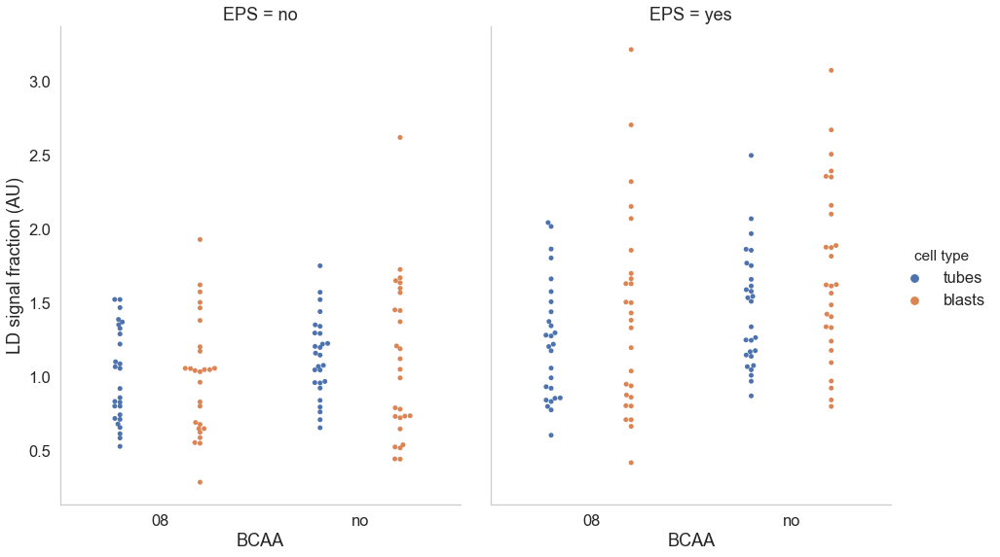

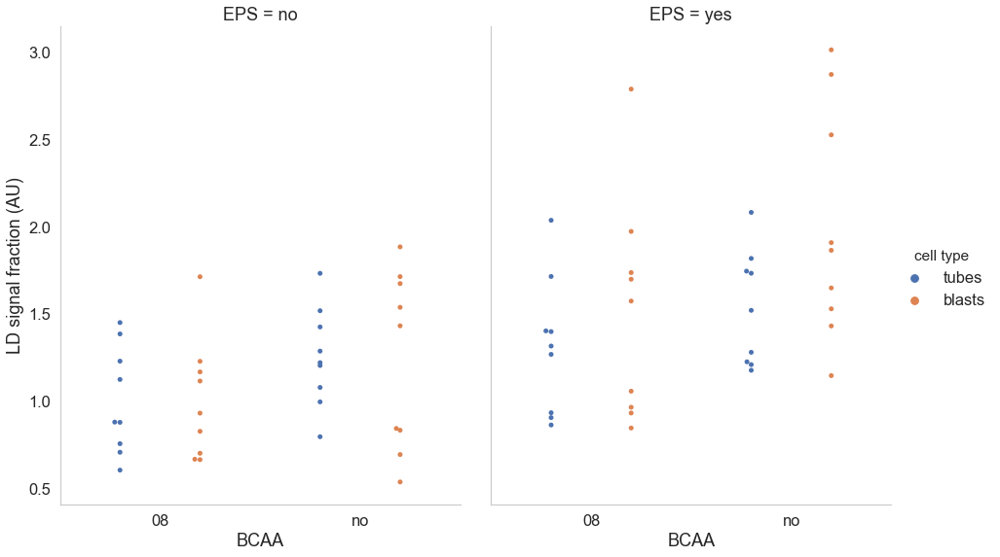

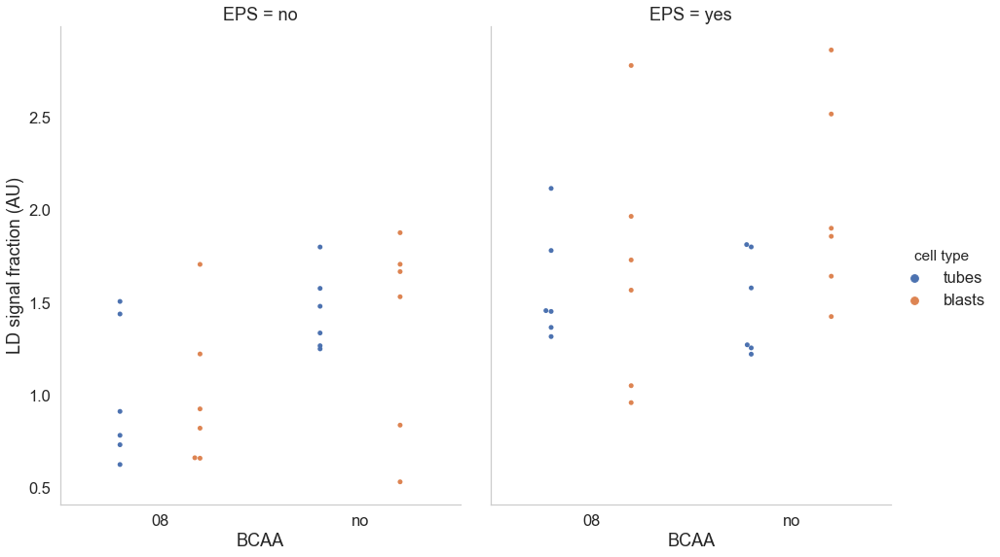

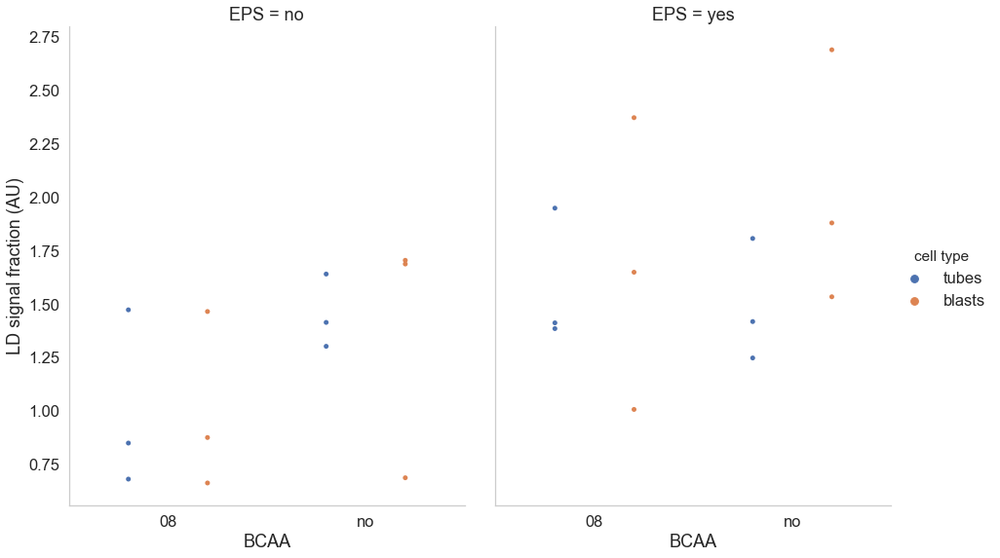

In [10]:
#NORMALIZED REPEAT (2nd dataset)!

import seaborn as sns
sns.set(font_scale=1.5)
sns.set_style("whitegrid", {'axes.grid' : False})

g = sns.catplot(x="BCAA", y="LD signal fraction (AU)",
                hue="cell type", col="EPS",
                data=ready63r_NORM, kind="swarm", dodge=True,
                height=8, aspect=.8);

g.savefig('{}\output_ready63.png'.format(directory))


g = sns.catplot(x="BCAA", y="LD signal fraction (AU)",
                hue="cell type", col="EPS",
                data=avg_ready63r_NORM, kind="swarm", dodge=True,
                height=8, aspect=.8);

g = sns.catplot(x="BCAA", y="LD signal fraction (AU)",
                hue="cell type", col="EPS",
                data=avg_cs_ready63r_NORM, kind="swarm", dodge=True,
                height=8, aspect=.8);



g = sns.catplot(x="BCAA", y="LD signal fraction (AU)",
                hue="cell type", col="EPS",
                data=avg_well_ready63r_NORM, kind="swarm", dodge=True,
                height=8, aspect=.8);



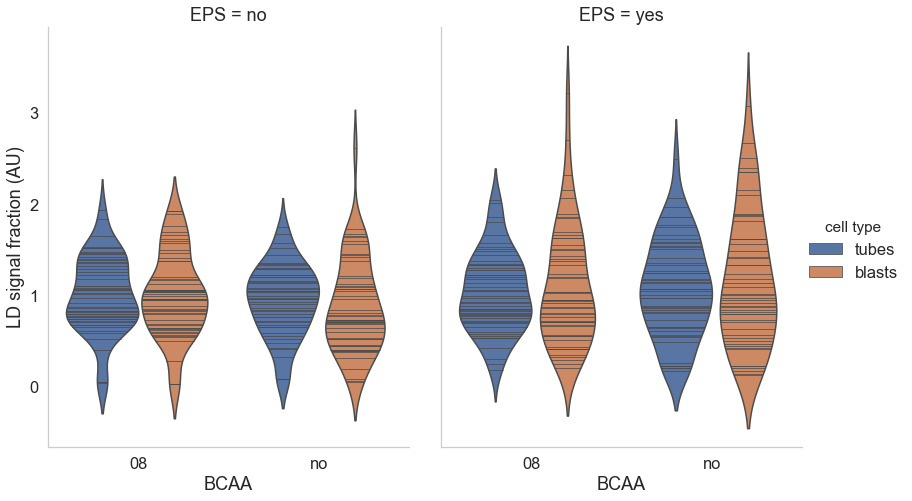

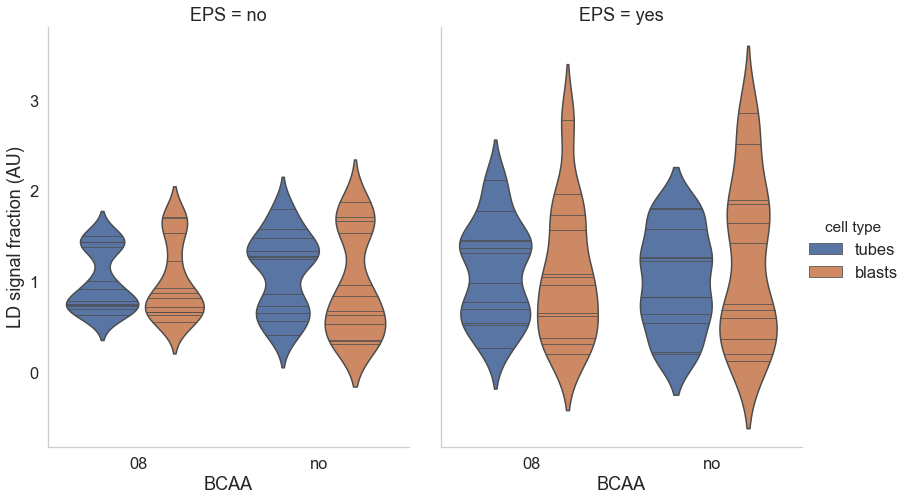

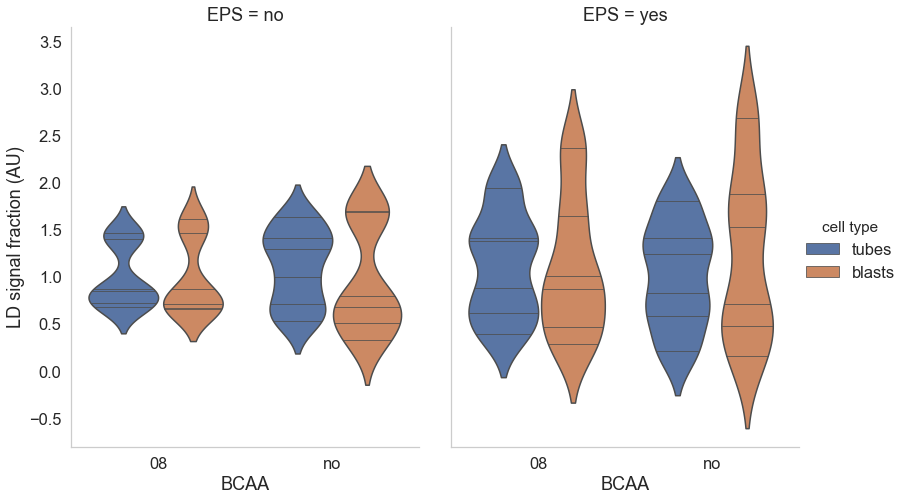

In [11]:

sns.set(font_scale=1.5)
sns.set_style("whitegrid", {'axes.grid' : False})
g = sns.catplot(x="BCAA", y="LD signal fraction (AU)",
                hue="cell type", col="EPS",
                data=ready63_all_NORM, kind="violin", split=False,
                height=7, aspect=.8, inner="stick", bw=.4);

sns.set(font_scale=1.5)
sns.set_style("whitegrid", {'axes.grid' : False})
g = sns.catplot(x="BCAA", y="LD signal fraction (AU)",
                hue="cell type", col="EPS",
                data=avg_cs_ready63_all_NORM, kind="violin", split=False,
                height=7, aspect=.8, inner="stick", bw=.4);

sns.set(font_scale=1.5)
sns.set_style("whitegrid", {'axes.grid' : False})
g = sns.catplot(x="BCAA", y="LD signal fraction (AU)",
                hue="cell type", col="EPS",
                data=avg_well_ready63_all_NORM, kind="violin", split=False,
                height=7, aspect=.8, inner="stick", bw=.4);

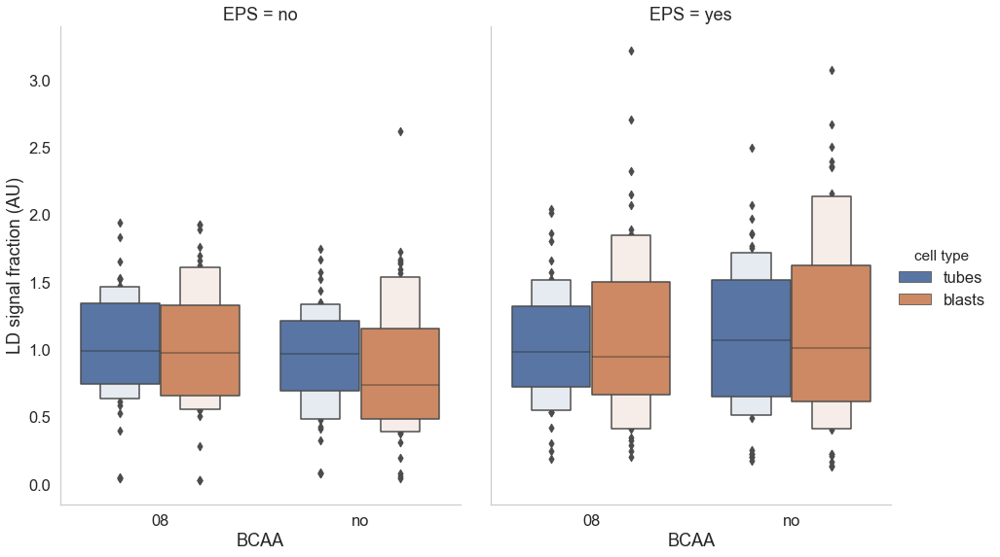

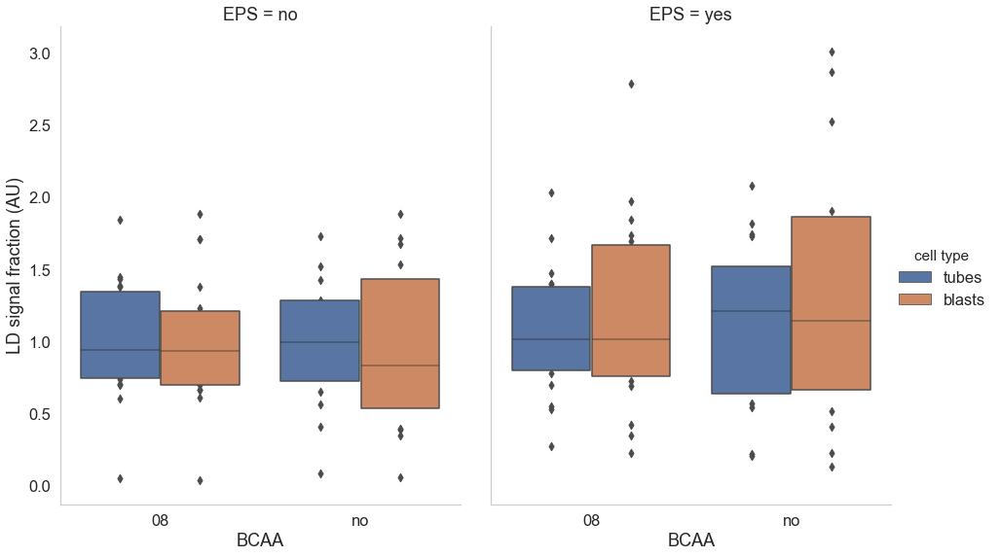

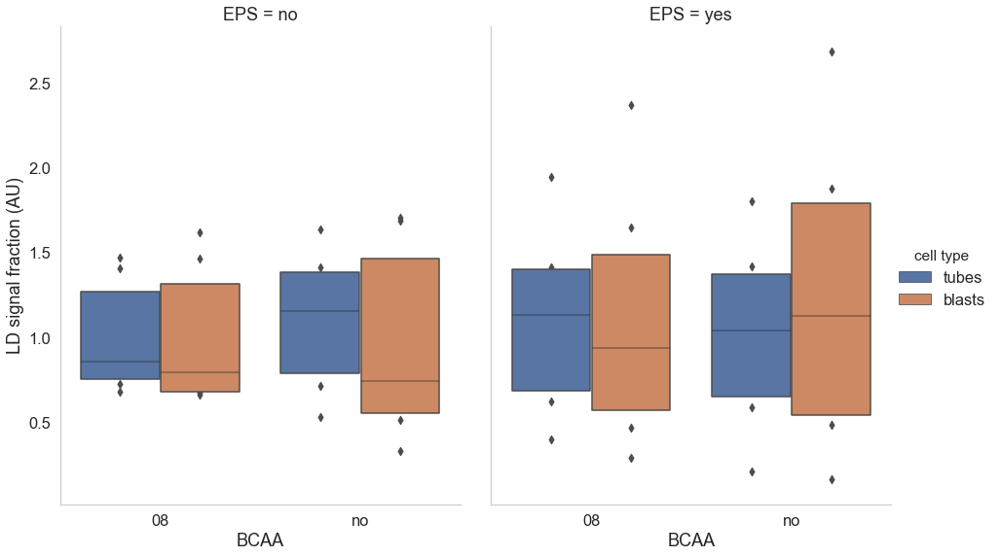

In [21]:
var = "LD signal fraction (AU)"

sns.set(font_scale=1.5)
sns.set_style("whitegrid", {'axes.grid' : False})

g = sns.catplot(x="BCAA", y=var,
                hue="cell type", col="EPS",
                data=ready63_all_NORM, kind="boxen",
                height=8, aspect=.8);

#g.savefig('{}\output.png'.format(directory))

sns.set(font_scale=1.5)
sns.set_style("whitegrid", {'axes.grid' : False})

g = sns.catplot(x="BCAA", y=var,
                hue="cell type", col="EPS",
                data=avg_ready63_all_NORM, kind="boxen",
                height=8, aspect=.8);

#g.savefig('{}\output.png'.format(directory))
sns.set(font_scale=1.5)
sns.set_style("whitegrid", {'axes.grid' : False})

g = sns.catplot(x="BCAA", y=var,
                hue="cell type", col="EPS",
                data=avg_well_ready63_all_NORM, kind="boxen",
                height=8, aspect=.8);

#g.savefig('{}\output.png'.format(directory))

In [17]:
avg_cs_ready63_all_NORM['LD_diam'].dtype
#avg_well_ready63_all_NORM

dtype('float64')

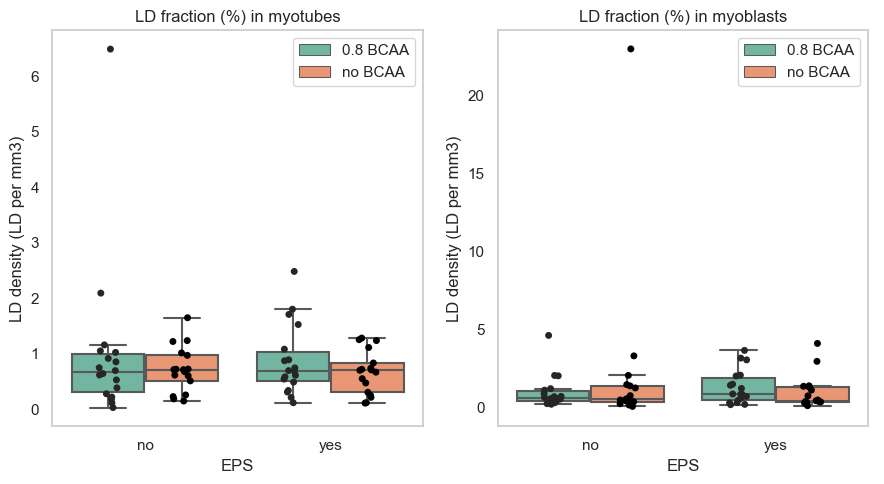

ValueError: List of boxplot statistics and `positions` values must have same the length

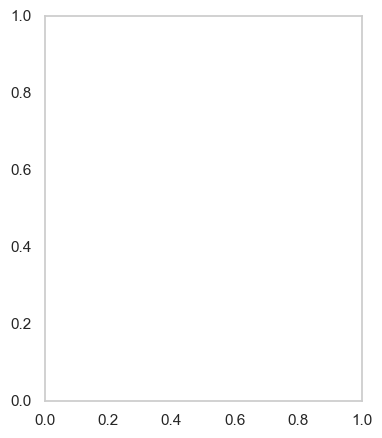

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')

var = 'LD signal fraction (AU)'
marker = 'LD signal fraction (AU)'
var = 'LD density (LD per mm3)'
marker = 'LD fraction (%)'
#var, marker = 'LD_diam', 'LD_diam'
#var = 'LD.vs.PLIN5'
#marker = 'LD-PLIN5 Colocalization'
#var, marker = 'LD_#per_mm3', 'LD number per mm3'
#var, marker = 'LD density (LD per mm3)', 'LD density (LD per mm3)'

tables = {'avg' :avg_ready63_all_NORM, 
          'cs': avg_cs_ready63_all_NORM, 
          'well': avg_well_ready63_all_NORM}

for k, tb in tables.items():
    
    main_var = tb

    cases = [main_var[main_var['cell type'] == 'tubes'], main_var[main_var['cell type'] == 'blasts']]
    cells = ['myotubes', 'myoblasts']

    fig = plt.figure(figsize=(9,5))
    for i, c in enumerate(cases): 
        ax = fig.add_subplot(1, 2, i+1)

        sns.boxplot(x='EPS', y=var, data=c, hue='BCAA', showfliers=False, palette='Set2', ax=ax)
        sns.stripplot(x='EPS', y=var, data=c, hue='BCAA', dodge=True, jitter=True, color='black', ax=ax)

        handles, labels = ax.get_legend_handles_labels()

        ax.legend(handles[0:2], ['0.8 BCAA', 'no BCAA'])
        ax.set_xlabel('EPS')
        ax.set_ylabel(var)
        ax.set_aspect('auto')
        #ax.set_ylim(0, 20)
        plt.title('{} in {}'.format(marker, cells[i]))
    fig.tight_layout()
    plt.show()

    directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs'
    fig.savefig('{}\COMB_{}_{}_63x.png'.format(directory, k, var))

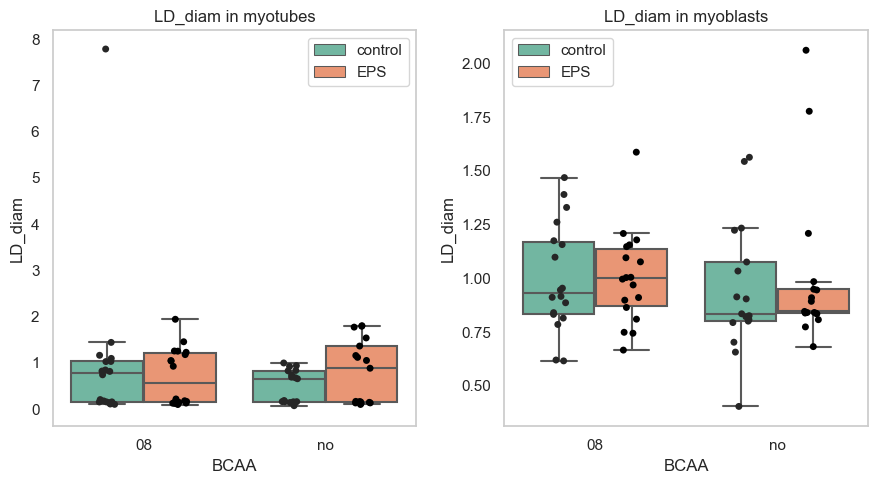

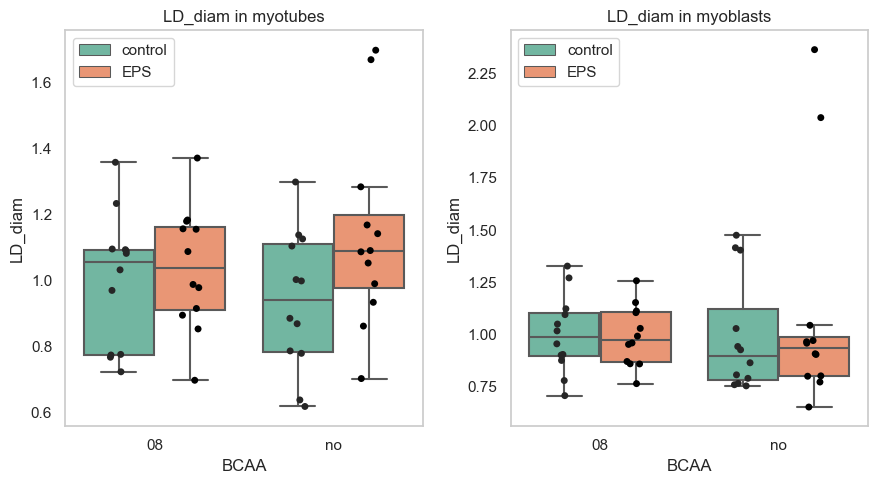

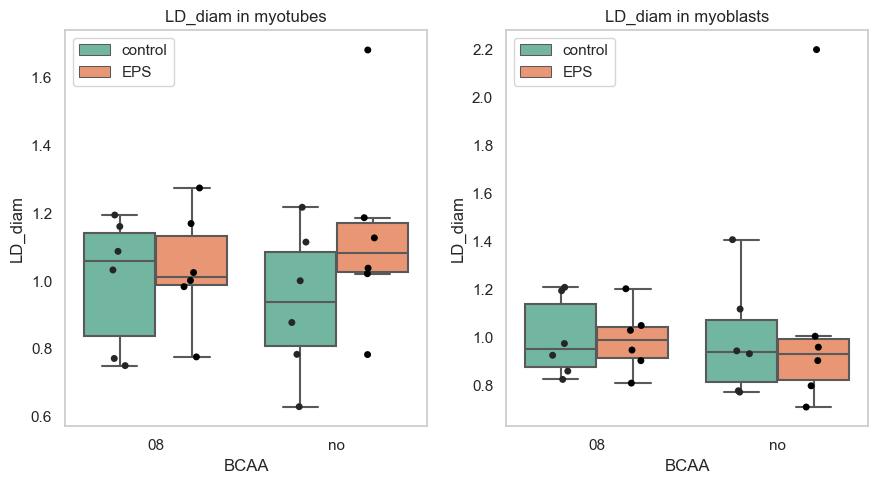

In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')

#var = 'LD signal fraction (AU)'
#marker = 'LD signal fraction (AU)'
var = 'LD_diam'
marker = 'LD_diam'
#var = 'LD.vs.PLIN5'
#marker = 'LD-PLIN5 Colocalization'
#var = 'LD_#per_mm3'
#marker = 'LD number per mm3'

tables = {'avg' :avg_ready63_all_NORM, 
          'cs': avg_cs_ready63_all_NORM, 
          'well': avg_well_ready63_all_NORM}

for k, tb in tables.items():
    main_var = tb

    cases = [main_var[main_var['cell type'] == 'tubes'], main_var[main_var['cell type'] == 'blasts']]
    cells = ['myotubes', 'myoblasts']

    fig = plt.figure(figsize=(9,5))
    for i, c in enumerate(cases): 
        ax = fig.add_subplot(1, 2, i+1)

        sns.boxplot(x='BCAA', y=var, data=c, hue='EPS', showfliers=False, palette='Set2', ax=ax)
        sns.stripplot(x='BCAA', y=var, data=c, hue='EPS', dodge=True, jitter=True, color='black', ax=ax)

        handles, labels = ax.get_legend_handles_labels()

        ax.legend(handles[0:2], ['control', 'EPS'])
        ax.set_xlabel('BCAA')
        ax.set_ylabel(var)
        ax.set_aspect('auto')
        #ax.set_ylim(0, 20)
        plt.title('{} in {}'.format(marker, cells[i]))
    fig.tight_layout()
    plt.show()

    
    directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs'
    fig.savefig('{}\COMB_{}_{}_63x_.png'.format(directory, k, var))


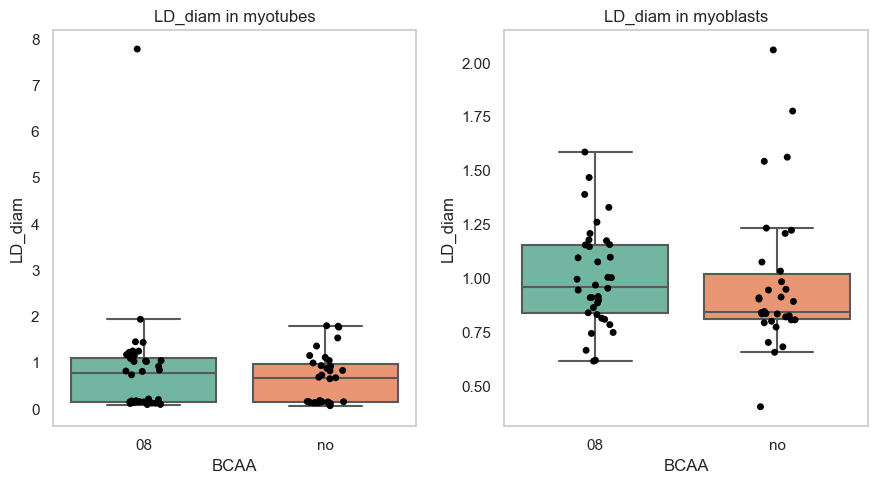

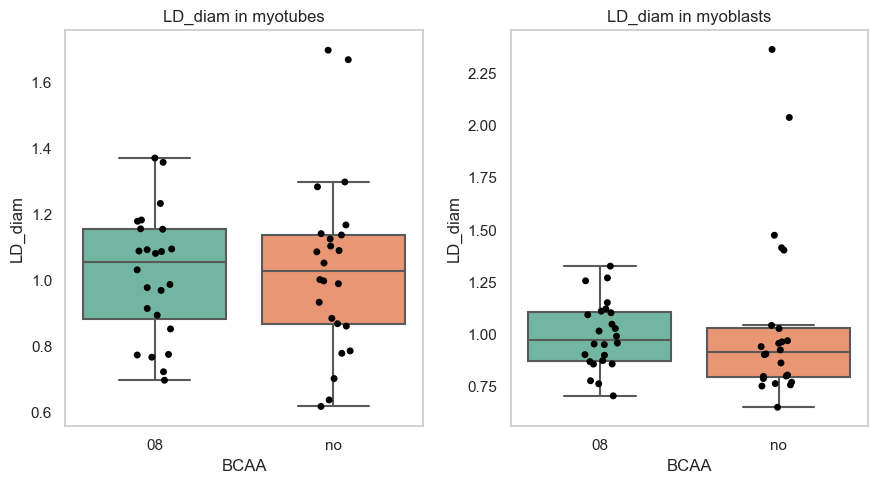

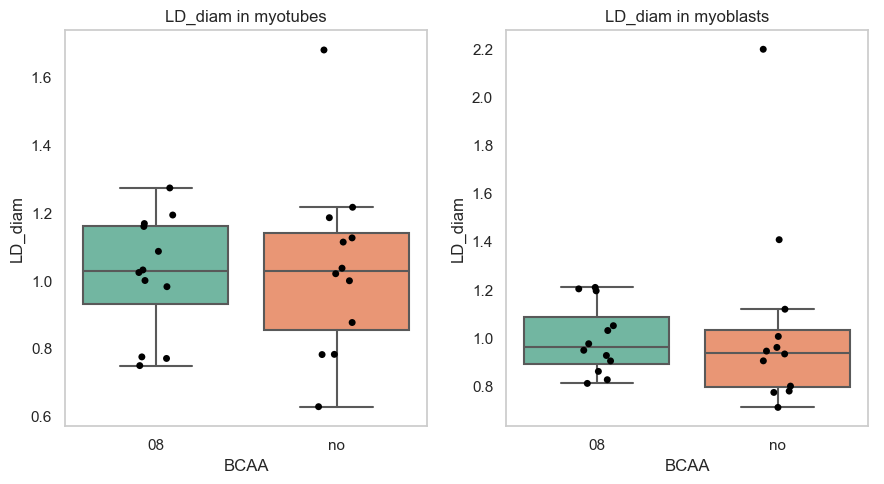

In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')

#var = 'LD signal fraction (AU)'
#marker = 'LD signal fraction (AU)'

var = 'LD_diam'
marker = 'LD_diam'

tables = {'avg' :avg_ready63_all_NORM, 
          'cs': avg_cs_ready63_all_NORM, 
          'well': avg_well_ready63_all_NORM}

for k, tb in tables.items():
    main_var = tb

    cases = [main_var[main_var['cell type'] == 'tubes'], main_var[main_var['cell type'] == 'blasts']]
    cells = ['myotubes', 'myoblasts']

    fig = plt.figure(figsize=(9,5))
    for i, c in enumerate(cases): 
        ax = fig.add_subplot(1, 2, i+1)

        sns.boxplot(x='BCAA', y=var, data=c, showfliers=False, palette='Set2', ax=ax)
        sns.stripplot(x='BCAA', y=var, data=c, dodge=True, jitter=True, color='black', ax=ax)

        handles, labels = ax.get_legend_handles_labels()

        #ax.legend(handles[0:2], ['control', 'EPS'])
        ax.set_xlabel('BCAA')
        ax.set_ylabel(var)
        ax.set_aspect('auto')
        #ax.set_ylim(0, 20)
        plt.title('{} in {}'.format(marker, cells[i]))
    fig.tight_layout()
    plt.show()

    
    directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs'
    fig.savefig('{}\BCAA_{}_{}_63x_.png'.format(directory, k, var))


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

no v.s. yes: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.324e-01 U_stat=2.810e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

no v.s. yes: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.936e-01 U_stat=2.290e+02


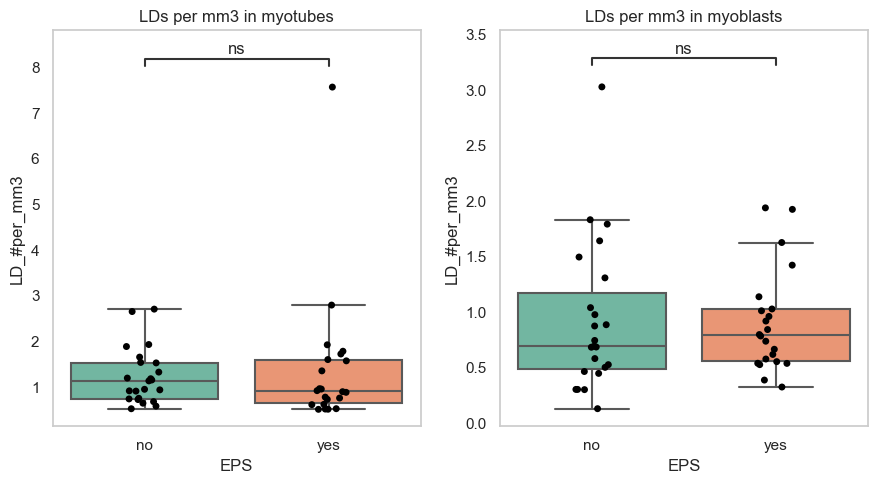

In [69]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statannot import add_stat_annotation


plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')

#var = 'LD signal fraction (AU)'
#marker = 'LD signal fraction (AU)'

var = 'LD_#per_mm3'
marker = 'LDs per mm3'

#var = 'LD_diam'
#marker = 'LD_diam'

tables = {'avg' :avg_ready63_all_NORM, 
          'cs': avg_cs_ready63_all_NORM, 
          'well': avg_well_ready63_all_NORM}

#for k, tb in tables.items():
main_var = z_main

cases = [main_var[main_var['cell type'] == 'tubes'], main_var[main_var['cell type'] == 'blasts']]
cells = ['myotubes', 'myoblasts']

fig = plt.figure(figsize=(9,5))
for i, c in enumerate(cases): 
    ax = fig.add_subplot(1, 2, i+1)

    sns.boxplot(x='EPS', y=var, data=c, showfliers=False, palette='Set2', ax=ax)
    sns.stripplot(x='EPS', y=var, data=c, dodge=True, jitter=True, color='black', ax=ax)

    handles, labels = ax.get_legend_handles_labels()

    #ax.legend(handles[0:2], ['control', 'EPS'])
    #ax.set_xlabel('EPS')
    ax.set_ylabel(var)
    #ax.set_aspect('auto')
    #ax.set_ylim(0, 20)
    plt.title('{} in {}'.format(marker, cells[i]))





    test_results = add_stat_annotation(ax, data=c, x='EPS', y=var,
                                       box_pairs=[("no", "yes")],
                                       test='Mann-Whitney', text_format='star',
                                       loc='inside', verbose=1)
    test_results

fig.tight_layout()
plt.show()

    
    #directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs'
    #fig.savefig('{}\EPS_{}_{}_63x_.png'.format(directory, k, var))


C:\Devel\Anaconda3\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


('LD_#per_mm3',
 'LD_diam',
 'LD.vs.PLIN2',
 'LD.vs.PLIN5',
 'LD.vs.PGC1a',
 'LD.vs.PCK1')

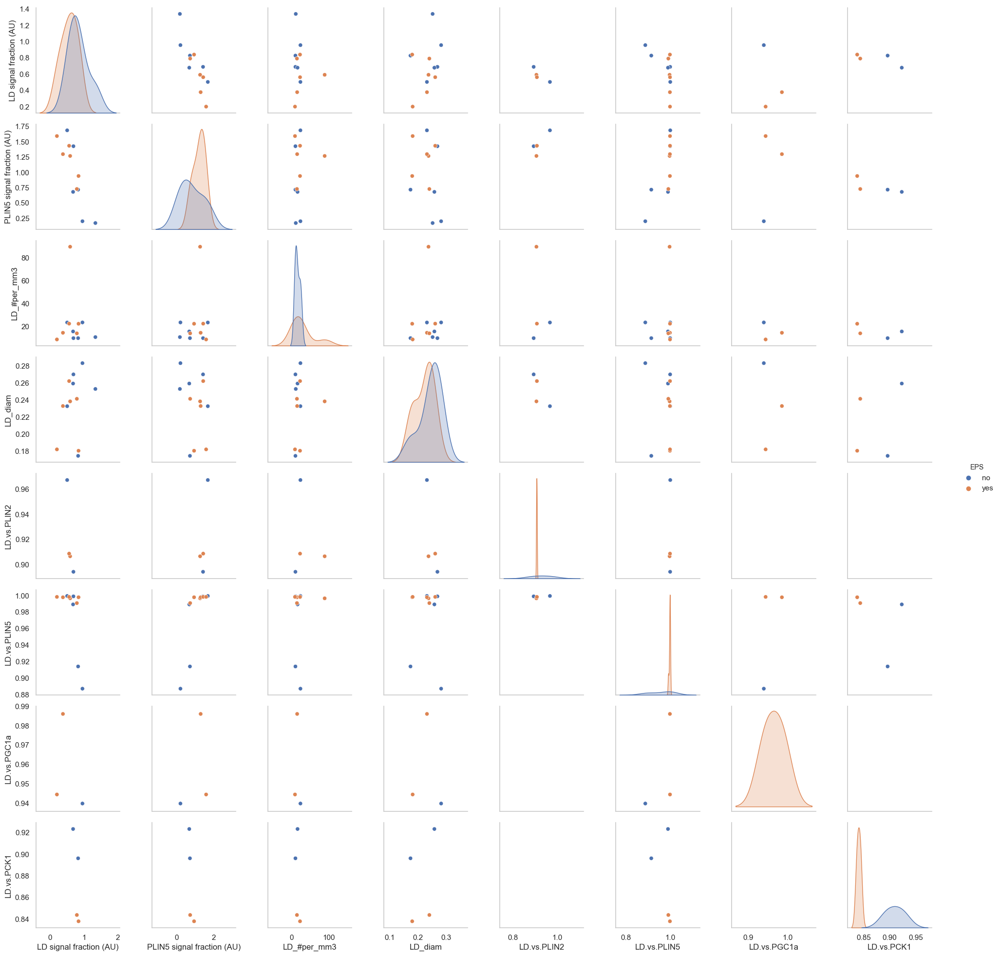

In [25]:
import seaborn as sns
#sns.set_theme(style="ticks")
#varibs = avg_cs_ready63.iloc[:,[0,4]]
#print(varibs)

sns.set(font_scale=1)
sns.set_style("whitegrid", {'axes.grid' : False})

g = sns.pairplot(avg_well_ready63[avg_well_ready63['cell type'] == 'tubes'], hue="EPS",
                x_vars=['LD signal fraction (AU)', 'PLIN5 signal fraction (AU)', 'LD_#per_mm3','LD_diam','LD.vs.PLIN2', 'LD.vs.PLIN5','LD.vs.PGC1a', 'LD.vs.PCK1'],
                y_vars=['LD signal fraction (AU)', 'PLIN5 signal fraction (AU)', 'LD_#per_mm3','LD_diam','LD.vs.PLIN2', 'LD.vs.PLIN5','LD.vs.PGC1a', 'LD.vs.PCK1'],
                )

directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs'
#g.savefig('{}\pairplot_LD_related_by_BCAA_blasts.png'.format(directory))
'LD_#per_mm3','LD_diam','LD.vs.PLIN2', 'LD.vs.PLIN5','LD.vs.PGC1a', 'LD.vs.PCK1'

P value (cs): 0.029755443334579468
P value (avg): 0.011608581058681011
P value (cs_all): 0.029755443334579468
P value (well_all): 0.018992988392710686


C:\Devel\Anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:2064: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
C:\Devel\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:248: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
C:\Devel\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:250: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


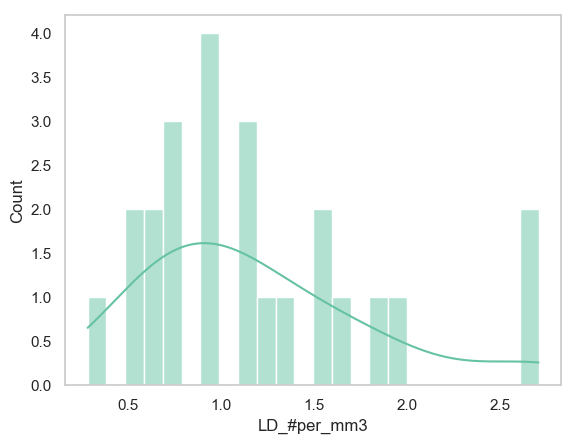

In [153]:
#CHECK FOR NORMALITY WITH SHAPIRO-WILK TEST
from scipy import stats

#var = 'LD.vs.PLIN5'
#var= 'LD signal fraction (AU)'
var = 'LD_#per_mm3'
#var = 'LD_diam'
#variable to test:
data = avg_cs_ready63_all_NORM[var][(avg_cs_ready63_all_NORM['cell type'] == 'tubes')&(avg_cs_ready63_all_NORM['EPS'] == 'no')]
data_log = np.log(avg_cs_ready63_all_NORM[var][(avg_cs_ready63_all_NORM['cell type'] == 'blasts')&(avg_cs_ready63_all_NORM['EPS'] == 'yes')])
shapiro_test = stats.shapiro(data)
#shapiro_test = stats.shapiro(np.log(data))

#shapiro_test.statistic
print('P value (cs):',shapiro_test[1])
#g= sns.histplot(data=data, kde=True, bins=len(data))

data = avg_ready63_all_NORM[var][(avg_ready63_all_NORM['cell type'] == 'tubes')&(avg_ready63_all_NORM['BCAA'] == 'no')&(avg_ready63_all_NORM['EPS'] == 'no')]
#data = avg_ready63_all_NORM[var][(avg_ready63_all_NORM['cell type'] == 'tubes')]
data_log = np.log(avg_well_ready63_all_NORM[var][(avg_well_ready63_all_NORM['cell type'] == 'blasts')&(avg_well_ready63_all_NORM['BCAA'] == 'no')])
shapiro_test = stats.shapiro(data)
#shapiro_test = stats.shapiro(np.log(data))
#shapiro_test.statistic
print('P value (avg):',shapiro_test[1])
#g= sns.histplot(data=data, kde=True, bins=len(data))
directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs'
#plt.savefig('{}\{}_EPS_distribution_avg.png'.format(directory, var))


#variable to test:
data = avg_cs_ready63_all_NORM[var][(avg_cs_ready63_all_NORM['cell type'] == 'tubes')&(avg_cs_ready63_all_NORM['EPS'] == 'no')]
data_log = np.log(avg_cs_ready63_all_NORM[var][(avg_cs_ready63_all_NORM['cell type'] == 'blasts')&(avg_cs_ready63_all_NORM['EPS'] == 'yes')])
shapiro_test = stats.shapiro(data)
#shapiro_test = stats.shapiro(np.log(data))
#shapiro_test.statistic
print('P value (cs_all):',shapiro_test[1])
g= sns.histplot(data=data, kde=True, bins=len(data))


data = avg_well_ready63_all_NORM[var][(avg_well_ready63_all_NORM['cell type'] == 'tubes')&(avg_well_ready63_all_NORM['BCAA'] == 'no')]
data_log = np.log(avg_well_ready63_all_NORM[var][(avg_well_ready63_all_NORM['cell type'] == 'blasts')&(avg_well_ready63_all_NORM['BCAA'] == 'no')])
shapiro_test = stats.shapiro(data)
#shapiro_test = stats.shapiro(np.log(data))
#shapiro_test.statistic
print('P value (well_all):',shapiro_test[1])
#g= sns.histplot(data=data, kde=True, bins=len(data))


In [346]:
avg_ready63_all_NORM

,fileName,BCAA,EPS,LD signal fraction (AU),PLIN5 signal fraction (AU),PLIN2 signal fraction (AU),LD_#,LD_#per_mm3,LD_diam,PGC1a signal fraction (AU),PCK1 signal fraction (AU),LD.vs.PLIN2,PLIN2.vs.LD,LD.vs.PLIN5,PLIN5.vs.LD,PLIN5.vs.PLIN2,PLIN2.vs.PLIN5,LD.vs.PGC1a,PGC1a.vs.LD,PLIN5.vs.PGC1a,PGC1a.vs.PLIN5,LD.vs.PCK1,PCK1.vs.LD,PLIN5.vs.PCK1,PCK1.vs.PLIN5,cell type
0,1a_CTR_08BCAA_63x,08,no,1.115341,0.599901,1.023937,2.786737,1.578149,0.207776,NaN,NaN,1.001213,1.010399,1.082382,1.063406,1.000723,0.944821,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tubes
1,1d_CTR_08BCAA_63x,08,no,0.694253,1.914225,0.995115,1.017653,0.521553,0.178138,NaN,NaN,1.000541,1.003056,1.154375,1.051810,1.004090,1.026122,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tubes
2,1g_CTR_08BCAA_63x,08,no,0.751175,2.806428,0.980948,1.777672,0.332913,0.157364,NaN,NaN,0.998246,0.986546,1.156168,1.058520,0.995187,1.029057,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tubes
3,2a_CTR_08BCAA_63x,08,no,1.843674,0.398142,NaN,0.120229,0.404628,7.784971,1.091293,NaN,NaN,NaN,1.001022,1.072585,NaN,NaN,1.002155,0.999967,1.006331,1.089251,NaN,NaN,NaN,NaN,tubes
4,2d_CTR_08BCAA_63x,08,no,1.381049,0.294782,NaN,0.304866,0.527735,0.156338,0.937860,NaN,NaN,NaN,0.913647,1.067002,NaN,NaN,0.995589,0.999867,0.990842,1.003737,NaN,NaN,NaN,NaN,tubes
5,2g_CTR_08BCAA_63x,08,no,1.429884,0.270141,NaN,0.291985,3.351592,0.157955,0.970848,NaN,NaN,NaN,0.893466,1.070062,NaN,NaN,1.002255,1.000167,1.002827,0.907012,NaN,NaN,NaN,NaN,tubes
6,3a_CTR_08BCAA_63x,08,no,0.999134,0.346132,NaN,0.605439,0.730018,0.140632,NaN,1.026137,NaN,NaN,0.963840,1.063674,NaN,NaN,NaN,NaN,NaN,NaN,1.195577,1.206636,0.915512,0.775814,tubes
7,3d_CTR_08BCAA_63x,08,no,0.736892,1.205011,NaN,1.846374,1.427975,0.112207,NaN,0.828200,NaN,NaN,1.150154,1.067861,NaN,NaN,NaN,NaN,NaN,NaN,1.115498,1.205001,1.026574,1.115491,tubes
8,3g_CTR_08BCAA_63x,08,no,0.048599,1.165238,NaN,0.249046,0.125437,0.104619,NaN,1.145663,NaN,NaN,0.684946,0.485079,NaN,NaN,NaN,NaN,NaN,NaN,0.688925,0.588364,1.057914,1.108694,tubes
9,1a_CTR_08BCAA_63x,08,no,0.939427,0.479899,0.664683,0.483249,0.681824,0.915698,NaN,NaN,0.932462,0.997953,1.109488,1.119128,1.143474,0.726920,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,blasts


In [171]:
#just changing the name of the columns (and copying the dataframe) in order for the next statistcal methods to work
new_cols = []
for v in avg_cs_ready63_all.columns:
    new_cols.append(v.replace('(AU)','').replace(' ','').replace('#','').replace('.','').replace('(LDpermm3)',''))
avg_cs_ready63_ = avg_cs_ready63_all_NORM.copy()
avg_cs_ready63_.columns = new_cols
avg_cs_ready63_.columns

avg_well_ready63_ = avg_well_ready63_all_NORM.copy()
avg_well_ready63_.columns = new_cols
avg_well_ready63_.columns

avg_ready63_ = avg_ready63_all_NORM.copy()
avg_ready63_.columns = new_cols
avg_ready63_.columns

Index(['fileName', 'BCAA', 'EPS', 'LDsignalfraction', 'PLIN5signalfraction',
       'PLIN2signalfraction', 'LD_', 'LD_per_mm3', 'LD_diam',
       'PGC1asignalfraction', 'PCK1signalfraction', 'LDvsPLIN2', 'PLIN2vsLD',
       'LDvsPLIN5', 'PLIN5vsLD', 'PLIN5vsPLIN2', 'PLIN2vsPLIN5', 'LDvsPGC1a',
       'PGC1avsLD', 'PLIN5vsPGC1a', 'PGC1avsPLIN5', 'LDvsPCK1', 'PCK1vsLD',
       'PLIN5vsPCK1', 'PCK1vsPLIN5', 'LDdensity', 'celltype'],
      dtype='object')

In [173]:
#LETS USE A 2-WAY ANOVA TO COMPARE GROUPS
#'LD signal fraction (AU)' tubes was always normally distributed independently from BCAA or EPS treatment. In the case of myoblasts, with EPS, there might be some transformations needed, or not
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from statsmodels.graphics.factorplots import interaction_plot
import matplotlib.pyplot as plt
from scipy import stats

data = avg_ready63_.copy()
#var = 'LDsignalfraction'
#var = 'LD_per_mm3'
#var= 'LD_diam'
var='LDdensity'
log = 'log_{}'.format(var)
data[log] = list(np.log(data.loc[:,var]))

run = var #change between var (untransformed data) and log (log transformed data)
#run = log

print(var,'\n')

#mod = ols('{}~BCAA+EPS+BCAA*EPS'.format(var), data = data).fit()
mod_tubes = ols('{}~BCAA+EPS+BCAA*EPS'.format(run), data = data[data['celltype'] == 'tubes']).fit()
mod_blasts = ols('{}~BCAA+EPS+BCAA*EPS'.format(run), data = data[data['celltype'] == 'blasts']).fit()

#aov_all = sm.stats.anova_lm(mod, type=2)
aov_tubes = sm.stats.anova_lm(mod_tubes, type=2)
aov_blasts = sm.stats.anova_lm(mod_blasts, type=2)
#print('\n\n all cells in all coverslips (averaged two closest images)\n',aov_all)
print('\n\n myotubes in all coverslips (averaged two closest images)\n',aov_tubes)
print('\n myoblasts in all coverslips (averaged two closest images)\n\n',aov_blasts)

#data = avg_cs_ready63_.copy()
log = 'log_{}'.format(var)
data[log] = list(np.log(data.loc[:,var]))

run = var #change between var (untransformed data) and log (log transformed data)
run = log

mod_tubes = ols('{}~BCAA+EPS+BCAA*EPS'.format(run), data = data[data['celltype'] == 'tubes']).fit()
mod_blasts = ols('{}~BCAA+EPS+BCAA*EPS'.format(run), data = data[data['celltype'] == 'blasts']).fit()

aov_tubes = sm.stats.anova_lm(mod_tubes, type=2)
aov_blasts = sm.stats.anova_lm(mod_blasts, type=2)
print('\n\n myotubes in two closest coverslips (averaged two closest images)\n',aov_tubes)
print('\n myoblasts in two closest coverslips (averaged two closest images)\n\n',aov_blasts)

ttest = sm.stats.ttest_ind(data[var][(data['EPS'] == 'yes')&(data['celltype'] == 'tubes')], data[var][(data['EPS'] == 'no')&(data['celltype'] == 'tubes')])
print(ttest)

#data = avg_well_ready63_.copy()
log = 'log_{}'.format(var)
data[log] = list(np.log(data.loc[:,var]))

run = var #change between var (untransformed data) and log (log transformed data)
run = log

#mod = ols('{}~BCAA+EPS+BCAA*EPS'.format(var), data = data).fit()
mod_tubes = ols('{}~BCAA+EPS+BCAA*EPS'.format(run), data = data[data['celltype'] == 'tubes']).fit()
mod_blasts = ols('{}~BCAA+EPS+BCAA*EPS'.format(run), data = data[data['celltype'] == 'blasts']).fit()

#aov_all = sm.stats.anova_lm(mod, type=2)
aov_tubes = sm.stats.anova_lm(mod_tubes, type=2)
aov_blasts = sm.stats.anova_lm(mod_blasts, type=2)
print('\n\n myotubes in averaged wells (averaged two closest coverslips after averaging two closest images)\n',aov_tubes)
print('\n myoblasts in averaged wells (averaged two closest coverslips after averaging two closest images)\n',aov_blasts)


#Let's do some ttests
data = avg_ready63_.copy()
ttest = sm.stats.ttest_ind(data[var][(data['BCAA'] == '08')&(data['celltype'] == 'tubes')], data[var][(data['BCAA'] == 'no')&(data['celltype'] == 'tubes')])
mann = stats.mannwhitneyu(data[var][(data['BCAA'] == '08')&(data['celltype'] == 'tubes')], data[var][(data['BCAA'] == 'no')&(data['celltype'] == 'tubes')], use_continuity=True, alternative=None)
print('\n T-Test for LD fraction in myotubes treated with BCAA ', ttest)
print('\n Mann-Whitney for LD fraction in myotubes treated with BCAA ', mann)


ttest = sm.stats.ttest_ind(data[var][(data['BCAA'] == '08')&(data['celltype'] == 'blasts')], data[var][(data['BCAA'] == 'no')&(data['celltype'] == 'blasts')])
mann = stats.mannwhitneyu(data[var][(data['BCAA'] == '08')&(data['celltype'] == 'blasts')], data[var][(data['BCAA'] == 'no')&(data['celltype'] == 'blasts')], use_continuity=True, alternative=None)
print('\n T-Test for LD fraction in myoblasts treated with BCAA ', ttest)
print('\n Mann-Whitney for LD fraction in myoblasts treated with BCAA ', mann)

ttest = sm.stats.ttest_ind(data[var][(data['EPS'] == 'yes')&(data['celltype'] == 'tubes')], data[var][(data['EPS'] == 'no')&(data['celltype'] == 'tubes')])
mann = stats.mannwhitneyu(data[var][(data['EPS'] == 'yes')&(data['celltype'] == 'tubes')], data[var][(data['EPS'] == 'no')&(data['celltype'] == 'tubes')], use_continuity=True, alternative=None)
print('\n T-Test for LD fraction in myotubes treated with EPS ', ttest)
print('\n Mann-Whitney for LD fraction in myotubes treated with EPS ', mann)

ttest = sm.stats.ttest_ind(data[var][(data['EPS'] == 'yes')&(data['celltype'] == 'blasts')], data[var][(data['EPS'] == 'no')&(data['celltype'] == 'blasts')])
mann = stats.mannwhitneyu(data[var][(data['EPS'] == 'yes')&(data['celltype'] == 'blasts')], data[var][(data['EPS'] == 'no')&(data['celltype'] == 'blasts')], use_continuity=True, alternative=None)
print('\n T-Test for LD fraction in myoblasts treated with EPS ', ttest)
print('\n Mann-Whitney for LD fraction in myoblasts treated with EPS ', mann)



#Now between subgroups (EPS-BCAA combinations):
ttest = sm.stats.ttest_ind(data[var][(data['BCAA'] == '08')&(data['EPS'] == 'no')&(data['celltype'] == 'tubes')], data[var][(data['BCAA'] == 'no')&(data['EPS'] == 'no')&(data['celltype'] == 'tubes')])
mann = stats.mannwhitneyu(data[var][(data['BCAA'] == '08')&(data['EPS'] == 'no')&(data['celltype'] == 'tubes')], data[var][(data['BCAA'] == 'no')&(data['EPS'] == 'no')&(data['celltype'] == 'tubes')], use_continuity=True, alternative=None)
print('\n\n T-Test for LD fraction in myotubes treated with BCAA without EPS ', ttest)
print('\n Mann-Whitney for LD fraction in myotubes treated with BCAA without EPS ', mann)

ttest = sm.stats.ttest_ind(data[var][(data['BCAA'] == '08')&(data['EPS'] == 'yes')&(data['celltype'] == 'tubes')], data[var][(data['BCAA'] == 'no')&(data['EPS'] == 'yes')&(data['celltype'] == 'tubes')])
mann = stats.mannwhitneyu(data[var][(data['BCAA'] == '08')&(data['EPS'] == 'yes')&(data['celltype'] == 'tubes')], data[var][(data['BCAA'] == 'no')&(data['EPS'] == 'yes')&(data['celltype'] == 'tubes')], use_continuity=True, alternative=None)
print('\n T-Test for LD fraction in myotubes treated with BCAA in EPS ', ttest)
print('\n Mann-Whitney for LD fraction in myotubes treated with BCAA in EPS ', mann)

ttest = sm.stats.ttest_ind(data[var][(data['BCAA'] == 'no')&(data['EPS'] == 'no')&(data['celltype'] == 'tubes')], data[var][(data['BCAA'] == 'no')&(data['EPS'] == 'yes')&(data['celltype'] == 'tubes')])
mann = stats.mannwhitneyu(data[var][(data['BCAA'] == 'no')&(data['EPS'] == 'no')&(data['celltype'] == 'tubes')], data[var][(data['BCAA'] == 'no')&(data['EPS'] == 'yes')&(data['celltype'] == 'tubes')], use_continuity=True, alternative=None)
print('\n T-Test for LD fraction in myotubes treated with EPS without BCAA', ttest)
print('\n Mann-Whitney for LD fraction in myotubes treated with EPS without BCAA ', mann)

ttest = sm.stats.ttest_ind(data[var][(data['BCAA'] == '08')&(data['EPS'] == 'yes')&(data['celltype'] == 'tubes')], data[var][(data['BCAA'] == '08')&(data['EPS'] == 'no')&(data['celltype'] == 'tubes')])
mann = stats.mannwhitneyu(data[var][(data['BCAA'] == '08')&(data['EPS'] == 'yes')&(data['celltype'] == 'tubes')], data[var][(data['BCAA'] == '08')&(data['EPS'] == 'no')&(data['celltype'] == 'tubes')], use_continuity=True, alternative=None)
print('\n T-Test for LD fraction in myotubes treated with EPS with BCAA ', ttest)
print('\n Mann-Whitney for LD fraction in myotubes treated with EPS with BCAA ', mann)

ttest = sm.stats.ttest_ind(data[var][(data['BCAA'] == '08')&(data['EPS'] == 'no')&(data['celltype'] == 'blasts')], data[var][(data['BCAA'] == 'no')&(data['EPS'] == 'no')&(data['celltype'] == 'blasts')])
mann = stats.mannwhitneyu(data[var][(data['BCAA'] == '08')&(data['EPS'] == 'no')&(data['celltype'] == 'blasts')], data[var][(data['BCAA'] == 'no')&(data['EPS'] == 'no')&(data['celltype'] == 'blasts')], use_continuity=True, alternative=None)
print('\n\n T-Test for LD fraction in myoblasts treated with BCAA without EPS ', ttest)
print('\n Mann-Whitney for LD fraction in myoblasts treated with BCAA without EPS ', mann)

ttest = sm.stats.ttest_ind(data[var][(data['BCAA'] == '08')&(data['EPS'] == 'yes')&(data['celltype'] == 'blasts')], data[var][(data['BCAA'] == 'no')&(data['EPS'] == 'yes')&(data['celltype'] == 'blasts')])
mann = stats.mannwhitneyu(data[var][(data['BCAA'] == '08')&(data['EPS'] == 'yes')&(data['celltype'] == 'blasts')], data[var][(data['BCAA'] == 'no')&(data['EPS'] == 'yes')&(data['celltype'] == 'blasts')], use_continuity=True, alternative=None)
print('\n T-Test for LD fraction in myoblasts treated with BCAA in EPS ', ttest)
print('\n Mann-Whitney for LD fraction in myoblasts treated with BCAA in EPS ', mann)


ttest = sm.stats.ttest_ind(data[var][(data['BCAA'] == 'no')&(data['EPS'] == 'no')&(data['celltype'] == 'blasts')], data[var][(data['BCAA'] == 'no')&(data['EPS'] == 'yes')&(data['celltype'] == 'blasts')])
mann = stats.mannwhitneyu(data[var][(data['BCAA'] == 'no')&(data['EPS'] == 'no')&(data['celltype'] == 'blasts')], data[var][(data['BCAA'] == 'no')&(data['EPS'] == 'yes')&(data['celltype'] == 'blasts')], use_continuity=True, alternative=None)
print('\n T-Test for LD fraction in myoblasts treated without EPS without BCAA', ttest)
print('\n Mann-Whitney for LD fraction in myoblasts treated with EPS without BCAA ', mann)


ttest = sm.stats.ttest_ind(data[var][(data['BCAA'] == '08')&(data['EPS'] == 'yes')&(data['celltype'] == 'blasts')], data[var][(data['BCAA'] == '08')&(data['EPS'] == 'no')&(data['celltype'] == 'blasts')])
mann = stats.mannwhitneyu(data[var][(data['BCAA'] == '08')&(data['EPS'] == 'yes')&(data['celltype'] == 'blasts')], data[var][(data['BCAA'] == '08')&(data['EPS'] == 'no')&(data['celltype'] == 'blasts')], use_continuity=True, alternative=None)
print('\n T-Test for LD fraction in myoblasts treated with EPS with BCAA ', ttest)
print('\n Mann-Whitney for LD fraction in myoblasts treated with EPS with BCAA ', mann)




LDdensity 



 myotubes in all coverslips (averaged two closest images)
             df     sum_sq   mean_sq         F    PR(>F)
BCAA       1.0   1.068195  1.068195  1.471756  0.229393
EPS        1.0   0.150838  0.150838  0.207824  0.649975
BCAA:EPS   1.0   0.025160  0.025160  0.034666  0.852869
Residual  66.0  47.902545  0.725796       NaN       NaN

 myoblasts in all coverslips (averaged two closest images)

             df      sum_sq    mean_sq         F    PR(>F)
BCAA       1.0    3.131417   3.131417  0.391412  0.533716
EPS        1.0    3.023449   3.023449  0.377917  0.540834
BCAA:EPS   1.0   10.133850  10.133850  1.266683  0.264466
Residual  66.0  528.020240   8.000307       NaN       NaN


 myotubes in two closest coverslips (averaged two closest images)
             df     sum_sq   mean_sq         F    PR(>F)
BCAA       1.0   0.133750  0.133750  0.168619  0.682672
EPS        1.0   0.043388  0.043388  0.054699  0.815803
BCAA:EPS   1.0   0.477244  0.477244  0.601661  0.440716
Re

In [6]:
plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')


main_var = avg_cs_ready63

var = [main_var[main_var['cell type'] == 'tubes'], main_var[main_var['cell type'] == 'blasts']]
cells = ['myotubes', 'myoblasts']
fig = plt.figure(figsize=(9,5))
for i, v in enumerate(var): 
    ax = fig.add_subplot(1, 2, i+1)

    sns.boxplot(x='EPS', y='LD_diam', data=v, hue='BCAA', showfliers=False, palette='Set2', ax=ax)
    sns.stripplot(x='EPS', y='LD_diam', data=v, hue='BCAA', dodge=True, jitter=True, color='black', ax=ax)

    handles, labels = ax.get_legend_handles_labels()

    # 4 legends for defaul: boxplot x 2 species, and stripplot x 2 species
    # use the first 2 legends
    ax.legend(handles[0:2], ['BCAA', 'control'])
    ax.set_xlabel('EPS')
    ax.set_ylabel('LD_diam')
    ax.set_aspect('auto')
    #ax.set_ylim(0, 20)
    plt.title('LD diam in {}'.format(cells[i]))
fig.tight_layout()
plt.show()



main_var = avg_cs_ready63

var = [main_var[main_var['cell type'] == 'tubes'], main_var[main_var['cell type'] == 'blasts']]
cells = ['myotubes', 'myoblasts']
fig = plt.figure(figsize=(9,5))
for i, v in enumerate(var): 
    ax = fig.add_subplot(1, 2, i+1)

    sns.boxplot(x='EPS', y='LD_#per_mm3', data=v, hue='BCAA', showfliers=False, palette='Set2', ax=ax)
    sns.stripplot(x='EPS', y='LD_#per_mm3', data=v, hue='BCAA', dodge=True, jitter=True, color='black', ax=ax)

    handles, labels = ax.get_legend_handles_labels()

    # 4 legends for defaul: boxplot x 2 species, and stripplot x 2 species
    # use the first 2 legends
    ax.legend(handles[0:2], ['BCAA', 'control'])
    ax.set_xlabel('EPS')
    ax.set_ylabel('LDs per mm3')
    ax.set_aspect('auto')
    #ax.set_ylim(0, 20)
    plt.title('LDs per mm3 in {}'.format(cells[i]))
fig.tight_layout()
plt.show()



NameError: name 'avg_cs_ready63' is not defined

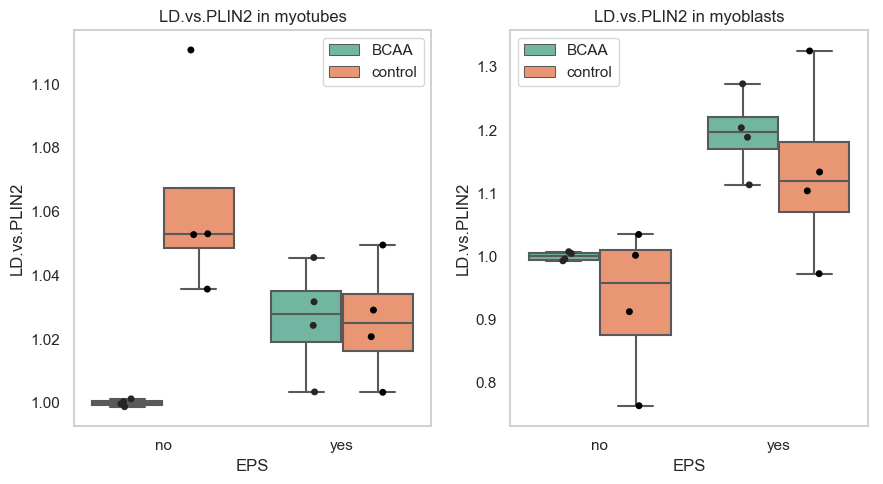

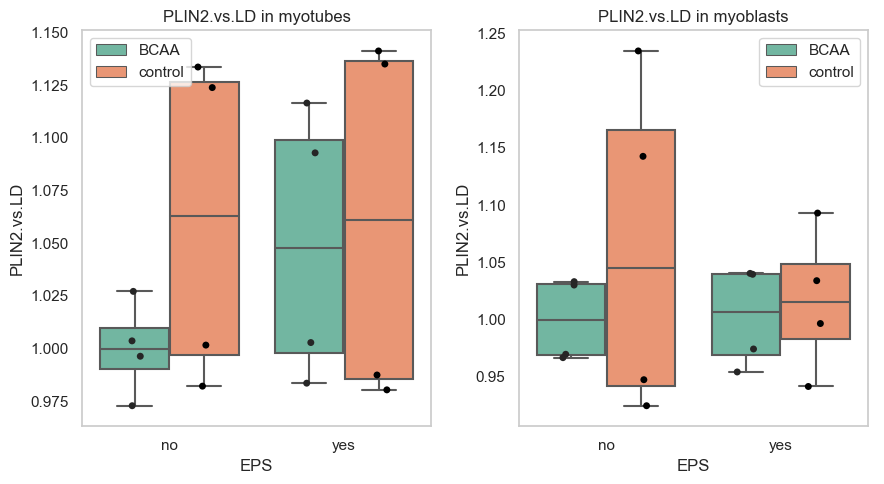

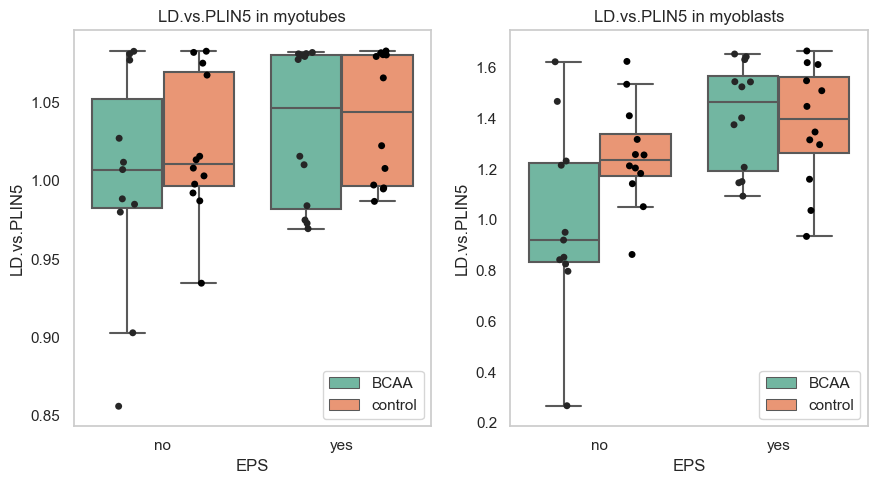

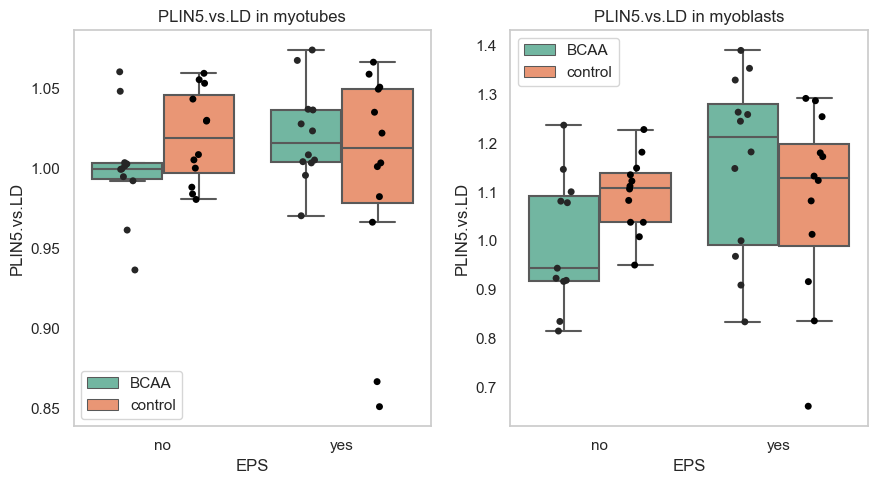

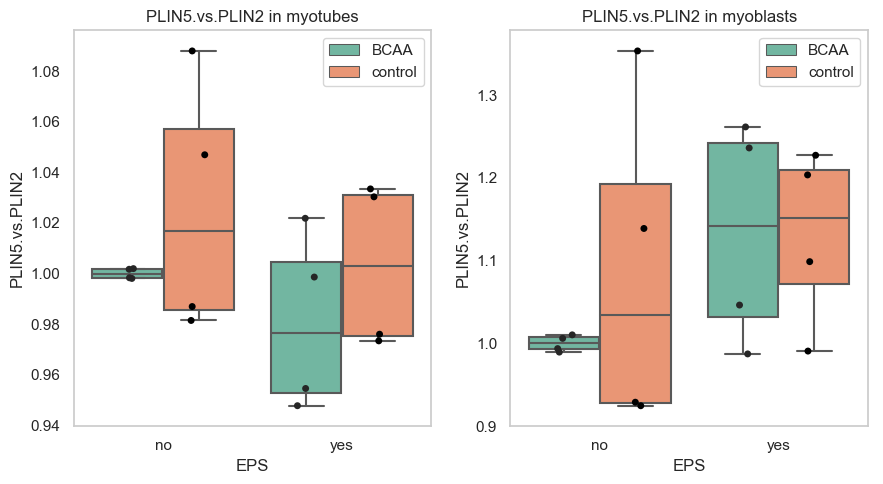

...

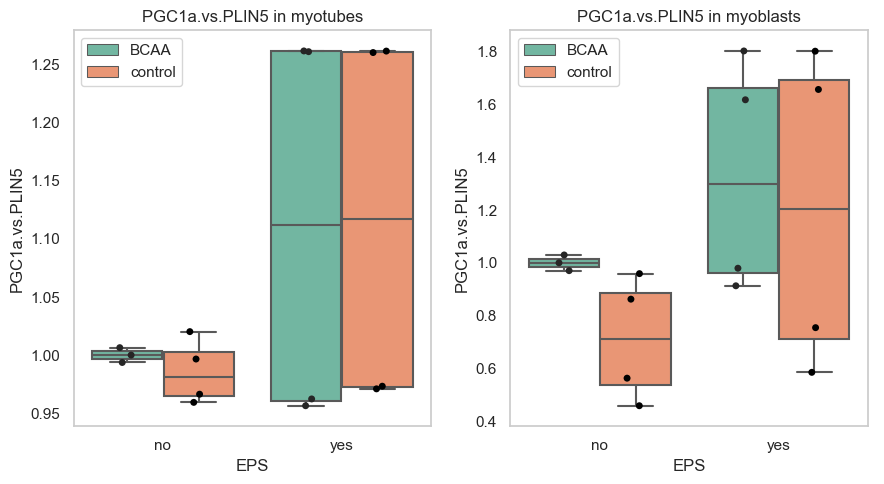

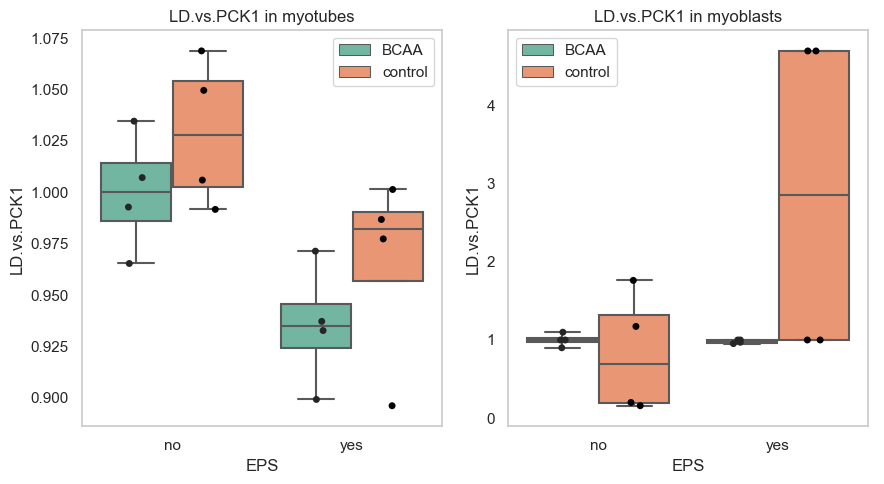

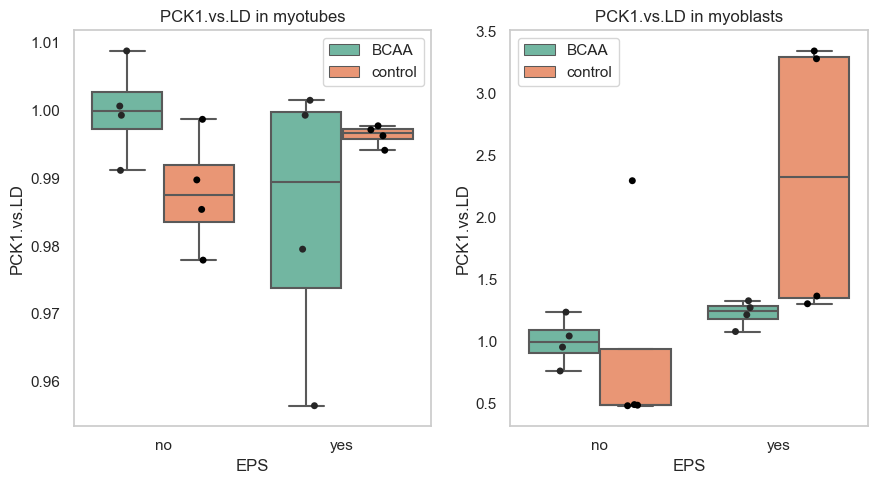

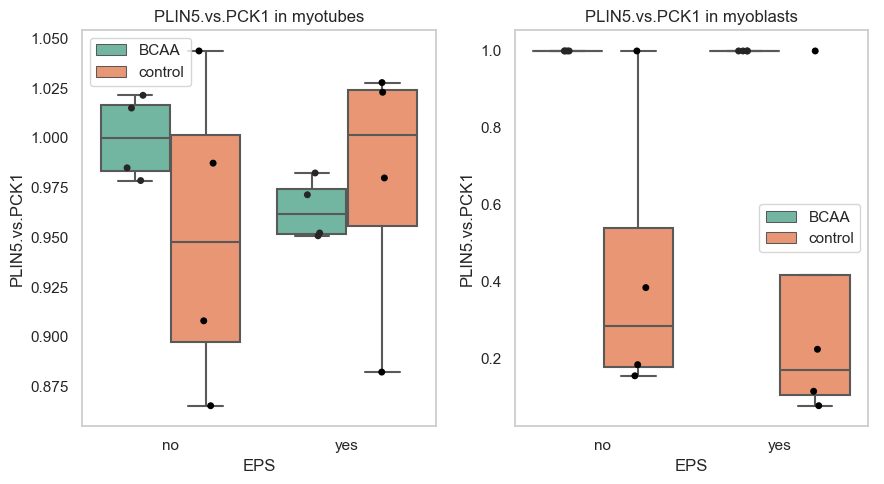

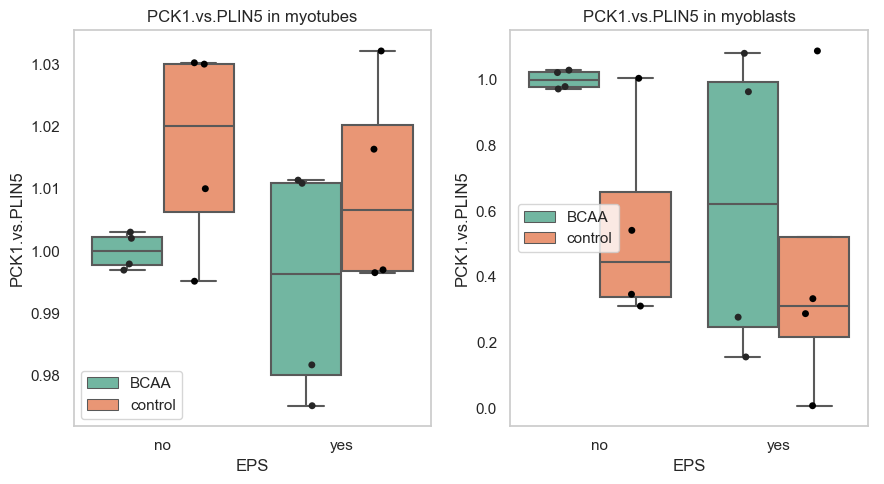

In [39]:
plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')

var_list = ["PLIN5 signal fraction (AU)", "PLIN2 signal fraction (AU)", "PCK1 signal fraction (AU)", "PGC1a signal fraction (AU)"]
var_list = ['LD.vs.PLIN2','PLIN2.vs.LD','LD.vs.PLIN5','PLIN5.vs.LD','PLIN5.vs.PLIN2','PLIN2.vs.PLIN5','LD.vs.PGC1a','PGC1a.vs.LD','PLIN5.vs.PGC1a','PGC1a.vs.PLIN5','LD.vs.PCK1','PCK1.vs.LD','PLIN5.vs.PCK1','PCK1.vs.PLIN5']
for y_ax in var_list:

    main_var = avg_cs_ready63_all_NORM

    var = [main_var[main_var['cell type'] == 'tubes'], main_var[main_var['cell type'] == 'blasts']]
    cells = ['myotubes', 'myoblasts']
    fig = plt.figure(figsize=(9,5))
    for i, v in enumerate(var): 
        ax = fig.add_subplot(1, 2, i+1)

        sns.boxplot(x='EPS', y=y_ax, data=v, hue='BCAA', showfliers=False, palette='Set2', ax=ax)
        sns.stripplot(x='EPS', y=y_ax, data=v, hue='BCAA', dodge=True, jitter=True, color='black', ax=ax)

        handles, labels = ax.get_legend_handles_labels()

        # 4 legends for defaul: boxplot x 2 species, and stripplot x 2 species
        # use the first 2 legends
        ax.legend(handles[0:2], ['BCAA', 'control'])
        ax.set_xlabel('EPS')
        ax.set_ylabel(y_ax)
        ax.set_aspect('auto')
        #ax.set_ylim(0, 20)
        plt.title('{} in {}'.format(y_ax, cells[i]))
    fig.tight_layout()
    plt.show()





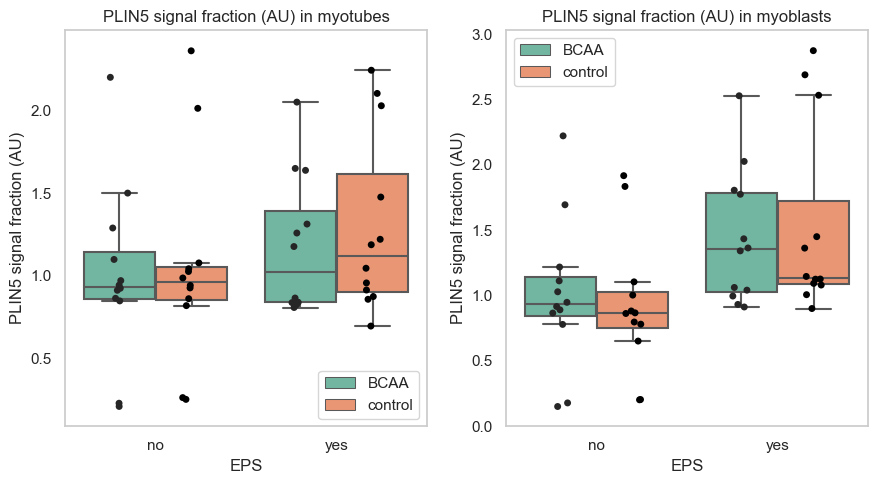

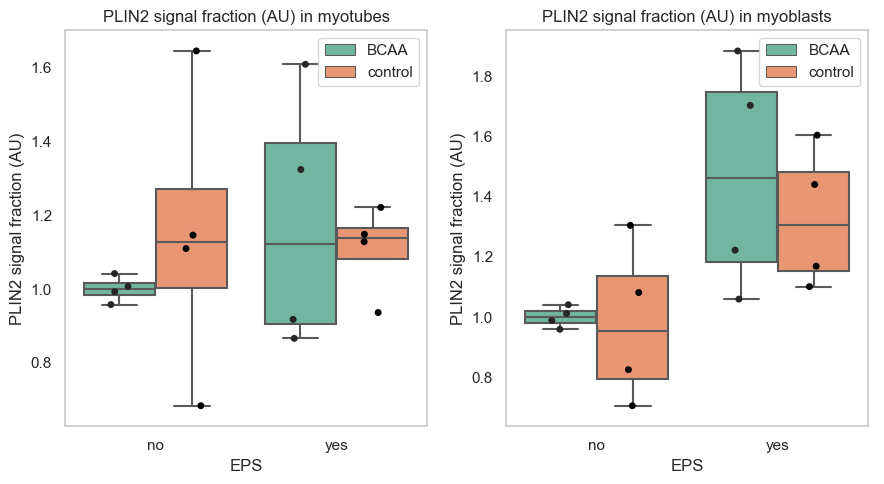

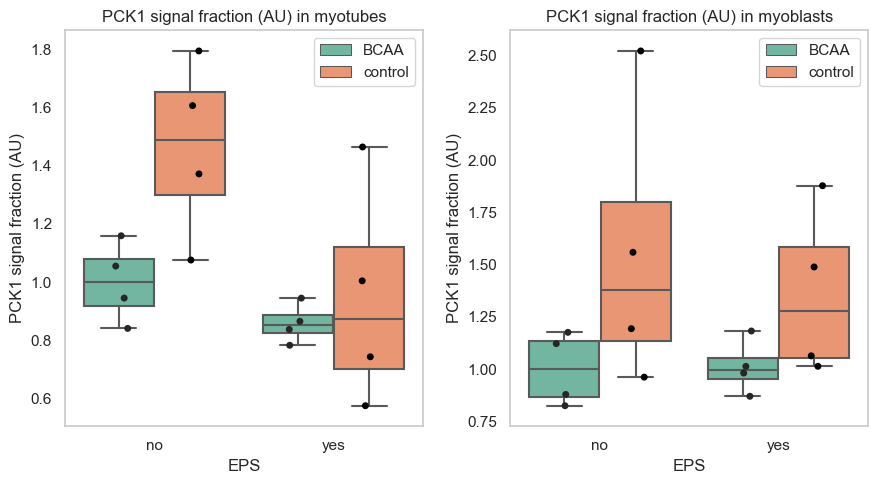

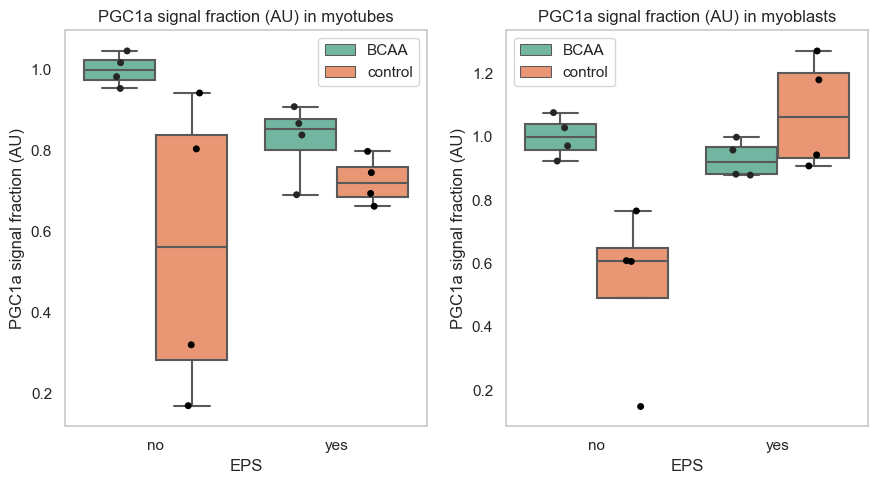

In [113]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')

main_var = main
main_var = z_main

var_list = ["LD signal fraction (AU)", "PLIN5 signal fraction (AU)", "PLIN2 signal fraction (AU)", "PCK1 signal fraction (AU)", "PGC1a signal fraction (AU)"]
#var_list = ['LD.vs.PLIN2','PLIN2.vs.LD','LD.vs.PLIN5','PLIN5.vs.LD','PLIN5.vs.PLIN2','PLIN2.vs.PLIN5','LD.vs.PGC1a','PGC1a.vs.LD','PLIN5.vs.PGC1a','PGC1a.vs.PLIN5','LD.vs.PCK1','PCK1.vs.LD','PLIN5.vs.PCK1','PCK1.vs.PLIN5']
#var_list = ["PLIN5 signal fraction (AU)"]

for y_ax in var_list:



    var = [main_var[main_var['cell type'] == 'tubes'], main_var[main_var['cell type'] == 'blasts']]
    cells = ['myotubes', 'myoblasts']
    fig = plt.figure(figsize=(9,5))
    for i, v in enumerate(var): 
        ax = fig.add_subplot(1, 2, i+1)

        sns.boxplot(x='EPS', y=y_ax, data=v, hue='BCAA', showfliers=False, palette='Set2', ax=ax)
        sns.stripplot(x='EPS', y=y_ax, data=v, hue='BCAA', dodge=True, jitter=True, color='black', ax=ax)

        handles, labels = ax.get_legend_handles_labels()

        # 4 legends for defaul: boxplot x 2 species, and stripplot x 2 species
        # use the first 2 legends
        ax.legend(handles[0:2], ['08BCAA', 'noBCAA'])
        ax.set_xlabel('EPS')
        ax.set_ylabel(y_ax)
        ax.set_aspect('auto')
        #ax.set_ylim(0, 20)
        plt.title('{} in {}'.format(y_ax, cells[i]))
        
        makeStats(v, y_ax, ['BCAA', 'EPS'], ax)
        
    fig.tight_layout()
    plt.show()
        
    for exp in ['BCAA', 'EPS']:
        sns.boxplot(x=exp, y=y_ax, data=v, showfliers=False, palette='Set2', ax=ax)
        sns.stripplot(x=exp, y=y_ax, data=v, dodge=True, jitter=True, color='black', ax=ax)

        makeStats(v, y_ax, [exp], ax)
        
    fig.tight_layout()
    plt.show()

    
    




In [13]:
main = avg_ready63_all_NORM.copy()
main = avg_cs_ready63_all_NORM.copy()
#main = avg_well_ready63_all_NORM.copy()

main.BCAA[main.BCAA == 'no'] = 'no BCAA'
main.BCAA[main.BCAA == '08'] = '08 BCAA'
main.EPS[main.EPS == 'no'] = 'no EPS'
main.EPS[main.EPS == 'yes'] = 'EPS'

bcaa_grps = list(main['BCAA'].unique())
eps_grps = list(main['EPS'].unique())
cell_types = list(main['cell type'].unique())
all_vars = list(main.columns)


#The new dataframe called 'z_data' is basically the same as the original main but without outliers
z_main = pd.DataFrame([], columns=main.columns)
z_main[all_vars[:3]], z_main[all_vars[26]] = main[all_vars[:3]], main[all_vars[26]]
z_main[z_main.columns[3:26]] = z_main[z_main.columns[3:26]].astype(float)



#Lets deal with outliers here:
z_threshold = 2


for av in all_vars[3:26]:
    for bg in bcaa_grps:
        for eg in eps_grps:
            for ct in cell_types:
            
                #data from given variable in given group
                cases=main[av][(main['BCAA']==bg) & 
                        (main['EPS']==eg) & 
                        (main['cell type']==ct)] 
                #mean of given variable in given group
                mean=main[av][(main['BCAA']==bg) & 
                        (main['EPS']==eg) & 
                        (main['cell type']==ct)].mean()
                #std of given variable in given group
                std=main[av][(main['BCAA']==bg) & 
                        (main['EPS']==eg) & 
                        (main['cell type']==ct)].std()

                #print(cases)
                #print (cs)
                #print(mean)
                #print(std)
                
                for ics, cs in enumerate(cases):
                    if std != 0:
                        zscore = (float(cs)-mean)/std

                        if (zscore > -z_threshold) and (zscore < z_threshold): 
                            z_main[av][(z_main.index==cases.index[ics])] = float(cs)
z_main

C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is t

,fileName,BCAA,EPS,LD signal fraction (AU),PLIN5 signal fraction (AU),PLIN2 signal fraction (AU),LD_#,LD_#per_mm3,LD_diam,PGC1a signal fraction (AU),PCK1 signal fraction (AU),LD.vs.PLIN2,PLIN2.vs.LD,LD.vs.PLIN5,PLIN5.vs.LD,PLIN5.vs.PLIN2,PLIN2.vs.PLIN5,LD.vs.PGC1a,PGC1a.vs.LD,PLIN5.vs.PGC1a,PGC1a.vs.PLIN5,LD.vs.PCK1,PCK1.vs.LD,PLIN5.vs.PCK1,PCK1.vs.PLIN5,LD density (LD per mm3),cell type
0,1a_CTR_08BCAA_63x,08 BCAA,no EPS,0.695135,1.500211,1.007169,1.437816,1.184323,1.233331,NaN,NaN,1.000336,1.003647,1.081244,0.994763,0.998320,0.998572,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.252254,tubes
1,1a_CTR_08BCAA_63x,08 BCAA,no EPS,0.752129,NaN,0.992831,NaN,0.755967,1.089500,NaN,NaN,0.999664,0.996353,1.082923,0.999354,1.001680,1.001428,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.033032,tubes
2,2a_CTR_08BCAA_63x,08 BCAA,no EPS,1.382803,0.231026,NaN,0.430738,0.918815,1.082394,0.982717,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tubes
3,2a_CTR_08BCAA_63x,08 BCAA,no EPS,1.431701,0.211714,NaN,0.412538,1.198361,1.093591,1.017283,NaN,NaN,NaN,NaN,1.002734,NaN,NaN,1.000000,1.000000,1.000000,1.000000,NaN,NaN,NaN,NaN,4.973932,tubes
4,3a_CTR_08BCAA_63x,08 BCAA,no EPS,1.000403,0.944387,NaN,0.351871,NaN,0.776861,NaN,1.055035,NaN,NaN,0.902779,0.999606,NaN,NaN,NaN,NaN,NaN,NaN,1.034650,1.000678,0.984965,1.003056,3.931513,tubes
5,3a_CTR_08BCAA_63x,08 BCAA,no EPS,0.737828,0.913217,NaN,0.855410,1.657698,0.724324,NaN,0.944965,NaN,NaN,1.077290,1.003542,NaN,NaN,NaN,NaN,NaN,NaN,0.965350,0.999322,1.015035,0.996944,6.913258,tubes
6,1a_CTR_08BCAA_63x,08 BCAA,no EPS,0.625045,1.694784,1.040940,0.330569,0.529150,0.778724,NaN,NaN,0.995523,0.969786,1.467410,1.081575,0.993821,0.975539,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.267163,blasts
7,1a_CTR_08BCAA_63x,08 BCAA,no EPS,0.719479,NaN,0.959060,0.283175,0.450675,0.875022,NaN,NaN,1.004477,1.030214,1.623681,1.078434,1.006179,1.024461,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.050891,blasts
8,2a_CTR_08BCAA_63x,08 BCAA,no EPS,1.538557,0.177282,NaN,1.992891,1.497731,1.270641,1.028541,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16.354323,blasts
9,2a_CTR_08BCAA_63x,08 BCAA,no EPS,1.698929,0.149799,NaN,1.759479,1.793888,1.122545,0.971459,NaN,NaN,NaN,0.843424,0.923679,NaN,NaN,1.000000,1.000000,1.000000,1.000000,NaN,NaN,NaN,NaN,20.502259,blasts


IndexError: list index out of range

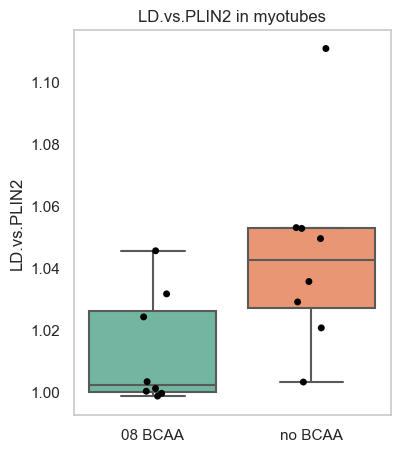

In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statannot import add_stat_annotation


plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')

#var = 'LD signal fraction (AU)'
#marker = 'LD signal fraction (AU)'

var = 'LD_#per_mm3'
marker = 'LDs per mm3'

#var = 'LD_diam'
#marker = 'LD_diam'

tables = {'avg' :avg_ready63_all_NORM, 
          'cs': avg_cs_ready63_all_NORM, 
          'well': avg_well_ready63_all_NORM}

main_var = z_main
typ = 'mono'

#for k, tb in tables.items():

for exp in ['BCAA', 'EPS']:
    var_list = ["LD_diam", "LD_#per_mm3", "LD signal fraction (AU)", "PLIN5 signal fraction (AU)", "PLIN2 signal fraction (AU)", "PCK1 signal fraction (AU)", "PGC1a signal fraction (AU)"]
    var_list = ['LD.vs.PLIN2','PLIN2.vs.LD','LD.vs.PLIN5','PLIN5.vs.LD','PLIN5.vs.PLIN2','PLIN2.vs.PLIN5','LD.vs.PGC1a','PGC1a.vs.LD','PLIN5.vs.PGC1a','PGC1a.vs.PLIN5','LD.vs.PCK1','PCK1.vs.LD','PLIN5.vs.PCK1','PCK1.vs.PLIN5']
    #var_list = ["PLIN5 signal fraction (AU)"]

    for y_ax in var_list:

        var = [main_var[main_var['cell type'] == 'tubes'], main_var[main_var['cell type'] == 'blasts']]
        cells = ['myotubes', 'myoblasts']

        fig = plt.figure(figsize=(9,5))
        for i, v in enumerate(var): 
            ax = fig.add_subplot(1, 2, i+1)

            sns.boxplot(x=exp, y=y_ax, data=v, showfliers=False, palette='Set2', ax=ax)
            sns.stripplot(x=exp, y=y_ax, data=v, dodge=True, jitter=True, color='black', ax=ax)
            
            handles, labels = ax.get_legend_handles_labels()

            #ax.legend(handles[0:2], ['control', 'EPS'])
            ax.set_xlabel('')
            ax.set_ylabel(y_ax)
            #ax.set_aspect('auto')
            #ax.set_ylim(0, 20)
            plt.title('{} in {}'.format(y_ax, cells[i]))
            
            makeStats(v, y_ax, [exp], ax, typ)


        fig.tight_layout()
        plt.show()


        directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\second_paper\deconvolved'
        fig.savefig('{}\{}_{}_{}.png'.format(directory, typ, exp, y_ax))
        fig.savefig('{}\{}_{}_{}.pdf'.format(directory, typ, exp, y_ax))


08 BCAA group seems to have insufficient number of cases (0)
no BCAA group seems to have insufficient number of cases (0)
08 BCAA and no BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on LD_diam:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.004569  0.004569  0.088907  0.766975
EPS        1.0  0.174699  0.174699  3.399230  0.071968
BCAA:EPS   1.0  0.080521  0.080521  1.566737  0.217295
Residual  44.0  2.261326  0.051394       NaN       NaN
Shapiro-Wilk p-value for LD_diam in 08 BCAA : 0.4879
Shapiro-Wilk p-value for LD_diam in no BCAA : 0.1054

MW P value between 08 BCAA and no BCAA: 0.4959
t-test P value between 08 BCAA and no BCAA: 0.7739

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on LD_diam:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.004569  0.004569  0.088907  0.766975
EPS        1.0  0.174699  0.174699  

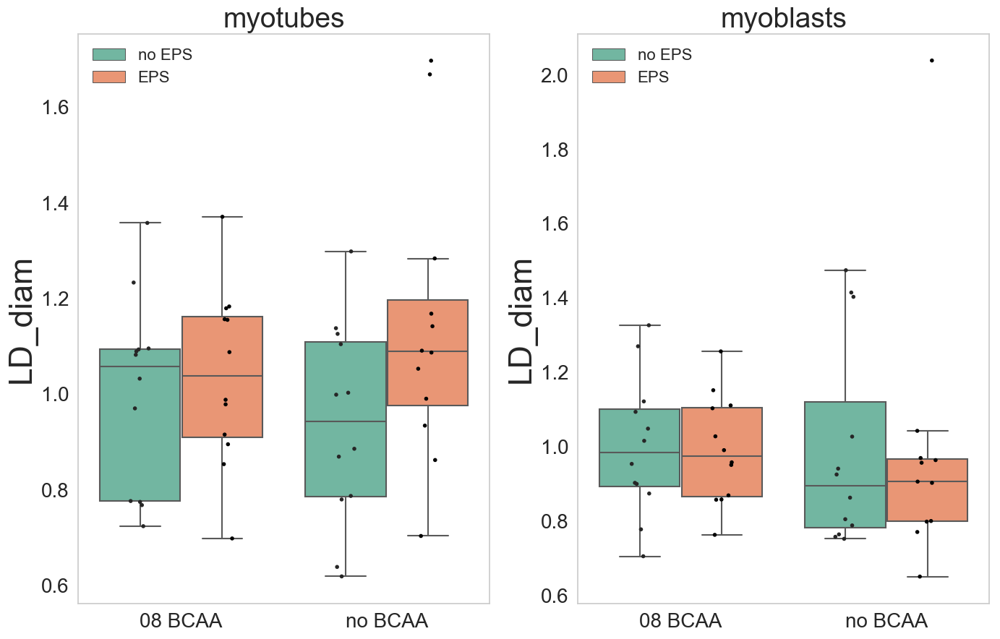

08 BCAA group seems to have insufficient number of cases (0)
no BCAA group seems to have insufficient number of cases (0)
08 BCAA and no BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on LD_#per_mm3:
             df     sum_sq   mean_sq         F    PR(>F)
BCAA       1.0   1.150830  1.150830  0.951276  0.335114
EPS        1.0   0.258043  0.258043  0.213298  0.646636
BCAA:EPS   1.0   4.724251  4.724251  3.905067  0.054895
Residual  41.0  49.600761  1.209775       NaN       NaN
Shapiro-Wilk p-value for LD_#per_mm3 in 08 BCAA : 0.0###
Shapiro-Wilk p-value for LD_#per_mm3 in no BCAA : 0.0018##

MW P value between 08 BCAA and no BCAA: 0.1354
t-test P value between 08 BCAA and no BCAA: 0.3463

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on LD_#per_mm3:
             df     sum_sq   mean_sq         F    PR(>F)
BCAA       1.0   1.150830  1.150830  0.951276  0.335114
E

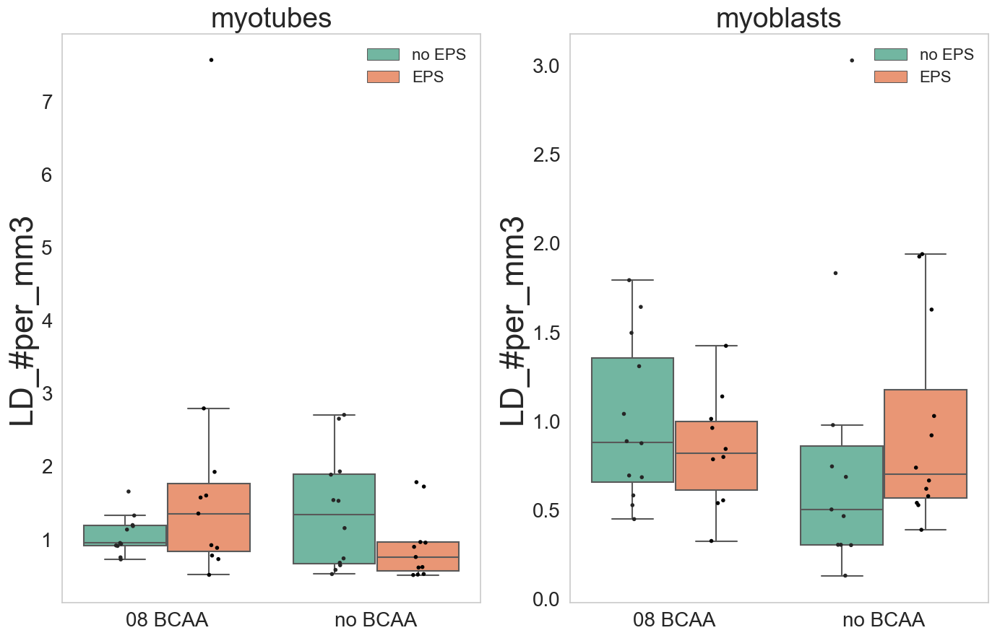

08 BCAA group seems to have insufficient number of cases (0)
no BCAA group seems to have insufficient number of cases (0)
08 BCAA and no BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on LD signal fraction (AU):
             df     sum_sq   mean_sq         F    PR(>F)
BCAA       1.0   0.000273  0.000273  0.001156  0.973034
EPS        1.0   0.001723  0.001723  0.007301  0.932294
BCAA:EPS   1.0   0.108832  0.108832  0.461197  0.500622
Residual  44.0  10.383009  0.235977       NaN       NaN
Shapiro-Wilk p-value for LD signal fraction (AU) in 08 BCAA : 0.1622
Shapiro-Wilk p-value for LD signal fraction (AU) in no BCAA : 0.2011

MW P value between 08 BCAA and no BCAA: 0.4877
t-test P value between 08 BCAA and no BCAA: 0.9726

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on LD signal fraction (AU):
             df     sum_sq   mean_sq         F    PR(>F)
BCAA       1.0   0.00

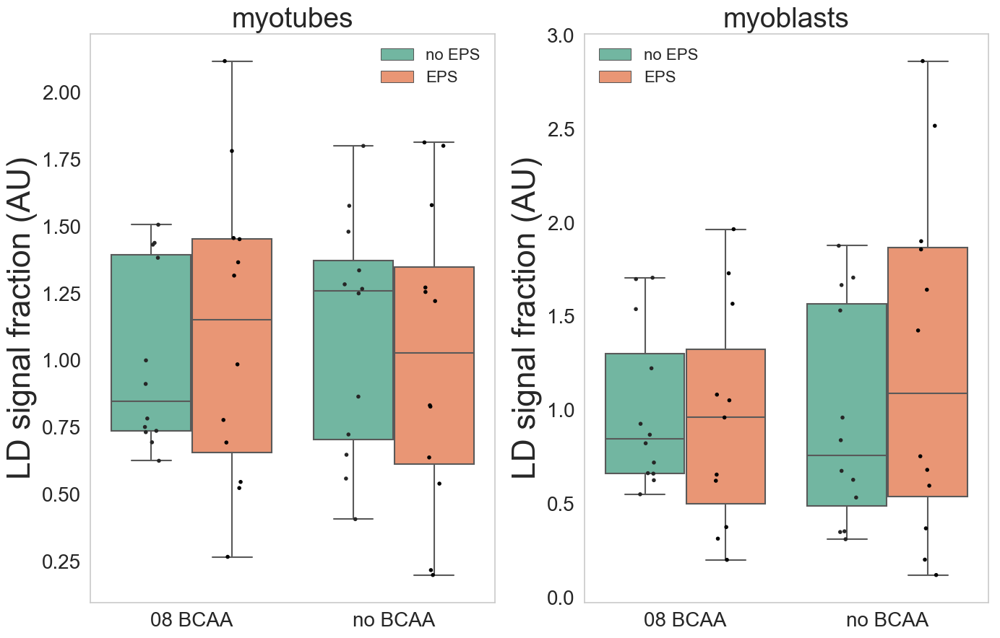

08 BCAA group seems to have insufficient number of cases (0)
no BCAA group seems to have insufficient number of cases (0)
08 BCAA and no BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN5 signal fraction (AU):
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.188495  0.188495  0.980513  0.327880
EPS        1.0  0.945708  0.945708  4.919372  0.032156
BCAA:EPS   1.0  0.077758  0.077758  0.404479  0.528319
Residual  41.0  7.881902  0.192242       NaN       NaN
Shapiro-Wilk p-value for PLIN5 signal fraction (AU) in 08 BCAA : 0.0491#
Shapiro-Wilk p-value for PLIN5 signal fraction (AU) in no BCAA : 0.0065##

MW P value between 08 BCAA and no BCAA: 0.191
t-test P value between 08 BCAA and no BCAA: 0.3454

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN5 signal fraction (AU):
             df    sum_sq   mean_sq         F    PR(>F)
BCA

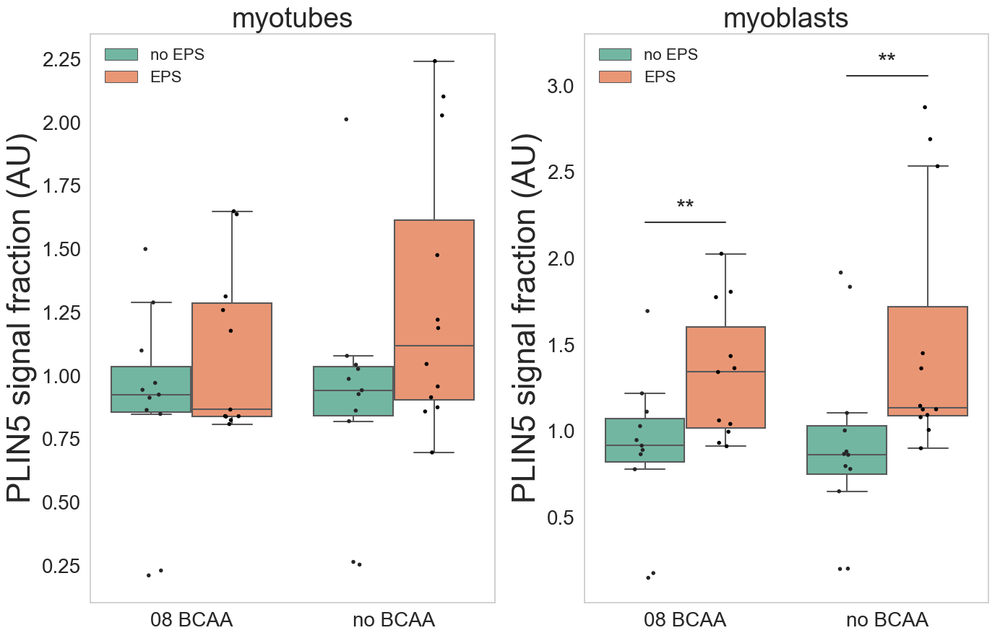

08 BCAA group seems to have insufficient number of cases (0)
no BCAA group seems to have insufficient number of cases (0)
08 BCAA and no BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN2 signal fraction (AU):
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.005722  0.005722  0.077490  0.785467
EPS        1.0  0.020109  0.020109  0.272333  0.611269
BCAA:EPS   1.0  0.047149  0.047149  0.638549  0.439767
Residual  12.0  0.886058  0.073838       NaN       NaN
Shapiro-Wilk p-value for PLIN2 signal fraction (AU) in 08 BCAA : 0.029#
Shapiro-Wilk p-value for PLIN2 signal fraction (AU) in no BCAA : 0.3095

MW P value between 08 BCAA and no BCAA: 0.2154
t-test P value between 08 BCAA and no BCAA: 0.7762

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN2 signal fraction (AU):
             df    sum_sq   mean_sq         F    PR(>F)
BCAA 

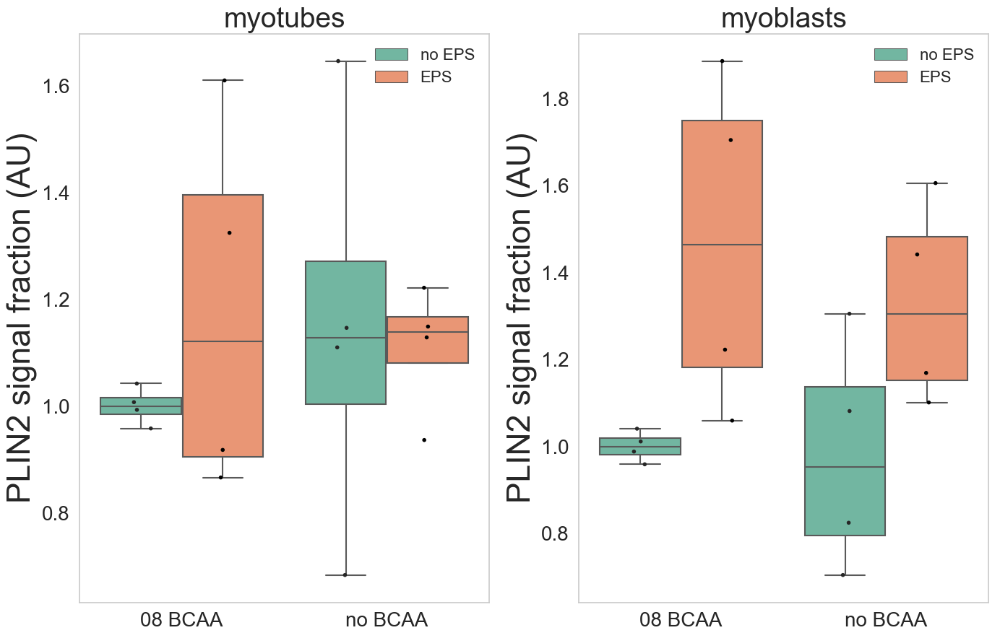

08 BCAA group seems to have insufficient number of cases (0)
no BCAA group seems to have insufficient number of cases (0)
08 BCAA and no BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PCK1 signal fraction (AU):
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.304354  0.304354  4.503394  0.055326
EPS        1.0  0.433327  0.433327  6.411766  0.026315
BCAA:EPS   1.0  0.139332  0.139332  2.061634  0.176600
Residual  12.0  0.810998  0.067583       NaN       NaN
Shapiro-Wilk p-value for PCK1 signal fraction (AU) in 08 BCAA : 0.4199
Shapiro-Wilk p-value for PCK1 signal fraction (AU) in no BCAA : 0.8676

MW P value between 08 BCAA and no BCAA: 0.0946
t-test P value between 08 BCAA and no BCAA: 0.1011

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PCK1 signal fraction (AU):
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.3

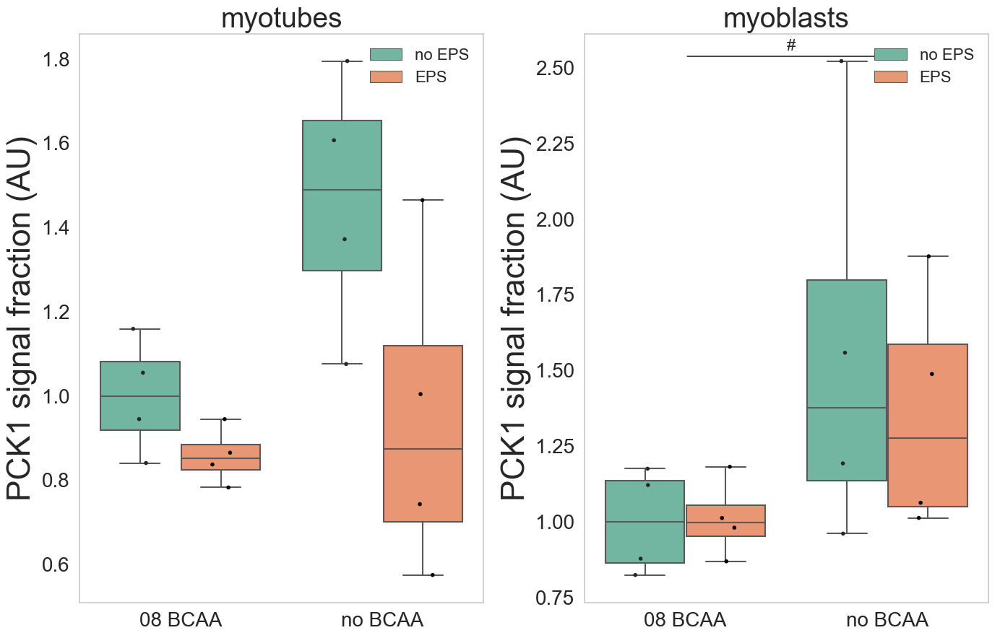

08 BCAA group seems to have insufficient number of cases (0)
no BCAA group seems to have insufficient number of cases (0)
08 BCAA and no BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PGC1a signal fraction (AU):
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.293329  0.293329  7.695759  0.016833
EPS        1.0  0.000058  0.000058  0.001533  0.969413
BCAA:EPS   1.0  0.115129  0.115129  3.020515  0.107786
Residual  12.0  0.457388  0.038116       NaN       NaN
Shapiro-Wilk p-value for PGC1a signal fraction (AU) in 08 BCAA : 0.6146
Shapiro-Wilk p-value for PGC1a signal fraction (AU) in no BCAA : 0.1517

MW P value between 08 BCAA and no BCAA: 0.0068##
t-test P value between 08 BCAA and no BCAA: 0.018#

parametric tests are more advised. T-test will be used

signifficant pairs: [('08 BCAA', 'no BCAA')]
p-value if signifficant: [0.018] 


 2-WAY ANOVA on PGC1a signal fraction (AU):
             df    sum_sq   mean_sq       

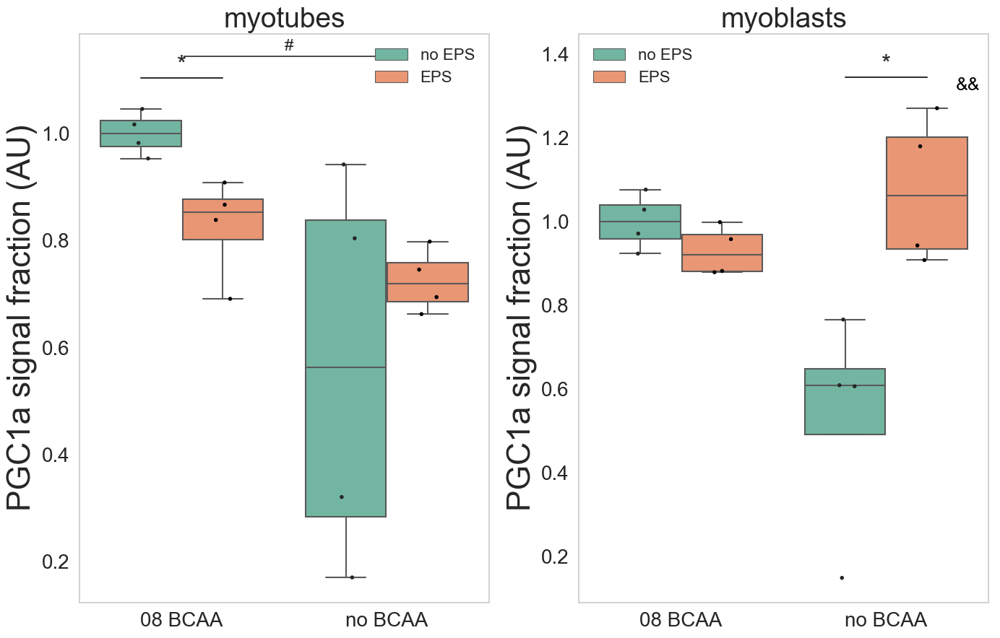

no EPS group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
no EPS and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on LD_diam:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.174699  0.174699  3.399230  0.071968
BCAA       1.0  0.004569  0.004569  0.088907  0.766975
EPS:BCAA   1.0  0.080521  0.080521  1.566737  0.217295
Residual  44.0  2.261326  0.051394       NaN       NaN
Shapiro-Wilk p-value for LD_diam in no EPS : 0.4127
Shapiro-Wilk p-value for LD_diam in EPS : 0.0631

MW P value between no EPS and EPS: 0.0622
t-test P value between no EPS and EPS: 0.0706

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on LD_diam:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.174699  0.174699  3.399230  0.071968
BCAA       1.0  0.004569  0.004569  0.088907  0.766975
EPS:BC

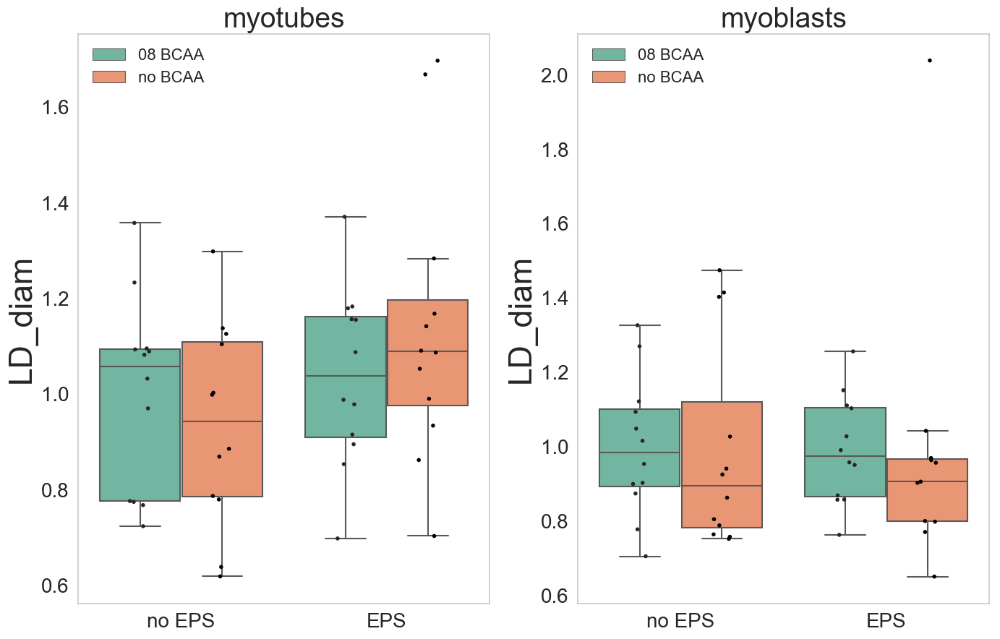

no EPS group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
no EPS and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on LD_#per_mm3:
             df     sum_sq   mean_sq         F    PR(>F)
EPS        1.0   0.282152  0.282152  0.233227  0.631710
BCAA       1.0   1.126721  1.126721  0.931347  0.340171
EPS:BCAA   1.0   4.724251  4.724251  3.905067  0.054895
Residual  41.0  49.600761  1.209775       NaN       NaN
Shapiro-Wilk p-value for LD_#per_mm3 in no EPS : 0.0095##
Shapiro-Wilk p-value for LD_#per_mm3 in EPS : 0.0###

MW P value between no EPS and EPS: 0.2662
t-test P value between no EPS and EPS: 0.6423

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on LD_#per_mm3:
             df     sum_sq   mean_sq         F    PR(>F)
EPS        1.0   0.282152  0.282152  0.233227  0.631710
BCAA       1.0   1.126721 

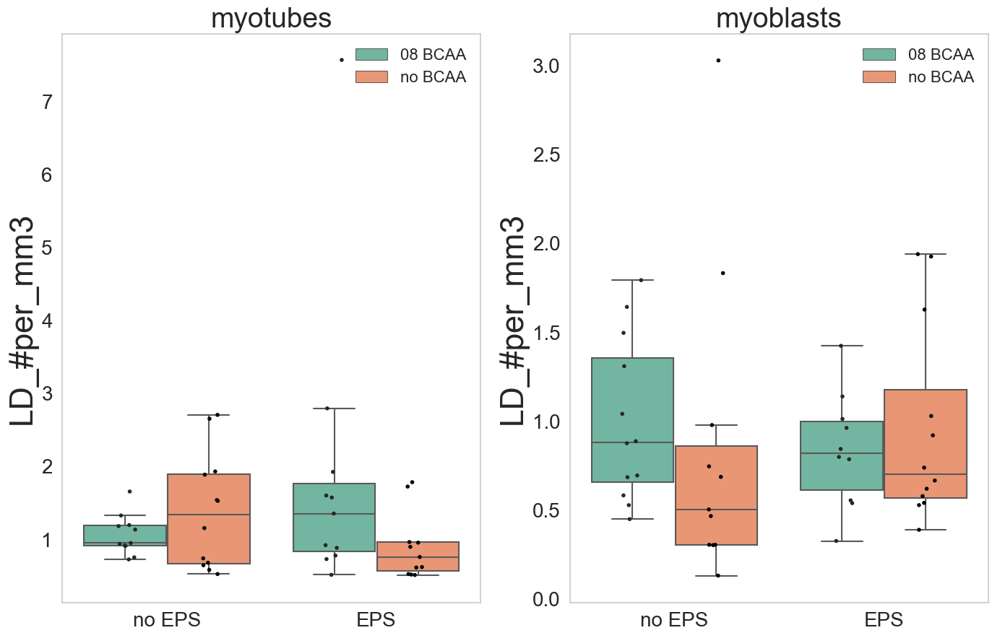

no EPS group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
no EPS and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on LD signal fraction (AU):
             df     sum_sq   mean_sq         F    PR(>F)
EPS        1.0   0.001723  0.001723  0.007301  0.932294
BCAA       1.0   0.000273  0.000273  0.001156  0.973034
EPS:BCAA   1.0   0.108832  0.108832  0.461197  0.500622
Residual  44.0  10.383009  0.235977       NaN       NaN
Shapiro-Wilk p-value for LD signal fraction (AU) in no EPS : 0.1012
Shapiro-Wilk p-value for LD signal fraction (AU) in EPS : 0.4316

MW P value between no EPS and EPS: 0.4712
t-test P value between no EPS and EPS: 0.9311

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on LD signal fraction (AU):
             df     sum_sq   mean_sq         F    PR(>F)
EPS        1.0   0.001723  0.001723  0.007301 

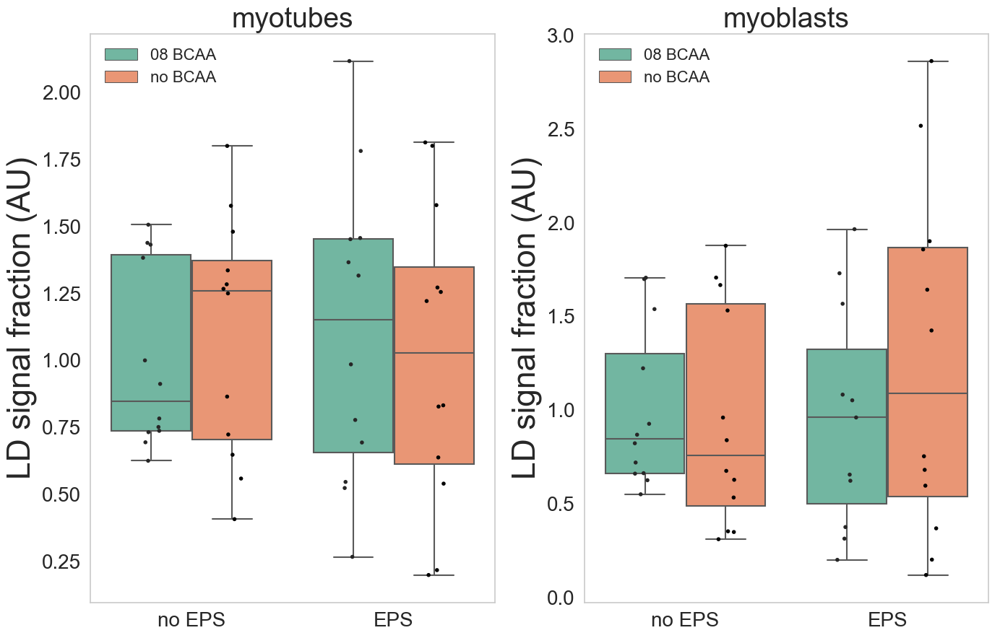

no EPS group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
no EPS and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN5 signal fraction (AU):
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.963702  0.963702  5.012977  0.030647
BCAA       1.0  0.170500  0.170500  0.886908  0.351833
EPS:BCAA   1.0  0.077758  0.077758  0.404479  0.528319
Residual  41.0  7.881902  0.192242       NaN       NaN
Shapiro-Wilk p-value for PLIN5 signal fraction (AU) in no EPS : 0.009##
Shapiro-Wilk p-value for PLIN5 signal fraction (AU) in EPS : 0.0028##

MW P value between no EPS and EPS: 0.0883
t-test P value between no EPS and EPS: 0.0291#

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN5 signal fraction (AU):
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.963702  

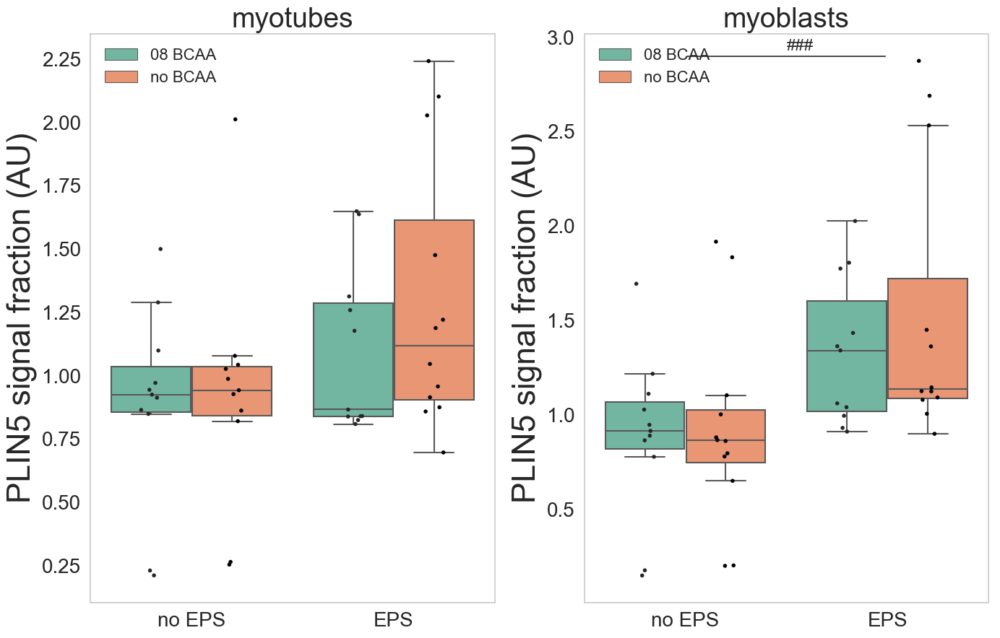

no EPS group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
no EPS and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN2 signal fraction (AU):
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.020109  0.020109  0.272333  0.611269
BCAA       1.0  0.005722  0.005722  0.077490  0.785467
EPS:BCAA   1.0  0.047149  0.047149  0.638549  0.439767
Residual  12.0  0.886058  0.073838       NaN       NaN
Shapiro-Wilk p-value for PLIN2 signal fraction (AU) in no EPS : 0.1276
Shapiro-Wilk p-value for PLIN2 signal fraction (AU) in EPS : 0.4963

MW P value between no EPS and EPS: 0.3183
t-test P value between no EPS and EPS: 0.5926

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN2 signal fraction (AU):
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.020109  0.020109  0.27

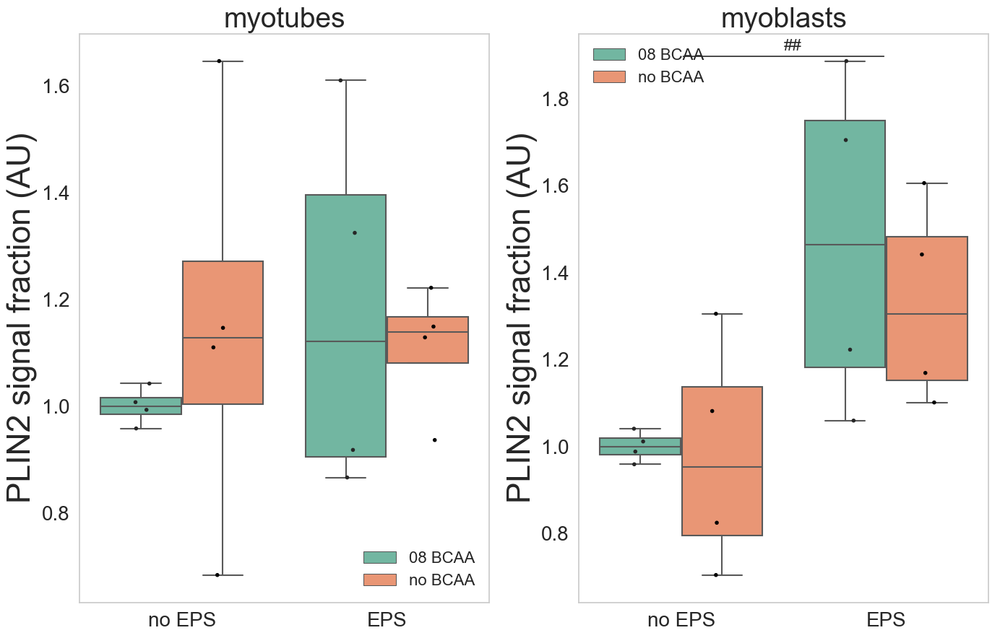

no EPS group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
no EPS and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PCK1 signal fraction (AU):
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.433327  0.433327  6.411766  0.026315
BCAA       1.0  0.304354  0.304354  4.503394  0.055326
EPS:BCAA   1.0  0.139332  0.139332  2.061634  0.176600
Residual  12.0  0.810998  0.067583       NaN       NaN
Shapiro-Wilk p-value for PCK1 signal fraction (AU) in no EPS : 0.4922
Shapiro-Wilk p-value for PCK1 signal fraction (AU) in EPS : 0.1931

MW P value between no EPS and EPS: 0.012#
t-test P value between no EPS and EPS: 0.0452#

parametric tests are more advised. T-test will be used

signifficant pairs: [('no EPS', 'EPS')]
p-value if signifficant: [0.0452] 


 2-WAY ANOVA on PCK1 signal fraction (AU):
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.43

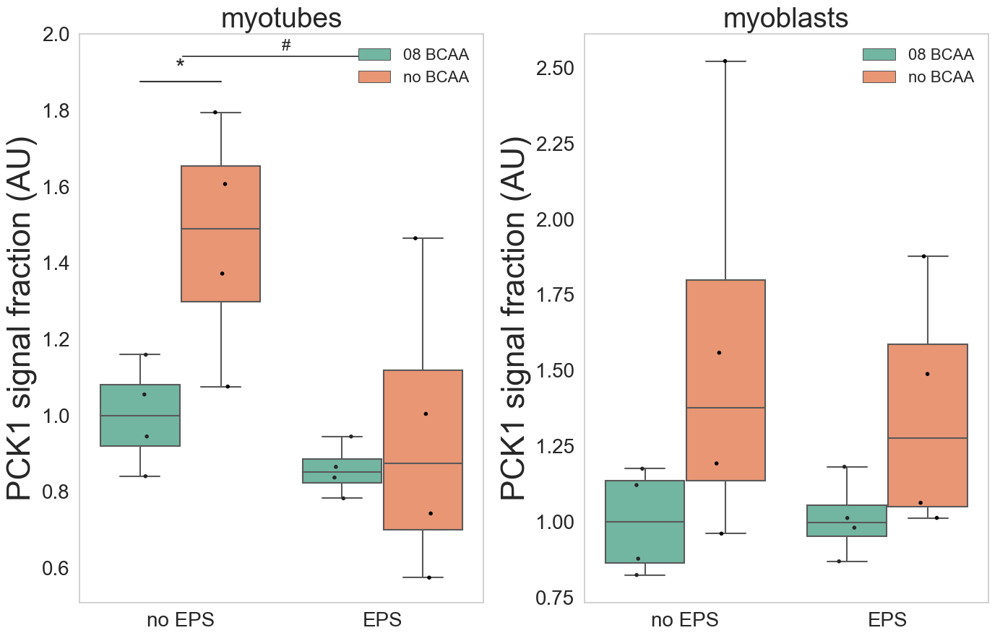

no EPS group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
no EPS and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PGC1a signal fraction (AU):
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.000058  0.000058  0.001533  0.969413
BCAA       1.0  0.293329  0.293329  7.695759  0.016833
EPS:BCAA   1.0  0.115129  0.115129  3.020515  0.107786
Residual  12.0  0.457388  0.038116       NaN       NaN
Shapiro-Wilk p-value for PGC1a signal fraction (AU) in no EPS : 0.0098##
Shapiro-Wilk p-value for PGC1a signal fraction (AU) in EPS : 0.5614

MW P value between no EPS and EPS: 0.0946
t-test P value between no EPS and EPS: 0.9759

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PGC1a signal fraction (AU):
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.000058  0.

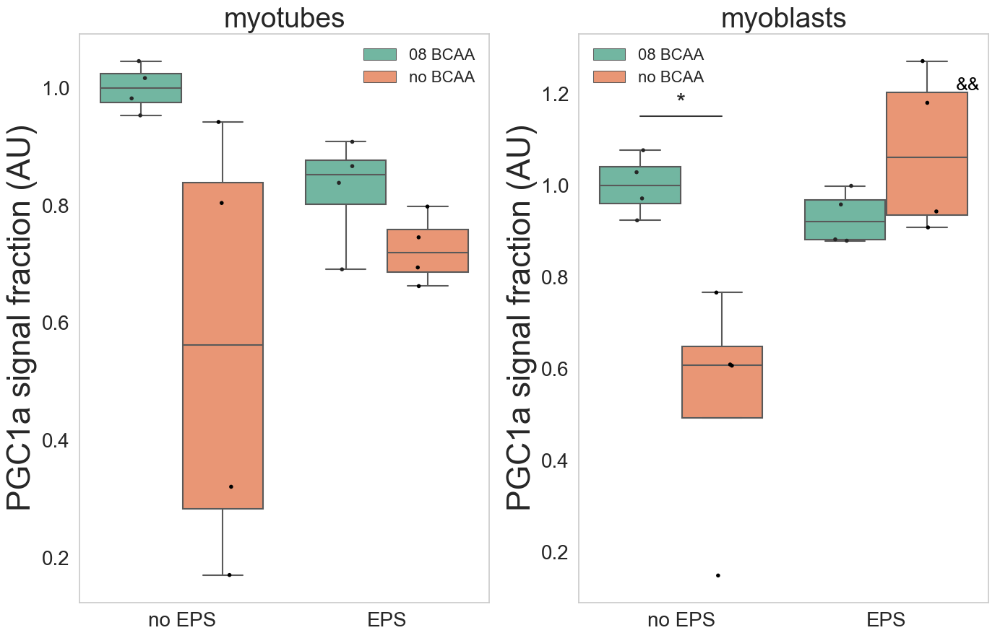

In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')

main_var = main
main_var = z_main
typ = 'dual'

exprms = ['BCAA', 'EPS']
for exp in exprms:
    exp2 = exprms.copy()
    exp2.remove(exp)
    var_list = ["LD_diam", "LD_#per_mm3", "LD signal fraction (AU)", "PLIN5 signal fraction (AU)", "PLIN2 signal fraction (AU)", "PCK1 signal fraction (AU)", "PGC1a signal fraction (AU)"]
    #var_list = ['LD.vs.PLIN2','PLIN2.vs.LD','LD.vs.PLIN5','PLIN5.vs.LD','PLIN5.vs.PLIN2','PLIN2.vs.PLIN5','LD.vs.PGC1a','PGC1a.vs.LD','PLIN5.vs.PGC1a','PGC1a.vs.PLIN5','LD.vs.PCK1','PCK1.vs.LD','PLIN5.vs.PCK1','PCK1.vs.PLIN5']
    #var_list = ["PLIN5 signal fraction (AU)"]

    for y_ax in var_list:

        var = [main_var[main_var['cell type'] == 'tubes'], main_var[main_var['cell type'] == 'blasts']]
        cells = ['myotubes', 'myoblasts']
        fig = plt.figure(figsize=(14,9))
        for i, v in enumerate(var): 
            ax = fig.add_subplot(1, 2, i+1)

            sns.boxplot(x=exp, y=y_ax, data=v, hue=exp2[0], showfliers=False, palette='Set2', ax=ax)
            sns.stripplot(x=exp, y=y_ax, data=v, hue=exp2[0], dodge=True, jitter=True, color='black', ax=ax, size=4)

            makeStats(v, y_ax, [exp, exp2[0]], ax, typ)
            
            handles, labels = ax.get_legend_handles_labels()
            #labels_ = labels.copy()
            #if 'yes' in labels_: labels_[labels.index('yes')] = ''
            #new_labels = ['{} {}'.format(labels[0], exp2[0]), '{} {}'.format(labels[1], exp2[0])]
            

            # 4 legends for defaul: boxplot x 2 species, and stripplot x 2 species
            # use the first 2 legends
            ax.legend(handles[0:2], labels, loc='best', frameon=False, fontsize=16)
            ax.set_xlabel('')
            ax.set_ylabel(y_ax, fontsize=32)
            ax.tick_params(labelsize=20)
            #ax.set_aspect('auto')
            #ax.set_ylim(0, 20)
            plt.title('{}'.format(cells[i]), fontsize=28)


        fig.tight_layout()
        plt.show()
        
        directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\second_paper\deconvolved'
        fig.savefig('{}\{}_{}_{}.png'.format(directory, typ, exp, y_ax))
        fig.savefig('{}\{}_{}_{}.pdf'.format(directory, typ, exp, y_ax))

    
    




In [26]:
from scipy import stats
import statsmodels.api as sm
import numpy as np
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from statsmodels.graphics.factorplots import interaction_plot

def makeStats(cell, cv, exprmt, ax, typ):
    print('\n\n\n')
    print('\n\n all groups {} in {}\n'.format(cv, cell['cell type'].unique()))
    test_list, label_list, norm_list, report_list = [],[],[],[]
    
    if typ == 'mono':
        exprmt2 = None
        for i in range(len(exprmt)): 
            g = cell[exprmt[0]].unique()
            tsl, lbl, ntl, stl = (),(),(),()
            for ii, ig in enumerate(g):
                data = cell[cv][(cell[exprmt[i]] == ig)].dropna()
                #print(len(data))
                if len(data) >= 3:
                    sw_test = round(stats.shapiro(data)[1], 4)
                    Exp = (data, ig, sw_test)
                    tsl = tsl + (Exp[0],)
                    lbl = lbl + (Exp[1],)
                    ntl = ntl + (Exp[2],)
                    report_list.append(('Shapiro-Wilk p-value for {} in {} : {}'.format(cv, ig, sw_test), sw_test))
                else: 
                    print('{} group seems to have insufficient number of cases ({})'.format(ig, len(data)))
                    lbl = lbl + (ig,)

            test_list.append(tsl)
            label_list.append(lbl)
            norm_list.append(ntl)
        
    else:
        exprmt2 = exprmt[1]
        g = cell[exprmt[0]].unique()
        gg = cell[exprmt[1]].unique()
                
        for i in g:
            tsl, lbl, ntl, stl = (),(),(),()
            for ii in gg:
                data = cell[cv][(cell[exprmt[0]] == i)&(cell[exprmt[1]] == ii)].dropna()
                if len(data) >= 3:
                    sw_test = round(stats.shapiro(data)[1], 4)
                    Exp = (data, (i, ii), sw_test)
                    tsl = tsl + (Exp[0],)
                    lbl = lbl + (Exp[1],)
                    ntl = ntl + (Exp[2],)
                    report_list.append(('Shapiro-Wilk p-value for {} in {} {} : {}'.format(cv, i, ii, sw_test), sw_test))
                else: 
                    print('{} {} group seems to have insufficient number of cases ({})'.format(i, ii, len(data)))
                    lbl = lbl + ((i,ii),)

            test_list.append(tsl)
            label_list.append(lbl)
            norm_list.append(ntl)
         
    
    distrib, choice = 'parametric', 'T-test' #default
    for pair in norm_list:
        for norm in pair:
            if norm <= 0.05: distrib, choice = 'non-parametric', 'Mann-Whitney'
    print('{} tests are more advised. {} will be used\n'.format(distrib, choice))
       
    signif_pairs = []
    pv_list = []
    sign_list = []
    sign = 'none'
    for ti, test in enumerate(test_list):
        if len(test) == 2:
            #MANN-WHITNEY
            #print(test_list)
            h, pv = stats.mannwhitneyu(test[0], test[1])
            report_list.append(('\nMW P value between {} and {}: {}'.format(label_list[ti][0], label_list[ti][1], round(pv,4)), round(pv,4))) 
            if pv <= 0.05 and distrib == 'non-parametric': 
                sign = '*'
                if pv <= 0.01: sign = '**'
                if pv <= 0.001: sign = '***'
                sign_list.append(sign) 
                pv_list.append(round(pv,4))
                signif_pairs.append(label_list[ti])

            #T-TEST
            h, pv = stats.ttest_ind(test[0], test[1])
            report_list.append(('t-test P value between {} and {}: {}'.format(label_list[ti][0], label_list[ti][1], round(pv,4)), round(pv,4)))
            if pv <= 0.05 and distrib == 'parametric': 
                sign = '*'
                if pv <= 0.01: sign = '**'
                if pv <= 0.001: sign = '***'
                sign_list.append(sign)
                pv_list.append(round(pv,4))
                signif_pairs.append(label_list[ti])
        else: print('{} and {} could not be compared as there is no valid. One of these is missing'.format(label_list[ti][0], label_list[ti][1]))
    
    print(signif_pairs)
    #print(sign_list)
    print(pv_list, '\n')
        
    if len(signif_pairs) > 0:
        #print(signif_pairs)
        add_stat_annotation(ax, data=cell, x=exprmt[0], y=cv, hue=exprmt2,
                    box_pairs=signif_pairs, pvalues=pv_list,
                    perform_stat_test=False, line_height=0.0,
                    test=None, text_annot_custom=sign_list,
                    loc='inside', verbose=2, fontsize=20)
    
    #write down stats
    for sr in report_list:
        sg=''
        if sr[1] <= 0.05: sg = '*'
        if sr[1] <= 0.01: sg = '**'
        if sr[1] <= 0.001: sg = '***'
        print('{}{}'.format(sr[0], sg))  
    
    #2-Way ANOVA
    
    #just changing the name of the columns (and copying the dataframe) in order for the next statistcal methods to work
    new_cols = []
    for v in cell.columns:
        new_cols.append(v.replace('(AU)','').replace(' ','').replace('#','').replace('.','').replace('(μm)',''))
    
    data = cell.copy()
    data.columns = new_cols
    cv_ = cv.replace('(AU)','').replace(' ','').replace('#','').replace('.','').replace('(μm)','')
    #print(data)
    
    mod_all = ols('{}~EPS+BCAA+EPS*BCAA'.format(cv_), data = data).fit()
    mod_I = ols('{}~EPS+BCAA+EPS*BCAA'.format(cv_), data = data[data['EPS'] == 'no EPS']).fit()
    mod_II = ols('{}~EPS+BCAA+EPS*BCAA'.format(cv_), data = data[data['BCAA'] == 'no BCAA']).fit()

    aov_all = sm.stats.anova_lm(mod_all, type=1)
    aov_I = sm.stats.anova_lm(mod_I, type=2)
    aov_II = sm.stats.anova_lm(mod_II, type=2)
    #print('\n 2-WAY ANOVA:\n', aov_all)
    #print('\n\n without EPS {} in {}\n'.format(cv, cell['cell type'].unique()), aov_I)
    #print('\n without BCAA {} in {}\n\n'.format(cv, cell['cell type'].unique()), aov_II)
    
    


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal
from mpl_toolkits.mplot3d import Axes3D

var = [avg_cs_ready63['LD signal fraction (AU)'][avg_cs_ready63['cell type'] == 'tubes']]
np.mean(var)

#Parameters to set
mu_x = 3
variance_x = 3

mu_y = 0
variance_y = 15

#Create grid and multivariate normal
x = np.linspace(-10,10,500)
y = np.linspace(-10,10,500)
X, Y = np.meshgrid(x,y)
pos = np.empty(X.shape + (2,))
pos[:, :, 0] = X; pos[:, :, 1] = Y
rv = multivariate_normal([mu_x, mu_y], [[variance_x, 0], [0, variance_y]])

#Make a 3D plot
fig = plt.figure()
ax = fig.gca(projection='3d')
ax.plot_surface(X, Y, rv.pdf(pos),cmap='viridis',linewidth=0)
ax.set_xlabel('X axis')
ax.set_ylabel('Y axis')
ax.set_zlabel('Z axis')
plt.show()

In [ ]:
var = [avg_cs_ready63['LD signal fraction (AU)'][(avg_cs_ready63['cell type'] == 'tubes')&(avg_cs_ready63['BCAA'] == 'tubes')]]
np.mean(var)

In [ ]:
pwd

In [7]:
import pandas as pd
file_name = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\63x\READY\ready_dataframe1.pkl'
file_name2 = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\63x\READY\ready_dataframe2.pkl'
#ready63.to_pickle(file_name2)  # where to save it, usually as a .pkl
ready63 = pd.read_pickle(file_name) #to load it
ready63

,fileName,BCAA,EPS,LD signal fraction (AU),PLIN5 signal fraction (AU),PLIN2 signal fraction (AU),LD_#,LD_#per_mm3,LD_diam,PGC1a signal fraction (AU),...,PLIN2.vs.PLIN5,LD.vs.PGC1a,PGC1a.vs.LD,PLIN5.vs.PGC1a,PGC1a.vs.PLIN5,LD.vs.PCK1,PCK1.vs.LD,PLIN5.vs.PCK1,PCK1.vs.PLIN5,cell type
0,1a_CTR_08BCAA_63x,08,no,0.90060,0.3547,0.2200,312,34.4439,0.3399,NaN,...,0.8877,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tubes
1,1a_CTR_noBCAA_63x,no,no,0.30620,1.2830,0.2166,354,40.8617,0.2778,NaN,...,0.9992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tubes
2,1a_EPS_08BCAA_63x,08,yes,0.38980,0.9720,0.3577,241,22.1903,0.2412,NaN,...,0.9970,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tubes
3,1a_EPS_noBCAA_63x,no,yes,0.50780,1.1280,0.2459,703,58.2030,0.2745,NaN,...,0.9959,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tubes
4,1b_CTR_08BCAA_63x,08,no,1.02600,0.3877,0.3419,190,39.1237,0.2679,NaN,...,0.9195,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tubes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199,3h_EPS_08BCAA_63x,08,yes,2.43300,1.5140,NaN,1918,262.5452,0.2943,NaN,...,NaN,NaN,NaN,NaN,NaN,0.1849,0.3242,1.0000,0.9753,blasts
200,3h_EPS_noBCAA_63x,no,yes,1.04800,1.1290,NaN,798,114.4592,0.2608,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0000,0.9265,0.1477,0.0443,blasts
201,3i_CTR_08BCAA_63x,08,no,0.03433,0.7712,NaN,315,61.2616,0.1664,NaN,...,NaN,NaN,NaN,NaN,NaN,0.2103,0.2219,0.1980,0.0630,blasts
202,3i_EPS_08BCAA_63x,08,yes,2.49000,1.3860,NaN,536,90.7256,0.2763,NaN,...,NaN,NaN,NaN,NaN,NaN,0.2286,0.3673,1.0000,0.9706,blasts


In [40]:
#rename files in the repeat foler (2nd dataset) from their coded anmes to the real setup desgnations, so they can match the same datanames as the first dataset

import os

#repeat_dir = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\repeat\63x'
repeat_dir = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\repeat\63x\temp_dapi'


counter = 0

for file in os.listdir(repeat_dir):
    if file.endswith(".tif"):
        
        if file.find("_I_") > -1:
            os.rename(os.path.join(repeat_dir, file), os.path.join(repeat_dir, file.replace('_I_', '_EPS_')))
        else: 
            os.rename(os.path.join(repeat_dir, file), os.path.join(repeat_dir, file.replace('_II_', '_CTR_')))

for file in os.listdir(repeat_dir):
    if file.endswith(".tif"):
        
        if file.find("_A_") > -1:
            os.rename(os.path.join(repeat_dir, file), os.path.join(repeat_dir, file.replace('_A_', '_noBCAA_')))
        else: 
            os.rename(os.path.join(repeat_dir, file), os.path.join(repeat_dir, file.replace('_B_', '_08BCAA_')))
            
        counter = counter + 1
if counter == 0:
    print("No file has been found")

In [13]:
####################
##STATS FUNCTION!!##
####################

from scipy import stats
import statsmodels.api as sm
import numpy as np
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from statsmodels.graphics.factorplots import interaction_plot
from statannot import add_stat_annotation

#def makeStats(cell, cv, exprmt, ax, typ):
def makeStats(cell, cv, exprmt, ax, typ):
    
    cases = 'subjects'
    if cases is 'subjects':
        set_pv = [0.05, 0.01, 0.001]
    elif cases is 'cells':
        set_pv = [0.01, 0.001, 0.0001]      
    
    #test_list, label_list, norm_list, report_list = [],[],[],[]

    def orgMonoData(task):
        test_list, label_list, norm_list, report_list = [],[],[],[] #but prepare new simple main effect results
        
        exprmt2 = None
        for i in range(len(exprmt)): 
            g = cell[exprmt[0]].unique()
            tsl, lbl, ntl, stl = (),(),(),()
            for ii, ig in enumerate(g):
                data = cell[cv][(cell[exprmt[i]] == ig)].dropna()
                #print(len(data))
                if len(data) >= 3:
                    sw_test = round(stats.shapiro(data)[1], 4)
                    Exp = (data, ig, sw_test)
                    tsl = tsl + (Exp[0],)
                    lbl = lbl + (Exp[1],)
                    ntl = ntl + (Exp[2],)
                    report_list.append(('Shapiro-Wilk p-value for {} in {} : {}'.format(cv, ig, sw_test), sw_test))
                else: 
                    print('{} group seems to have insufficient number of cases ({})'.format(ig, len(data)))
                    lbl = lbl + (ig,)

            test_list.append(tsl)
            label_list.append(lbl)
            norm_list.append(ntl)
            
        return runTests(test_list, label_list, norm_list, report_list, exprmt2, task)
            

    def orgDualData(task):
        test_list, label_list, norm_list, report_list = [],[],[],[] #but prepare new simple main effect results

        exprmt2 = exprmt[1]
        g = cell[exprmt[0]].unique()
        gg = cell[exprmt[1]].unique()
        for i in g:
            tsl, lbl, ntl, stl = (),(),(),()
            for ii in gg:
                data = cell[cv][(cell[exprmt[0]] == i)&(cell[exprmt[1]] == ii)].dropna()
                if len(data) >= 3:
                    sw_test = round(stats.shapiro(data)[1], 4)
                    Exp = (data, (i, ii), sw_test)
                    tsl = tsl + (Exp[0],)
                    lbl = lbl + (Exp[1],)
                    ntl = ntl + (Exp[2],)
                    report_list.append(('Shapiro-Wilk p-value for {} in {} {} : {}'.format(cv, i, ii, sw_test), sw_test))
                else: 
                    print('{} {} group seems to have insufficient number of cases ({})'.format(i, ii, len(data)))
                    lbl = lbl + ((i,ii),)

            test_list.append(tsl)
            label_list.append(lbl)
            norm_list.append(ntl)

        return runTests(test_list, label_list, norm_list, report_list, exprmt2, task)
            
            
    def runTests(test_list, label_list, norm_list, report_list, exprmt2, task):
        distrib, choice = 'parametric', 'T-test' #default
        for pair in norm_list:
            for norm in pair:
                if norm <= 0.05: distrib, choice = 'non-parametric', 'Mann-Whitney'
        
        if task == 'postHocs':
            symb = '*'
        elif task == 'mainEffect':
            symb = r'#'
            
        signSymb = [symb, symb*2, symb*3]
        signif_pairs = []
        pv_list = []
        sign_list = []
        sign = 'none'
        for ti, test in enumerate(test_list):
            if len(test) == 2:
                
                #MANN-WHITNEY
                h, pv = stats.mannwhitneyu(test[0], test[1])
                report_list.append(('\nMW P value between {} and {}: {}'.format(label_list[ti][0], label_list[ti][1], round(pv,4)), round(pv,4))) 
                if pv <= set_pv[0] and distrib == 'non-parametric': 
                    sign = signSymb[0]
                    if pv <= set_pv[1]: sign = signSymb[1]
                    if pv <= set_pv[2]: sign = signSymb[2]
                    sign_list.append(sign) 
                    pv_list.append(round(pv,4))
                    signif_pairs.append(label_list[ti])

                #T-TEST
                h, pv = stats.ttest_ind(test[0], test[1])
                report_list.append(('t-test P value between {} and {}: {}'.format(label_list[ti][0], label_list[ti][1], round(pv,4)), round(pv,4)))
                if pv <= set_pv[0] and distrib == 'parametric': 
                    sign = signSymb[0]
                    if pv <= set_pv[1]: sign = signSymb[1]
                    if pv <= set_pv[2]: sign = signSymb[2]
                    sign_list.append(sign)
                    pv_list.append(round(pv,4))
                    signif_pairs.append(label_list[ti])             
                
            else: print('{} and {} could not be compared as there is no valid. One of these is missing'.format(label_list[ti][0], label_list[ti][1]))
        
        #2-Way ANOVA
        #just changing the name of the columns (and copying the dataframe) in order for the next statistcal methods to work
        new_cols = []
        for v in cell.columns:
            new_cols.append(v.replace('(AU)','').replace(' ','').replace('#','').replace('.','').replace('(μm)',''))

        data = cell.copy()
        data.columns = new_cols
        cv_ = cv.replace('(AU)','').replace(' ','').replace('#','').replace('.','').replace('(μm)','')
        
        mod_all = ols('{}~{}+{}+{}*{}'.format(cv_, exprmt[0], exprmt[1], exprmt[0], exprmt[1]), data = data).fit()
        aov_all = sm.stats.anova_lm(mod_all, type=1)
        inter_effect = aov_all['PR(>F)'][2]
        
        print('\n 2-WAY ANOVA on {}:\n'.format(cv), aov_all)
        IFsign = 'none'
        if inter_effect <= set_pv[0]: IFsign = '&'
        if inter_effect <= set_pv[1]: IFsign = '&&'
        if inter_effect <= set_pv[2]: IFsign = '&&&'
        
        
        return writeStats(signif_pairs, pv_list, sign_list, distrib, choice, exprmt2, task, signSymb, report_list, IFsign)

    
    
    def writeStats(signif_pairs, pv_list, sign_list, distrib, choice, exprmt2, task, signSymb, report_list, IFsign):
        if len(signif_pairs) > 0:
            #print(signif_pairs)
            if task == 'postHocs':
                add_stat_annotation(ax, data=cell, x=exprmt[0], y=cv, hue=exprmt2,
                            box_pairs=signif_pairs, pvalues=pv_list,
                            perform_stat_test=False, line_height=0.0,
                            test=None, text_annot_custom=sign_list,
                            loc='inside', verbose=2, fontsize=48)
            elif task == 'mainEffect':
                ax.annotate('', xy=(0.25, 0.92), xycoords='axes fraction', xytext=(0.75, 0.92),
                            arrowprops=dict(arrowstyle="-", color='black'), fontsize=24)
                ax.annotate('{}'.format(sign_list[0]), xy=(0.25, 0.93), xycoords='axes fraction', 
                            xytext=(0.5, 0.93), fontsize=30)
            if IFsign != 'none':
                ax.annotate('{}'.format(IFsign), xy=(0.95, 0.90), xycoords='axes fraction', 
                            xytext=(0.95, 0.90), fontsize=30, color='black', horizontalalignment='center')
            
        #write down stats
        for sr in report_list:
            sg=''
            if sr[1] <= set_pv[0]: sg = signSymb[0]
            if sr[1] <= set_pv[1]: sg = signSymb[1]
            if sr[1] <= set_pv[2]: sg = signSymb[2]
            print('{}{}'.format(sr[0], sg))  

        print('\n{} tests are more advised. {} will be used\n'.format(distrib, choice))


        print('signifficant pairs:', signif_pairs)
        print('p-value if signifficant:',pv_list, '\n')
        
        return 'Stats done here!'
     
        
        
        #ax.text(0.5, 0.1, r'main effect{}: $\rho$= {}; $\it{{P}}$= {}{}'.format(grp_lbls[g], 
        #                    round(rho, 3), round(pv, 3), sign), horizontalalignment='center', 
        #                    verticalalignment='center', transform=ax.transAxes, fontsize=16, weight=cor)
    
    
    if typ == 'dual':
        orgMonoData('mainEffect')
        orgDualData('postHocs')
    else:
        orgMonoData('postHocs')
        

In [2]:
#########################################################################################
#########################################################################################
##HERE NOW WE WILL CLEAN AND ARRANGE THE NEW COLOCALIZATION/NUCLEI VS. CYTOSOL ANALYSIS##
#########################################################################################
#########################################################################################


#IMPORTING PANDAS AND DIFFERENT TABLES WITH DATA
import pandas as pd
import numpy as np

#this piece of code makes visualization of complete table possible
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)


directory63 = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\63x\READY'
directory63r = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\repeat\63x\READY'
filename = r'FINAL_COLOC_ANALYSIS.csv'

ready63 = pd.read_csv ("{}\{}".format(directory63, filename) ,index_col=False)
ready63r = pd.read_csv ("{}\{}".format(directory63r, filename) ,index_col=False)
#Exclude bad rows 2h_CTR_08BCAA and 2g_CTR_08BCAA
#ready63=ready63.drop(index=126)
#ready63=ready63.drop(index=128)

#In this next portion we reorganize the dataframe by renaming the marker4 columns with its respective marker. The result is going to be a larger dataframe with more columns
markers = ['PLIN2', 'PGC1a', 'PCK1']
ready63_all = pd.DataFrame()
for dt in [ready63, ready63r]:
    new = dt.copy().drop(dt.columns[[9,10]], axis=1).drop(dt.columns[15:23], axis=1).drop(dt.columns[25:27], axis=1)
    for mk4 in markers:
        for i in list(dt.columns[[9,10]])+list(dt.columns[15:23]):
            if 'mrk4' in i:
                new[i.replace('mrk4', mk4)] = np.nan
                for l in range(dt.shape[0]):
                    value = dt[i].iloc[l]
                    if dt['marker4'].iloc[l] == mk4:
                        new[i.replace('mrk4', mk4)].iloc[l] = value.astype(np.float64)
                        
    ready63_all = pd.concat([ready63_all, new], axis=0, ignore_index=True, sort=False)

#renaming columns (former imagej bug)
#new_col_list = []
#for ic, c in enumerate(ready63_all.columns):
#    new_col_list.append(ready63_all.columns[ic].replace(' ', '').replace('celltype','cell type'))
#ready63_all.columns = new_col_list

#renaming file names in order for older code to work
ready63_all['fileName']=ready63_all['fileName'].str.split('_63x').str[0]

ready63_all

C:\Devel\Anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


,fileName,BCAA,EPS,cell type,marker4,LD_signal_fractionc,LD_signal_fractionn,PLIN5_signal_fractionc,PLIN5_signal_fractionn,PLIN5.vs.LDc,PLIN5.vs.LDn,LD.vs.PLIN5c,LD.vs.PLIN5n,PGC1a.vs.PLIN5-LDc,PGC1a.vs.PLIN5-LDn,PLIN2_signal_fractionc,PLIN2_signal_fractionn,PLIN2.vs.LDc,PLIN2.vs.LDn,LD.vs.PLIN2c,LD.vs.PLIN2n,PLIN5.vs.PLIN2c,PLIN5.vs.PLIN2n,PLIN2.vs.PLIN5c,PLIN2.vs.PLIN5n,PGC1a_signal_fractionc,PGC1a_signal_fractionn,PGC1a.vs.LDc,PGC1a.vs.LDn,LD.vs.PGC1ac,LD.vs.PGC1an,PLIN5.vs.PGC1ac,PLIN5.vs.PGC1an,PGC1a.vs.PLIN5c,PGC1a.vs.PLIN5n,PCK1_signal_fractionc,PCK1_signal_fractionn,PCK1.vs.LDc,PCK1.vs.LDn,LD.vs.PCK1c,LD.vs.PCK1n,PLIN5.vs.PCK1c,PLIN5.vs.PCK1n,PCK1.vs.PLIN5c,PCK1.vs.PLIN5n
0,1a_CTR_08BCAA,yes,no,tubes,PLIN2,30.716780,16.331332,12.170813,5.603877,0.5416,0.5092,0.4480,0.4611,NaN,NaN,7.664549,1.867594,0.5285,0.7840,0.4951,0.5189,0.5268,0.4074,0.3845,0.5674,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1a_CTR_08BCAA,yes,no,blasts,PLIN2,8.224260,11.123217,1.792939,3.117569,0.6895,0.3357,0.5656,0.3187,NaN,NaN,0.602851,0.718114,0.7021,0.6101,1.0000,0.2756,0.3858,0.1689,0.4976,0.2923,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1a_CTR_noBCAA,no,no,tubes,PLIN2,10.843247,6.634868,44.403730,32.344005,0.6106,0.4587,0.9895,0.3542,NaN,NaN,8.108752,2.704313,0.6590,0.5749,0.5112,0.2718,0.4516,0.3263,0.6181,0.3641,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1a_CTR_noBCAA,no,no,blasts,PLIN2,4.563539,3.117579,18.883455,19.683806,0.5459,0.3737,0.7055,0.3924,NaN,NaN,0.994932,0.787639,0.6480,0.6508,0.3686,0.2296,0.1944,0.1952,0.4968,0.3281,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1a_EPS_08BCAA,yes,yes,tubes,PLIN2,13.571743,6.979420,33.407617,21.047576,0.8064,0.4906,0.9391,0.5302,NaN,NaN,12.950411,2.239558,0.7803,0.5301,0.7602,0.4180,0.7299,0.3416,0.9245,0.4635,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,1a_EPS_08BCAA,yes,yes,blasts,PLIN2,1.026828,2.087634,3.966948,13.275584,0.4679,0.3198,0.4481,0.0137,NaN,NaN,0.126620,0.496850,0.5066,0.2712,1.0000,0.1312,1.0000,1.0000,0.7165,0.4845,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,1a_EPS_noBCAA,no,yes,tubes,PLIN2,17.652131,9.325355,38.689888,25.003907,0.7087,0.5522,0.8264,0.5875,NaN,NaN,8.727734,3.073616,0.7422,0.7983,0.6104,0.4377,0.5942,1.0000,0.7426,0.6740,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1a_EPS_noBCAA,no,yes,blasts,PLIN2,3.974959,4.401177,9.425991,11.385812,0.5431,0.4445,0.6715,0.2992,NaN,NaN,0.472748,0.541053,0.5819,0.4325,0.2786,0.2559,0.2047,0.1960,0.7578,0.6624,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,1b_CTR_08BCAA,yes,no,tubes,PLIN2,35.942609,17.008246,13.563537,6.812585,0.5338,0.5636,0.4627,0.5312,NaN,NaN,12.331545,2.900881,0.6309,0.8970,0.5110,0.5634,0.4013,0.3985,0.3844,0.5313,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,1b_CTR_08BCAA,yes,no,blasts,PLIN2,12.864402,11.886921,3.478660,3.178181,0.6685,0.4261,0.5974,0.4116,NaN,NaN,1.140093,0.714836,0.8520,0.4559,0.4010,0.3025,0.3359,0.2070,0.6061,0.2119,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [708]:
dt.columns[25:27]
#dt.columns[15:23]

Index(['PLIN5-LD.vs.PGC1ac', 'PLIN5-LD.vs.PGC1an'], dtype='object')

In [650]:
avg_datasets[0][(avg_datasets[0]['BCAA'] == 'no')&(avg_datasets[0]['EPS'] == 'yes')&(avg_datasets[0]['cell type'] == 'tubes')&(avg_datasets[0]['marker4'] == 'PCK1')]

,fileName,BCAA,EPS,cell type,marker4,LD_signal_fractionc,LD_signal_fractionn,PLIN5_signal_fractionc,PLIN5_signal_fractionn,PLIN5.vs.LDc,PLIN5.vs.LDn,LD.vs.PLIN5c,LD.vs.PLIN5n,PGC1a.vs.PLIN5-LDc,PGC1a.vs.PLIN5-LDn,PLIN2_signal_fractionc,PLIN2_signal_fractionn,PLIN2.vs.LDc,PLIN2.vs.LDn,LD.vs.PLIN2c,LD.vs.PLIN2n,PLIN5.vs.PLIN2c,PLIN5.vs.PLIN2n,PLIN2.vs.PLIN5c,PLIN2.vs.PLIN5n,PGC1a_signal_fractionc,PGC1a_signal_fractionn,PGC1a.vs.LDc,PGC1a.vs.LDn,LD.vs.PGC1ac,LD.vs.PGC1an,PLIN5.vs.PGC1ac,PLIN5.vs.PGC1an,PGC1a.vs.PLIN5c,PGC1a.vs.PLIN5n,PCK1_signal_fractionc,PCK1_signal_fractionn,PCK1.vs.LDc,PCK1.vs.LDn,LD.vs.PCK1c,LD.vs.PCK1n,PLIN5.vs.PCK1c,PLIN5.vs.PCK1n,PCK1.vs.PLIN5c,PCK1.vs.PLIN5n
58,3d_EPS_noBCAA,no,yes,tubes,PCK1,27.158234,19.018438,18.593107,14.505828,0.52665,0.5704,0.42575,0.361,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.001479,6.079668,0.6453,0.7663,0.408,0.5352,0.4673,0.38115,0.8161,0.4052


In [3]:
#HERE WE APPLY AVERAGINGS AND CORRECTIONS, REMOVING POTENTIAL OUTLIERS. THE MAIN POINT IS TO AVERAGE THE TWO CLOSEST
#VALUES OF EACH 3 MEASUREMENTS MADE PER COVERSLIP
#The final output is a table where each coverslip is used as a statistical case.

tables = [ready63_all[:200], ready63_all[200:]] #these are the 2 datasets. The first and the repeat.

datasets = [[['a', 'b', 'c'], ['d','e','f'], ['g','h','i']],
            [['j', 'k', 'l'], ['m','n','o'], ['p','q','r']]]

avg_datasets = []#first ready63, then ready63r

groups = ['CTR_08BCAA', 'CTR_noBCAA', 'EPS_08BCAA', 'EPS_noBCAA']
#COMPs = ['cytosol','nuclei']

for iset, sample_sets in enumerate(datasets):
    #first identify the sample triplet in order to discard the farthest value and average the closest two
    avg_table = pd.DataFrame() #Creating new empty dataframe to be filled with new values per sample/coverslip


    for g in groups:
        for ct in ['tubes', 'blasts']:
            numberOfmarkers = 3
            for m in range(1,numberOfmarkers+1):
                for ss in sample_sets: 
                    #create temporary dataframe
                    tdf = pd.DataFrame()
                    for s in ss:  
                        detected_row = tables[iset].loc[(tables[iset]['fileName'] == '{}{}_{}'.format(m,s,g)) & (tables[iset]['cell type'] == ct)]
                        tdf = pd.concat([tdf,detected_row], ignore_index=True)
                    #print(tdf)
                    #print('the above should be grouped together','\n')
                    #this function averages the two closest values out of the 3 measured
                    def meanFunc(col):
                        #print(col)
                        if 'nan' in col: return nan
                        elif isinstance(col[0], str) or len(col) == 1: return col[0]
                        elif len(col) == 2:
                            result = np.mean([col[0], col[1]])
                            #print(result)
                            return result
                        else:
                            minDiffPairIndex = np.argmin( [abs(col[0]-col[1]), abs(col[1]-col[2]), abs(col[2]-col[0]) ])      
                            meanDict = {0: np.mean([col[0], col[1]]), 1: np.mean([col[1], col[2]]), 2: np.mean([col[2], col[0]])}
                            result = meanDict[minDiffPairIndex]
                            #print(result.dtype)
                            #print('result is ',result)
                            return result

                    if '{}{}_{}'.format(m,s,g) in tables[iset]['fileName'].values: #applying only to existing coverslips/samples
                        #this function should apply only to numerical columns and not categorical ones
                        new_df = tdf.apply(meanFunc, axis=0)#this function should apply only to numerical columns and not categorical ones
                        #new_df[3:25] = new_df[3:25].astype(np.float64)
                        #print(new_df[3:25].dtypes)
                        #print(new_df)
                        #print(type(new_df))
                        output = new_df.to_frame()
                        #print(output.dtypes)
                        avg_table = pd.concat([avg_table, output.transpose()], ignore_index=True)
                        #print(avg_ready20.dtypes)
    #print(tables[iset].columns[3:25])
    #print(avg_table)
    for i in range(5,45):
        #print(avg_table.iloc[:, i])
        #print(i)
        #print(avg_table.iloc[:, i].dtypes,'first')
        avg_table.iloc[:, i] = pd.to_numeric(avg_table.iloc[:, i], errors='coerce')
        #print(avg_table.iloc[:, i].dtypes, 'result')

    avg_datasets.append(avg_table)

avg_datasets[0]

,fileName,BCAA,EPS,cell type,marker4,LD_signal_fractionc,LD_signal_fractionn,PLIN5_signal_fractionc,PLIN5_signal_fractionn,PLIN5.vs.LDc,PLIN5.vs.LDn,LD.vs.PLIN5c,LD.vs.PLIN5n,PGC1a.vs.PLIN5-LDc,PGC1a.vs.PLIN5-LDn,PLIN2_signal_fractionc,PLIN2_signal_fractionn,PLIN2.vs.LDc,PLIN2.vs.LDn,LD.vs.PLIN2c,LD.vs.PLIN2n,PLIN5.vs.PLIN2c,PLIN5.vs.PLIN2n,PLIN2.vs.PLIN5c,PLIN2.vs.PLIN5n,PGC1a_signal_fractionc,PGC1a_signal_fractionn,PGC1a.vs.LDc,PGC1a.vs.LDn,LD.vs.PGC1ac,LD.vs.PGC1an,PLIN5.vs.PGC1ac,PLIN5.vs.PGC1an,PGC1a.vs.PLIN5c,PGC1a.vs.PLIN5n,PCK1_signal_fractionc,PCK1_signal_fractionn,PCK1.vs.LDc,PCK1.vs.LDn,LD.vs.PCK1c,LD.vs.PCK1n,PLIN5.vs.PCK1c,PLIN5.vs.PCK1n,PCK1.vs.PLIN5c,PCK1.vs.PLIN5n
0,1a_CTR_08BCAA,yes,no,tubes,PLIN2,37.312599,16.669789,13.509905,7.324662,0.53770,0.53640,0.46485,0.53770,NaN,NaN,11.427668,2.384238,0.63230,0.81010,0.49710,0.57750,0.39975,0.39450,0.38445,0.54935,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1d_CTR_08BCAA,yes,no,tubes,PLIN2,23.202364,14.660398,40.279082,26.316562,0.64985,0.62650,0.71260,0.73270,NaN,NaN,11.493168,2.136836,0.61480,0.77155,0.52575,0.55175,0.52355,0.46275,0.59065,0.77880,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1g_CTR_08BCAA,yes,no,tubes,PLIN2,25.176903,12.142155,58.296977,38.617997,0.82620,0.58970,0.96585,0.64445,NaN,NaN,11.247461,4.093805,0.63565,0.52200,0.47310,0.44565,0.53885,0.38950,0.67315,0.43500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2b_CTR_08BCAA,yes,no,tubes,PGC1a,53.461995,56.618799,6.818881,6.761947,0.48375,0.65545,0.38460,0.35205,0.47445,0.45235,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.377884,39.446310,0.43720,0.79615,0.42865,0.76555,0.37435,0.40100,0.35995,0.34530,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2d_CTR_08BCAA,yes,no,tubes,PGC1a,44.967696,25.730253,6.163619,4.080331,0.17920,0.41720,0.36185,0.27925,0.43315,0.49890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43.123340,13.100366,0.37990,0.67505,0.28340,0.52470,0.26235,0.41280,0.31230,0.34075,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2g_CTR_08BCAA,yes,no,tubes,PGC1a,44.995643,44.995643,5.454255,6.629742,NaN,NaN,NaN,NaN,0.29180,0.32080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.273825,32.591300,NaN,NaN,NaN,NaN,0.20015,0.20015,0.26265,0.26265,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,3a_CTR_08BCAA,yes,no,tubes,PCK1,30.304915,33.951933,6.790250,6.420484,0.20865,0.48665,0.32415,0.37625,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.054293,12.744382,0.20245,0.81050,0.36990,0.63465,0.26925,0.44245,0.28350,0.29125
7,3d_CTR_08BCAA,yes,no,tubes,PCK1,24.045395,17.839532,25.121072,17.017427,0.54590,0.52530,0.42655,0.31675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.582907,4.612424,0.47205,0.54400,0.38130,0.37850,0.43410,0.40165,0.48870,0.32950
8,3g_CTR_08BCAA,yes,no,tubes,PCK1,1.607683,0.749505,24.858672,18.526944,0.47005,1.00000,0.06215,0.60350,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.953194,5.064427,0.48600,0.31415,0.03545,0.49780,0.53980,0.53115,0.42465,0.44165
9,1a_CTR_08BCAA,yes,no,blasts,PLIN2,8.886166,11.505069,1.657408,3.147875,0.69975,0.40615,0.59825,0.41605,NaN,NaN,0.654736,0.716475,0.83455,0.59580,0.34070,0.29845,0.36085,0.21295,0.49835,0.29470,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
#HERE WE CONTINUE THE SAME PRINCIPLE BUT WE:
#FIRST, AVERAGE THE TWO CLOSEST COVERSLIPS. DISCARDING THE MORE DEVIANT ONE. The final output is a table with wells as statistical cases.
#SECOND, DISCARD THE MOST DEVIANT COVERSLIP, KEEPING THE REMAINING TWO AS STATISTICAL CASES

datasets = [['a', 'b', 'c', 'd','e','f', 'g','h','i'],
            ['j', 'k', 'l', 'm', 'n', 'o', 'p','q','r']]

avg_well_datasets = []#first ready63, then ready63r
avg_cs_datasets = []#first ready63, then ready63r

groups = ['CTR_08BCAA', 'CTR_noBCAA', 'EPS_08BCAA', 'EPS_noBCAA']

for ivg, avg in enumerate(avg_datasets):
    table = avg
    #first identify the sample triplet in order to discard the farthest value and average the closest two
    sample_sets = datasets[ivg]    
    
        
    avg_well_table = pd.DataFrame() #Creating new empty dataframe to be filled with new values per coverslip per well
    avg_cs_table = pd.DataFrame() #Creating new empty dataframe to be filled with new values per sample/coverslip
    
    for g in groups:
        for ct in ['tubes', 'blasts']:
            numberOfmarkers = 3
            for m in range(1,numberOfmarkers+1):
                tdf = pd.DataFrame()
                for ss in sample_sets: 
                    #create temporary dataframe
                    if '{}{}_{}'.format(m,ss,g) in table['fileName'].values: #applying only to existing coverslips/samples
                        detected_row = table.loc[(table['fileName'] == '{}{}_{}'.format(m,ss,g)) & (table['cell type'] == ct)]
                        #print(detected_row)
                        #print('{}{}_{}_{}x'.format(m,ss,g,mag), ct)
                        tdf = pd.concat([tdf,detected_row], ignore_index=True)

                #this function returns the average(!) of the two closest values out of the 3 measured coverslips (1(guest marker) or 3 (LD and PLIN5) value/group usually)
                def meanFunc(col): #this function should apply only to numerical columns and not categorical ones
                    if 'nan' in col: return nan
                    elif isinstance(col[0], str) or len(col) == 1: return col[0]
                    elif len(col) == 2: return np.mean(col)
                    else:
                        minDiffPairIndex = np.argmin( [abs(col[0]-col[1]), abs(col[1]-col[2]), abs(col[2]-col[0]) ])      
                        meanDict = {0: np.mean([col[0], col[1]]), 1: np.mean([col[1], col[2]]), 2: np.mean([col[2], col[0]])}
                        Dict = {0: [col[0], col[1]], 1: [col[1], col[2]], 2: [col[2], col[0]]}
                        result = meanDict[minDiffPairIndex]
                        return result
                
                #print(tdf, '\n')
                new_df = tdf.apply(meanFunc, axis=0)#this function should apply only to numerical columns and not categorical ones
                output = new_df.to_frame()
                avg_well_table = pd.concat([avg_well_table, output.transpose()], ignore_index=True)

                #this function returns the two closest valued coverslips out of the 3 measured coverslips (2(guest marker) or 6 (LD and PLIN5) values/group usually or )
                def csFunc(col): #this function should apply only to numerical columns and not categorical ones
                    if 'nan' in col: return nan #!!!!
                    elif isinstance(col[0], str): return col[0]
                    elif len(col) == 1: return col[0]
                    elif len(col) == 2: return col
                    else:
                        minDiffPairIndex = np.argmin( [abs(col[0]-col[1]), abs(col[1]-col[2]), abs(col[2]-col[0]) ])      
                        Dict = {0: [col[0], col[1]], 1: [col[1], col[2]], 2: [col[2], col[0]]}
                        result = pd.Series((v for v in Dict[minDiffPairIndex]), name=col.name)
                        return result
                        #this function should apply only to numerical columns and not categorical ones
                new_cs_df = tdf.apply(csFunc, axis=0)#this function should apply only to numerical columns and not categorical ones
                output_cs = new_cs_df.to_frame()
                gdf = pd.DataFrame()
                out = output_cs.transpose()
                for o in out:
                    colm=out.loc[:,[o]]
                    x=colm.explode(colm.columns[-1])
                    gdf = pd.concat([gdf, x], axis=1)
                avg_cs_table = pd.concat([avg_cs_table, gdf], ignore_index=True)

                
    for i in range(5,45):
        avg_well_table.iloc[:, i] = pd.to_numeric(avg_well_table.iloc[:, i], errors='coerce')
        avg_cs_table.iloc[:, i] = pd.to_numeric(avg_cs_table.iloc[:, i], errors='coerce')
    
    
    avg_well_datasets.append(avg_well_table)
    avg_cs_datasets.append(avg_cs_table)  
    
avg_well_ready63_all = pd.concat([avg_well_datasets[0], avg_well_datasets[1]], axis=0, ignore_index=True, sort=False)
avg_cs_ready63_all = pd.concat([avg_cs_datasets[0], avg_cs_datasets[1]], axis=0, ignore_index=True, sort=False)
avg_well_datasets[0]

,fileName,BCAA,EPS,cell type,marker4,LD_signal_fractionc,LD_signal_fractionn,PLIN5_signal_fractionc,PLIN5_signal_fractionn,PLIN5.vs.LDc,PLIN5.vs.LDn,LD.vs.PLIN5c,LD.vs.PLIN5n,PGC1a.vs.PLIN5-LDc,PGC1a.vs.PLIN5-LDn,PLIN2_signal_fractionc,PLIN2_signal_fractionn,PLIN2.vs.LDc,PLIN2.vs.LDn,LD.vs.PLIN2c,LD.vs.PLIN2n,PLIN5.vs.PLIN2c,PLIN5.vs.PLIN2n,PLIN2.vs.PLIN5c,PLIN2.vs.PLIN5n,PGC1a_signal_fractionc,PGC1a_signal_fractionn,PGC1a.vs.LDc,PGC1a.vs.LDn,LD.vs.PGC1ac,LD.vs.PGC1an,PLIN5.vs.PGC1ac,PLIN5.vs.PGC1an,PGC1a.vs.PLIN5c,PGC1a.vs.PLIN5n,PCK1_signal_fractionc,PCK1_signal_fractionn,PCK1.vs.LDc,PCK1.vs.LDn,LD.vs.PCK1c,LD.vs.PCK1n,PLIN5.vs.PCK1c,PLIN5.vs.PCK1n,PCK1.vs.PLIN5c,PCK1.vs.PLIN5n
0,1a_CTR_08BCAA,yes,no,tubes,PLIN2,24.189633,15.665093,49.288029,32.467279,0.593775,0.608100,0.588725,0.688575,NaN,NaN,11.460418,2.260537,0.633975,0.790825,0.485100,0.564625,0.531200,0.392000,0.631900,0.492175,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2b_CTR_08BCAA,yes,no,tubes,PGC1a,44.981669,50.807221,6.491250,6.695844,NaN,NaN,NaN,NaN,0.453800,0.475625,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.698582,36.018805,NaN,NaN,NaN,NaN,0.231250,0.406900,0.336125,0.343025,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3a_CTR_08BCAA,yes,no,tubes,PCK1,27.175155,25.895732,24.989872,17.772185,0.507975,0.505975,0.375350,0.346500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.503743,4.838425,0.479025,0.429075,0.37560,0.438150,0.486950,0.422050,0.456675,0.310375
3,1a_CTR_08BCAA,yes,no,blasts,PLIN2,8.125001,7.794198,5.140177,18.732970,0.719175,0.416500,0.668600,0.391800,NaN,NaN,1.020588,0.907305,0.848375,0.611000,0.447600,0.309050,0.350925,0.228725,0.518800,0.663300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2b_CTR_08BCAA,yes,no,blasts,PGC1a,24.580654,15.602399,2.102111,1.509963,0.741750,0.247100,0.463100,0.319800,0.393950,0.221425,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.213633,3.566782,0.929650,0.656000,0.623075,0.457075,0.535150,0.335550,0.418625,0.316175,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,3a_CTR_08BCAA,yes,no,blasts,PCK1,12.652971,11.124251,7.264537,7.944042,0.681975,0.349375,0.650175,0.283600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.278008,0.555363,0.708325,0.582475,0.27065,0.162450,1.000000,0.201525,0.648875,0.461275
6,1a_CTR_noBCAA,no,no,tubes,PLIN2,17.458102,10.550603,56.934542,45.371639,0.754900,0.548125,0.948525,0.719375,NaN,NaN,12.785837,3.130903,0.626625,0.775575,0.530350,0.642700,0.384925,0.480350,0.797575,0.425375,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2a_CTR_noBCAA,no,no,tubes,PGC1a,33.029474,7.773668,6.922174,4.037849,0.445800,0.598900,0.345000,0.468600,0.486725,0.600825,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.716498,2.574298,NaN,NaN,NaN,NaN,0.439025,0.400550,0.431300,0.358350,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,3a_CTR_noBCAA,no,no,tubes,PCK1,23.424607,16.900063,23.573890,17.573276,0.620425,0.496575,0.479225,0.550000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.712709,8.809573,0.585800,0.579625,0.44750,0.466700,0.532575,0.482900,0.441025,0.431250
9,1a_CTR_noBCAA,no,no,blasts,PLIN2,4.280039,4.318945,16.123602,19.999287,0.579125,0.425150,0.801575,0.392275,NaN,NaN,1.017917,0.884994,0.730025,0.642100,0.378950,0.194100,0.235975,0.219925,0.790075,0.308800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
#Reorganize dataframe so tube data and blast data are in aligned postions in 2 different sub dataframes 
#Then create a new dataframe where tube data and blast data are not separated in different columns, and rather categorically by rows

#The final output is a table with every image taken used as a statistical case
reorg_datasets = []#first ready63, then ready63r
tables = [avg_cs_datasets[0], avg_cs_datasets[1]] 
for table in tables:      
    
    #table = table63_all
    
    categ = table.iloc[:, 0:5]

    cyt_cols = [col for col in table.columns if 'c' is col[-1]]
    cyt_cont = table.loc[:, cyt_cols]    
    cyto_concat = pd.concat([categ, cyt_cont], axis=1)
    #compart_type_rows = ['cytosol']*len(cyto_concat.index)
    #cyto_concat['compartiment']=compart_type_rows  

    nuc_cols = [col for col in table.columns if 'n' is col[-1]]
    nuc_cont = table.loc[:, nuc_cols]    
    nucl_concat = pd.concat([categ, nuc_cont], axis=1)    

    new_header=[]
    for c in table.columns: #The new header will be stripped from tubes or blasts labels, reduced to about half the size
        new_header.append(c.replace('fractionc','fraction').replace('fractionn','fraction').replace('LDc','LD').replace('LDn','LD').replace('PLIN5c','PLIN5').replace('PLIN5n','PLIN5').replace('PLIN2c','PLIN2').replace('PLIN2n','PLIN2').replace('PCK1c','PCK1').replace('PCK1n','PCK1').replace('PGC1ac','PGC1a').replace('PGC1an','PGC1a'))
    new_header = list(dict.fromkeys(new_header))#This removes duplicates from the list above
    
    nucl_concat.columns = new_header
    nucl_concat['compartiment'] = ['nuclei']*len(nucl_concat.index)
    cyto_concat.columns = new_header
    cyto_concat['compartiment'] = ['cytosol']*len(cyto_concat.index)

    ready = pd.concat([cyto_concat, nucl_concat], ignore_index=True)
    comp_col = ready.pop('compartiment') #removing column from dataframe and saving it as column
    ready.insert(4, 'compartiment', comp_col) #reinsert it in the desired position (25, right before cell type)
    
    reorg_datasets.append(ready)

ready_all = pd.concat([reorg_datasets[0], reorg_datasets[1]], ignore_index=True)    
ready_all

,fileName,BCAA,EPS,cell type,compartiment,marker4,LD_signal_fraction,PLIN5_signal_fraction,PLIN5.vs.LD,LD.vs.PLIN5,PGC1a.vs.PLIN5-LD,PLIN2_signal_fraction,PLIN2.vs.LD,LD.vs.PLIN2,PLIN5.vs.PLIN2,PLIN2.vs.PLIN5,PGC1a_signal_fraction,PGC1a.vs.LD,LD.vs.PGC1a,PLIN5.vs.PGC1a,PGC1a.vs.PLIN5,PCK1_signal_fraction,PCK1.vs.LD,LD.vs.PCK1,PLIN5.vs.PCK1,PCK1.vs.PLIN5
0,1a_CTR_08BCAA,yes,no,tubes,cytosol,PLIN2,23.202364,40.279082,0.53770,0.46485,NaN,11.427668,0.63565,0.47310,0.52355,0.59065,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1a_CTR_08BCAA,yes,no,tubes,cytosol,PLIN2,25.176903,58.296977,0.64985,0.71260,NaN,11.493168,0.63230,0.49710,0.53885,0.67315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2b_CTR_08BCAA,yes,no,tubes,cytosol,PGC1a,44.967696,6.818881,0.17920,0.36185,0.47445,NaN,NaN,NaN,NaN,NaN,43.123340,0.37990,0.28340,0.26235,0.35995,NaN,NaN,NaN,NaN,NaN
3,2b_CTR_08BCAA,yes,no,tubes,cytosol,PGC1a,44.995643,6.163619,NaN,NaN,0.43315,NaN,NaN,NaN,NaN,NaN,42.273825,NaN,NaN,0.20015,0.31230,NaN,NaN,NaN,NaN,NaN
4,3a_CTR_08BCAA,yes,no,tubes,cytosol,PCK1,30.304915,25.121072,0.54590,0.32415,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.953194,0.47205,0.36990,0.43410,0.48870
5,3a_CTR_08BCAA,yes,no,tubes,cytosol,PCK1,24.045395,24.858672,0.47005,0.42655,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.054293,0.48600,0.38130,0.53980,0.42465
6,1a_CTR_08BCAA,yes,no,blasts,cytosol,PLIN2,7.363835,1.657408,0.73860,0.59825,NaN,1.075079,0.83455,0.47425,0.36085,0.53925,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1a_CTR_08BCAA,yes,no,blasts,cytosol,PLIN2,8.886166,8.622946,0.69975,0.73895,NaN,0.966096,0.86220,0.42095,0.34100,0.49835,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2b_CTR_08BCAA,yes,no,blasts,cytosol,PGC1a,23.972474,2.149097,0.74660,0.44845,0.38875,NaN,NaN,NaN,NaN,NaN,5.153146,0.95130,0.66240,0.52720,0.41150,NaN,NaN,NaN,NaN,NaN
9,2b_CTR_08BCAA,yes,no,blasts,cytosol,PGC1a,25.188834,2.055126,0.73690,0.47775,0.39915,NaN,NaN,NaN,NaN,NaN,5.274120,0.90800,0.58375,0.54310,0.42575,NaN,NaN,NaN,NaN,NaN


In [6]:
#NORMALIZATION between datasets (because they had different absolute values )
#Here we attempt some basic normalization between both datasets
#For each dataset, an average will be obtained from the respective control group (CTR_08BCAA) for each cell type. 
#These two averages will be named "ctr_avg".
#Every value within every group (including the control group) from each dataset will be divided by the respective dataset "ctr_avg"
#Hence, after this ubiqutuous division by the respective "ctr_avg", each control group will both average to 1.

#first copy the existing dataframes so we don't lose them
avg_cs_ready63_NORM = reorg_datasets[0].copy()

avg_cs_ready63r_NORM = reorg_datasets[1].copy()

tables = [avg_cs_ready63_NORM, avg_cs_ready63r_NORM]

#tables = [avg_cs_ready63r_NORM]
cellType =['tubes', 'blasts']
compart = ['cytosol','nuclei']
EPS = ['yes', 'no']
BCAA = ['yes', 'no']

for t in tables:
    for v in range(t.shape[1]):
        print(v)
        for c in cellType:
            
            #first let's find the control groups! These are BCAA = '08' & EPS = 'no' & compart = 'cytosol'
            if t.iloc[:,v].dtype == float:
                ctr_var = t.iloc[:,v][(t['BCAA'] == 'yes')&(t['EPS'] == 'no')&(t['cell type'] == c)]
                ctr_avg = ctr_var.mean(skipna = True)#find its mean
                #print(ctr_avg)
                #print(t.iloc[:,v][(t['BCAA'] == '08')& (t['EPS'] == 'no')&(t['cell type'] == c)])
                t.iloc[:,v][(t['BCAA'] == 'yes')& (t['EPS'] == 'no')&(t['cell type'] == c)] = ctr_var.div(ctr_avg)#Divide every value by its mean
                #print(t.iloc[:,v][(t['BCAA'] == '08')& (t['EPS'] == 'no')&(t['cell type'] == c)])
            #Now lets apply the same ctr_avg division to the rest of the groups    
            for eps in EPS:
                for bcaa in BCAA:
                #for cm in compart:
                    if t.iloc[:,v][(t['BCAA'] == bcaa)& (t['EPS'] == eps)&(t['cell type'] == c)].dtype == float:
                        #print('it is a float!')

                        cur_var = t.iloc[:,v][(t['BCAA'] == bcaa)& (t['EPS'] == eps)&(t['cell type'] == c)]
                        #print(cur_var)
                        if (eps == 'no' and bcaa == 'yes'):
                            print('revisiting control group, making sure no transformation happens again here!')
                            #print(eps)
                            #print(bcaa)

                        else:
                            print('not the control group!, Go away and transform.')
                            cur_var = cur_var.div(ctr_avg) #normalization per se happens here!
                            #print(cur_var)
                            #print(c)
                            #print(eps)
                            #print(bcaa)

                            #print('the mean for this transformed var is: ', cur_var.mean(skipna = True))
                            #print(t.iloc[:,v][(t['BCAA'] == bcaa)& (t['EPS'] == eps)&(t['cell type'] == c)])
                            t.iloc[:,v][(t['BCAA'] == bcaa)& (t['EPS'] == eps)&(t['cell type'] == c)] = cur_var 
                            #print(t.iloc[:,v][(t['BCAA'] == bcaa)& (t['EPS'] == eps)&(t['cell type'] == c)])


#Now we concatenate the normalized first (eg: 'avg_cs_ready63_NORM') and second (eg:'avg_cs_ready63r_NORM') datasets
#avg_ready63_all_NORM = pd.concat([avg_ready63_NORM, avg_ready63r_NORM], axis=0, ignore_index=True, sort=False)
avg_cs_ready63_all_NORM = pd.concat([avg_cs_ready63_NORM, avg_cs_ready63r_NORM], axis=0, ignore_index=True, sort=False)
#avg_well_ready63_all_NORM = pd.concat([avg_well_ready63_NORM, avg_well_ready63r_NORM], axis=0, ignore_index=True, sort=False)

avg_cs_ready63_all_NORM

0
1
2
3
4
5
6
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
7
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
8
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control g

C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:58: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



not the control group!, Go away and transform.
12
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
13
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
14
not the control group!, Go away and transform.
not the control group!, Go a

not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
15
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not the control group!, Go away and transform.
16
not the control group!, Go away and transform.
not the control group!, Go away and transform.
revisiting control group, making sure no transformation happens again here!
not

,fileName,BCAA,EPS,cell type,compartiment,marker4,LD_signal_fraction,PLIN5_signal_fraction,PLIN5.vs.LD,LD.vs.PLIN5,PGC1a.vs.PLIN5-LD,PLIN2_signal_fraction,PLIN2.vs.LD,LD.vs.PLIN2,PLIN5.vs.PLIN2,PLIN2.vs.PLIN5,PGC1a_signal_fraction,PGC1a.vs.LD,LD.vs.PGC1a,PLIN5.vs.PGC1a,PGC1a.vs.PLIN5,PCK1_signal_fraction,PCK1.vs.LD,LD.vs.PCK1,PLIN5.vs.PCK1,PCK1.vs.PLIN5
0,1a_CTR_08BCAA,yes,no,tubes,cytosol,PLIN2,0.737697,1.755023,1.069401,1.001961,NaN,1.665725,0.892266,0.901379,1.134207,1.050909,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1a_CTR_08BCAA,yes,no,tubes,cytosol,PLIN2,0.800476,2.540091,1.292449,1.535974,NaN,1.675272,0.887563,0.947105,1.167353,1.197696,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2b_CTR_08BCAA,yes,no,tubes,cytosol,PGC1a,1.429706,0.297109,0.356401,0.779950,1.020954,NaN,NaN,NaN,NaN,NaN,1.095650,0.720224,0.701398,0.822220,1.060001,NaN,NaN,NaN,NaN,NaN
3,2b_CTR_08BCAA,yes,no,tubes,cytosol,PGC1a,1.430594,0.268559,NaN,NaN,0.932082,NaN,NaN,NaN,NaN,NaN,1.074066,NaN,NaN,0.627282,0.919679,NaN,NaN,NaN,NaN,NaN
4,3a_CTR_08BCAA,yes,no,tubes,cytosol,PCK1,0.963516,1.094565,1.085709,0.698689,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.493838,1.039643,0.909124,0.955116,1.274232
5,3a_CTR_08BCAA,yes,no,tubes,cytosol,PCK1,0.764501,1.083131,0.934855,0.919408,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.390171,1.070367,0.937143,1.187679,1.107229
6,1a_CTR_08BCAA,yes,no,blasts,cytosol,PLIN2,0.553121,0.232925,1.404238,1.292547,NaN,1.115289,1.143709,1.253552,1.245062,0.912359,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1a_CTR_08BCAA,yes,no,blasts,cytosol,PLIN2,0.667468,1.211831,1.330376,1.596536,NaN,1.002230,1.181602,1.112668,1.176572,0.843160,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2b_CTR_08BCAA,yes,no,blasts,cytosol,PGC1a,1.800648,0.302025,1.419448,0.968897,1.263457,NaN,NaN,NaN,NaN,NaN,1.173782,1.199886,1.226496,1.210980,1.120033,NaN,NaN,NaN,NaN,NaN
9,2b_CTR_08BCAA,yes,no,blasts,cytosol,PGC1a,1.892013,0.288818,1.401006,1.032201,1.297258,NaN,NaN,NaN,NaN,NaN,1.201337,1.145272,1.080868,1.247502,1.158819,NaN,NaN,NaN,NaN,NaN


,fileName,BCAA,EPS,cell type,compartiment,marker4,LD_signal_fraction,PLIN5_signal_fraction,PLIN5.vs.LD,LD.vs.PLIN5,PLIN2_signal_fraction,PLIN2.vs.LD,LD.vs.PLIN2,PLIN5.vs.PLIN2,PLIN2.vs.PLIN5,PGC1a_signal_fraction,PGC1a.vs.LD,LD.vs.PGC1a,PLIN5.vs.PGC1a,PGC1a.vs.PLIN5,PCK1_signal_fraction,PCK1.vs.LD,LD.vs.PCK1,PLIN5.vs.PCK1,PCK1.vs.PLIN5
0,1a_CTR_08BCAA,yes,no,tubes,cytosol,PLIN2,0.710229,1.496082,1.265127,1.042810,0.997142,1.002642,0.975263,0.985599,0.934721,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1a_CTR_08BCAA,yes,no,tubes,cytosol,PLIN2,0.770670,2.165318,1.528999,1.598594,1.002858,0.997358,1.024737,1.014401,1.065279,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2b_CTR_08BCAA,yes,no,tubes,cytosol,PGC1a,1.376470,0.253273,0.421631,0.862783,NaN,NaN,NaN,NaN,NaN,1.058160,1.070126,0.887706,1.005847,1.038922,NaN,NaN,NaN,NaN,NaN
3,2b_CTR_08BCAA,yes,no,tubes,cytosol,PGC1a,1.478959,0.228935,0.393867,0.811748,NaN,NaN,NaN,NaN,NaN,0.941840,0.929874,1.112294,0.994153,0.961078,NaN,NaN,NaN,NaN,NaN
4,3a_CTR_08BCAA,yes,no,tubes,cytosol,PCK1,0.927639,0.933069,1.284420,0.727174,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.035945,0.985439,0.984824,0.891467,1.070126
5,3a_CTR_08BCAA,yes,no,tubes,cytosol,PCK1,0.736034,0.923323,1.105957,0.956891,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.964055,1.014561,1.015176,1.108533,0.929874
6,1a_CTR_08BCAA,yes,no,blasts,cytosol,PLIN2,0.487041,0.342751,1.034019,1.007226,1.053392,0.983704,1.059540,1.028282,1.039418,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1a_CTR_08BCAA,yes,no,blasts,cytosol,PLIN2,0.587727,1.783218,0.979630,1.244111,0.946608,1.016296,0.940460,0.971718,0.960582,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2b_CTR_08BCAA,yes,no,blasts,cytosol,PGC1a,1.585529,0.444432,1.045219,0.755019,NaN,NaN,NaN,NaN,NaN,0.988398,1.023288,1.063114,0.985144,0.982980,NaN,NaN,NaN,NaN,NaN
9,2b_CTR_08BCAA,yes,no,blasts,cytosol,PGC1a,1.665979,0.424998,1.031639,0.804349,NaN,NaN,NaN,NaN,NaN,1.011602,0.976712,0.936886,1.014856,1.017020,NaN,NaN,NaN,NaN,NaN


In [7]:
## Z scoring -> REMOVING OUTLIERS

#main = avg_ready63_all_NORM.copy()
main = avg_cs_ready63_all_NORM.copy()
#main = avg_well_ready63_all_NORM.copy()
main = avg_cs_ready63_all_NORM.copy()

#RENAMING COLUMNS:
#twinPairDT.rename(columns = {'FiberType':'Fiber Type'}, inplace = True)
main.columns = main.columns.str.replace('LD', 'IMCL')

main.BCAA[main.BCAA == 'no'] = 'No BCAA'
main.BCAA[main.BCAA == 'yes'] = 'Normal BCAA'
main.EPS[main.EPS == 'no'] = 'Rest'
main.EPS[main.EPS == 'yes'] = 'EPS'

bcaa_grps = list(main['BCAA'].unique())
eps_grps = list(main['EPS'].unique())
cell_types = list(main['cell type'].unique())
comps = list(main['compartiment'].unique())
all_vars = list(main.columns)


#The new dataframe called 'z_data' is basically the same as the original main but without outliers
z_main = pd.DataFrame([], columns=main.columns)
z_main[all_vars[:6]] = main[all_vars[:6]].copy()
z_main[z_main.columns[6:]] = z_main[z_main.columns[6:]].astype(float)
main[main.columns[6:]] = main[main.columns[6:]].astype(float)



#Lets deal with outliers here:
z_threshold = 2


for av in all_vars[6:]:
    for bg in bcaa_grps:
        for eg in eps_grps:
            for ct in cell_types:
                for cp in comps:
            
                    #data from given variable in given group
                    cases=main[av][(main['BCAA']==bg) & 
                            (main['EPS']==eg) & 
                            (main['cell type']==ct) & 
                            (main['compartiment']==cp)] 
                    #mean of given variable in given group
                    mean=main[av][(main['BCAA']==bg) & 
                            (main['EPS']==eg) & 
                            (main['cell type']==ct) & 
                            (main['compartiment']==cp)].mean()
                    #std of given variable in given group
                    std=main[av][(main['BCAA']==bg) & 
                            (main['EPS']==eg) & 
                            (main['cell type']==ct) & 
                            (main['compartiment']==cp)].std()

                    #print(cases)
                    #print (cs)
                    #print(mean)
                    #print(std)

                    for ics, cs in enumerate(cases):
                        if std != 0:
                            zscore = (float(cs)-mean)/std

                            if (zscore > -z_threshold) and (zscore < z_threshold): 
                                z_main[av][(z_main.index==cases.index[ics])] = float(cs)
z_main

C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]
C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:15: SettingWit

,fileName,BCAA,EPS,cell type,compartiment,marker4,IMCL_signal_fraction,PLIN5_signal_fraction,PLIN5.vs.IMCL,IMCL.vs.PLIN5,PGC1a.vs.PLIN5-IMCL,PLIN2_signal_fraction,PLIN2.vs.IMCL,IMCL.vs.PLIN2,PLIN5.vs.PLIN2,PLIN2.vs.PLIN5,PGC1a_signal_fraction,PGC1a.vs.IMCL,IMCL.vs.PGC1a,PLIN5.vs.PGC1a,PGC1a.vs.PLIN5,PCK1_signal_fraction,PCK1.vs.IMCL,IMCL.vs.PCK1,PLIN5.vs.PCK1,PCK1.vs.PLIN5
0,1a_CTR_08BCAA,Normal BCAA,Rest,tubes,cytosol,PLIN2,0.737697,1.755023,1.069401,1.001961,NaN,1.665725,0.892266,0.901379,1.134207,1.050909,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1a_CTR_08BCAA,Normal BCAA,Rest,tubes,cytosol,PLIN2,0.800476,NaN,1.292449,1.535974,NaN,1.675272,0.887563,0.947105,1.167353,1.197696,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2b_CTR_08BCAA,Normal BCAA,Rest,tubes,cytosol,PGC1a,1.429706,0.297109,NaN,0.779950,1.020954,NaN,NaN,NaN,NaN,NaN,1.095650,0.720224,0.701398,0.822220,1.060001,NaN,NaN,NaN,NaN,NaN
3,2b_CTR_08BCAA,Normal BCAA,Rest,tubes,cytosol,PGC1a,1.430594,0.268559,NaN,NaN,0.932082,NaN,NaN,NaN,NaN,NaN,1.074066,NaN,NaN,0.627282,0.919679,NaN,NaN,NaN,NaN,NaN
4,3a_CTR_08BCAA,Normal BCAA,Rest,tubes,cytosol,PCK1,0.963516,1.094565,1.085709,0.698689,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.493838,1.039643,0.909124,0.955116,1.274232
5,3a_CTR_08BCAA,Normal BCAA,Rest,tubes,cytosol,PCK1,0.764501,1.083131,0.934855,0.919408,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.390171,1.070367,0.937143,1.187679,1.107229
6,1a_CTR_08BCAA,Normal BCAA,Rest,blasts,cytosol,PLIN2,0.553121,0.232925,1.404238,1.292547,NaN,1.115289,1.143709,1.253552,1.245062,0.912359,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,1a_CTR_08BCAA,Normal BCAA,Rest,blasts,cytosol,PLIN2,0.667468,1.211831,1.330376,1.596536,NaN,1.002230,1.181602,1.112668,1.176572,0.843160,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2b_CTR_08BCAA,Normal BCAA,Rest,blasts,cytosol,PGC1a,1.800648,0.302025,1.419448,0.968897,1.263457,NaN,NaN,NaN,NaN,NaN,1.173782,1.199886,1.226496,1.210980,1.120033,NaN,NaN,NaN,NaN,NaN
9,2b_CTR_08BCAA,Normal BCAA,Rest,blasts,cytosol,PGC1a,1.892013,0.288818,1.401006,1.032201,1.297258,NaN,NaN,NaN,NaN,NaN,1.201337,1.145272,1.080868,1.247502,1.158819,NaN,NaN,NaN,NaN,NaN


In [750]:
print('EPS: ',z_main['PLIN5_signal_fraction'][(z_main['EPS']=='EPS')&(z_main['cell type']=='tubes')&
                                (z_main['compartiment']=='nuclei')].median())
print('no EPS: ',z_main['PLIN5_signal_fraction'][(z_main['EPS']=='no EPS')&(z_main['cell type']=='tubes')&
                                (z_main['compartiment']=='nuclei')].median())

print(z_main[['fileName','PLIN5_signal_fraction', 'LD.vs.PLIN5', 'PGC1a.vs.PLIN5','PGC1a_signal_fraction']][(z_main['EPS']=='EPS')&(z_main['cell type']=='tubes')&
                                (z_main['compartiment']=='nuclei')],'\n')
print(z_main[['fileName','PLIN5_signal_fraction', 'LD.vs.PLIN5', 'PGC1a.vs.PLIN5','PGC1a_signal_fraction']][(z_main['EPS']=='no EPS')&(z_main['cell type']=='tubes')&
                                (z_main['compartiment']=='nuclei')])

EPS:  0.7608295708891029
no EPS:  0.6774640180010248
          fileName  PLIN5_signal_fraction  LD.vs.PLIN5  PGC1a.vs.PLIN5  \
70   1a_EPS_08BCAA               1.230622     1.159309             NaN   
71   1a_EPS_08BCAA               1.423804     1.034185             NaN   
72   2a_EPS_08BCAA               1.049581     1.243049        1.435029   
73   2a_EPS_08BCAA                    NaN     1.036880        1.506147   
74   3a_EPS_08BCAA               0.995970     0.937190             NaN   
75   3a_EPS_08BCAA               1.016818     1.041837             NaN   
82   1a_EPS_noBCAA               1.158470     1.300276             NaN   
83   1a_EPS_noBCAA                    NaN     1.678989             NaN   
84   2a_EPS_noBCAA               1.421512     1.389943        1.638960   
85   2a_EPS_noBCAA               1.522650     1.589861        1.851432   
86   3d_EPS_noBCAA               0.632042     0.778118             NaN   
164  1j_EPS_08BCAA               0.583175     1.301007     

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on IMCL_signal_fraction:
             df     sum_sq   mean_sq         F    PR(>F)
BCAA       1.0   0.518719  0.518719  0.755253  0.389758
EPS        1.0   0.472163  0.472163  0.687468  0.411714
BCAA:EPS   1.0   0.084556  0.084556  0.123114  0.727436
Residual  42.0  28.846225  0.686815       NaN       NaN
Shapiro-Wilk p-value for IMCL_signal_fraction in Normal BCAA : 0.0629
Shapiro-Wilk p-value for IMCL_signal_fraction in No BCAA : 0.0775

MW P value between Normal BCAA and No BCAA: 0.3302
t-test P value between Normal BCAA and No BCAA: 0.3831

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on IMCL_signal_fraction:
             df     sum_sq   mean_sq         F    PR(>F)
BCAA       1.

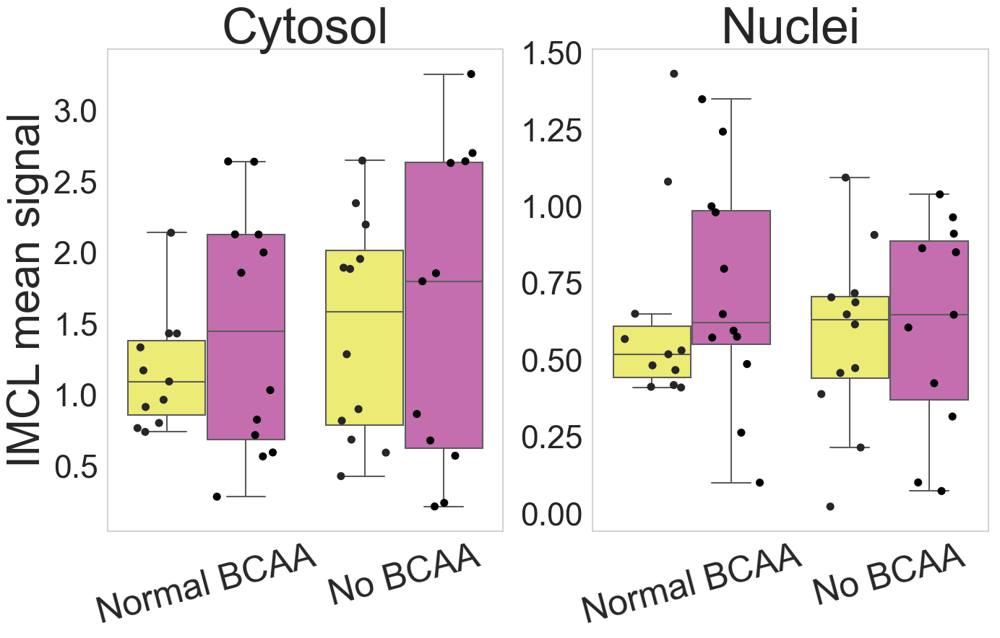

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN5_signal_fraction:
             df     sum_sq   mean_sq         F    PR(>F)
BCAA       1.0   0.604267  0.604267  2.166469  0.148685
EPS        1.0   0.742560  0.742560  2.662289  0.110411
BCAA:EPS   1.0   0.021987  0.021987  0.078829  0.780302
Residual  41.0  11.435629  0.278918       NaN       NaN
Shapiro-Wilk p-value for PLIN5_signal_fraction in Normal BCAA : 0.0084##
Shapiro-Wilk p-value for PLIN5_signal_fraction in No BCAA : 0.3865

MW P value between Normal BCAA and No BCAA: 0.0627
t-test P value between Normal BCAA and No BCAA: 0.1517

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN5_signal_fraction:
             df     sum_sq   mean_sq         F    PR(>

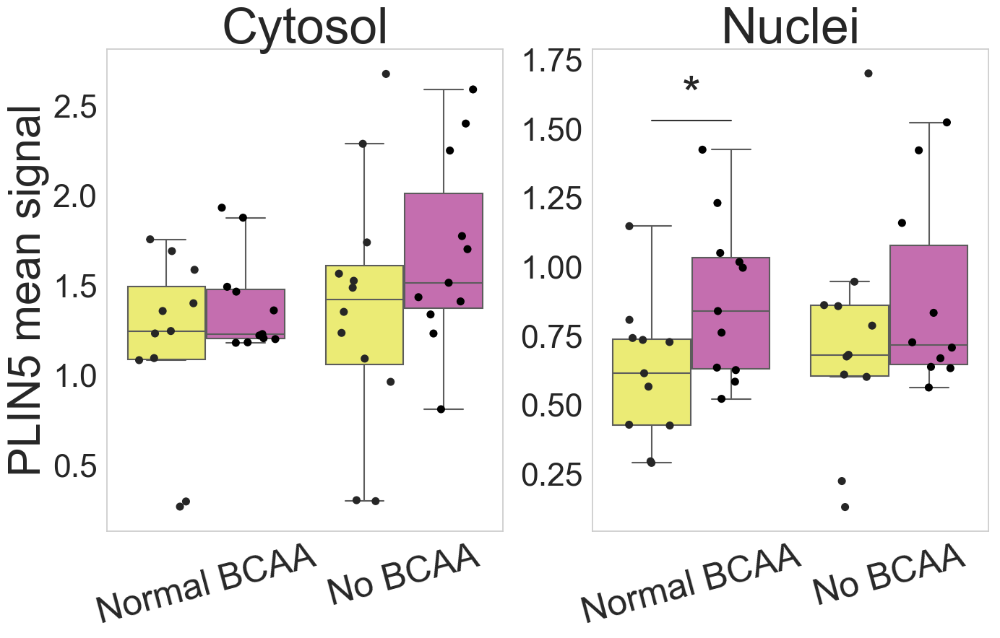

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN5.vs.IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.001099  0.001099  0.044455  0.834080
EPS        1.0  0.002697  0.002697  0.109123  0.742869
BCAA:EPS   1.0  0.003202  0.003202  0.129551  0.720791
Residual  40.0  0.988584  0.024715       NaN       NaN
Shapiro-Wilk p-value for PLIN5.vs.IMCL in Normal BCAA : 0.1004
Shapiro-Wilk p-value for PLIN5.vs.IMCL in No BCAA : 0.0074##

MW P value between Normal BCAA and No BCAA: 0.4209
t-test P value between Normal BCAA and No BCAA: 0.8305

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN5.vs.IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.001099  0.001099 

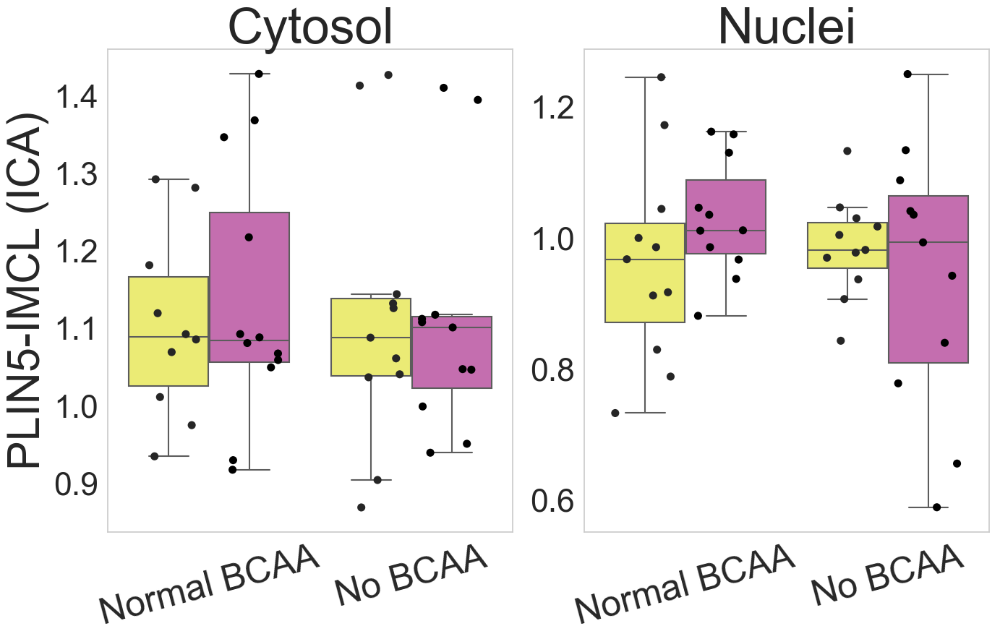

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on IMCL.vs.PLIN5:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.001166  0.001166  0.008740  0.925969
EPS        1.0  0.135063  0.135063  1.012048  0.320313
BCAA:EPS   1.0  0.071688  0.071688  0.537170  0.467778
Residual  41.0  5.471658  0.133455       NaN       NaN
Shapiro-Wilk p-value for IMCL.vs.PLIN5 in Normal BCAA : 0.1434
Shapiro-Wilk p-value for IMCL.vs.PLIN5 in No BCAA : 0.3122

MW P value between Normal BCAA and No BCAA: 0.4503
t-test P value between Normal BCAA and No BCAA: 0.9256

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on IMCL.vs.PLIN5:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.001166  0.001166  0.008740  0

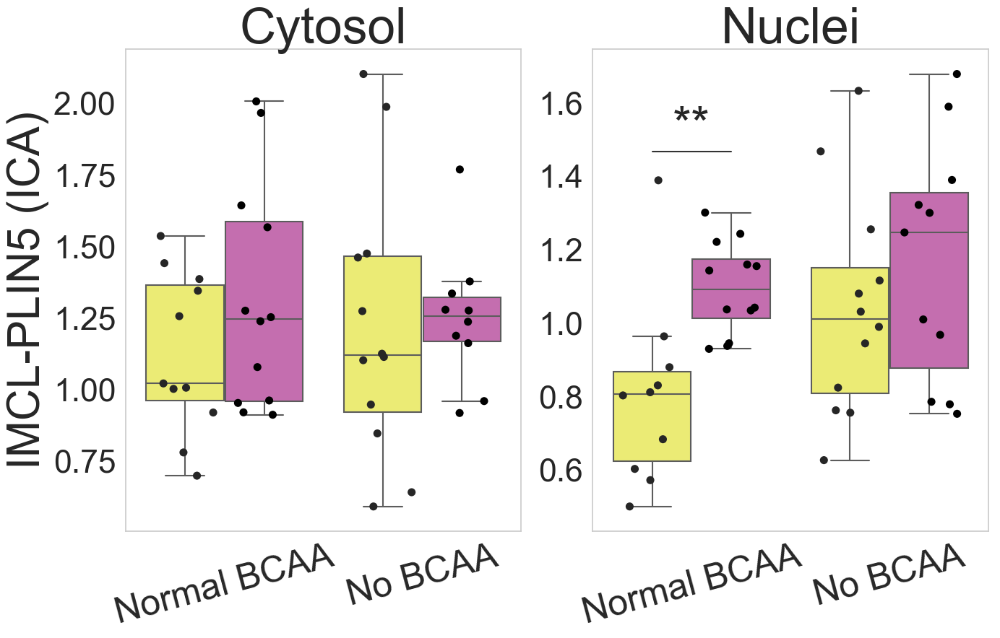

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PGC1a.vs.PLIN5-IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.854843  0.854843  4.005336  0.068495
EPS        1.0  0.790309  0.790309  3.702966  0.078352
BCAA:EPS   1.0  0.089236  0.089236  0.418112  0.530054
Residual  12.0  2.561112  0.213426       NaN       NaN
Shapiro-Wilk p-value for PGC1a.vs.PLIN5-IMCL in Normal BCAA : 0.0963
Shapiro-Wilk p-value for PGC1a.vs.PLIN5-IMCL in No BCAA : 0.3549

MW P value between Normal BCAA and No BCAA: 0.3566
t-test P value between Normal BCAA and No BCAA: 0.2887

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PGC1a.vs.PLIN5-IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.85484

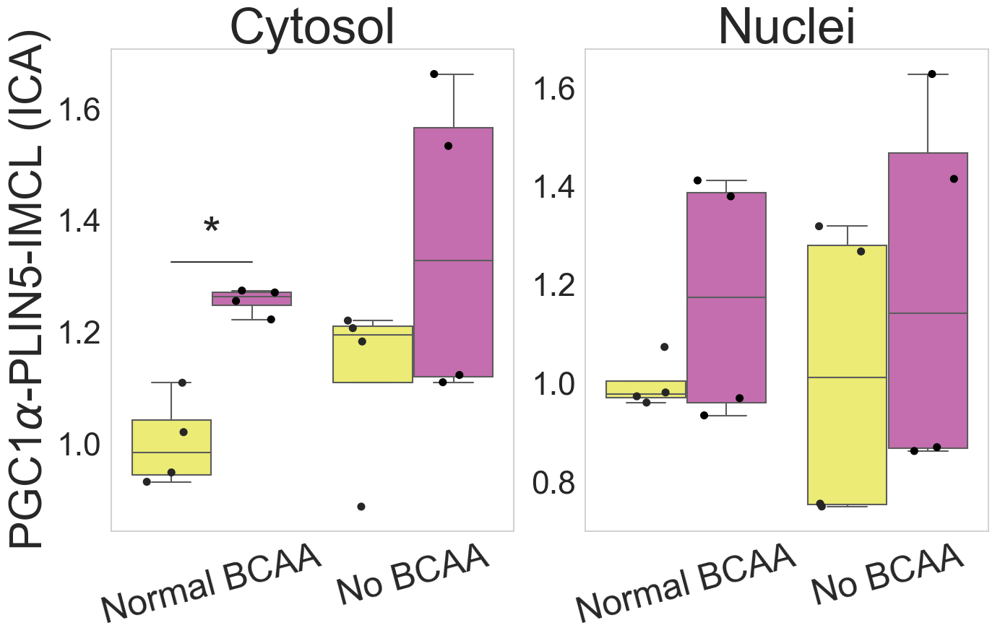

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN2_signal_fraction:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.054072  0.054072  0.269659  0.613004
EPS        1.0  0.006832  0.006832  0.034070  0.856641
BCAA:EPS   1.0  0.087634  0.087634  0.437032  0.521049
Residual  12.0  2.406254  0.200521       NaN       NaN
Shapiro-Wilk p-value for PLIN2_signal_fraction in Normal BCAA : 0.5483
Shapiro-Wilk p-value for PLIN2_signal_fraction in No BCAA : 0.0431#

MW P value between Normal BCAA and No BCAA: 0.1351
t-test P value between Normal BCAA and No BCAA: 0.5909

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN2_signal_fraction:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA

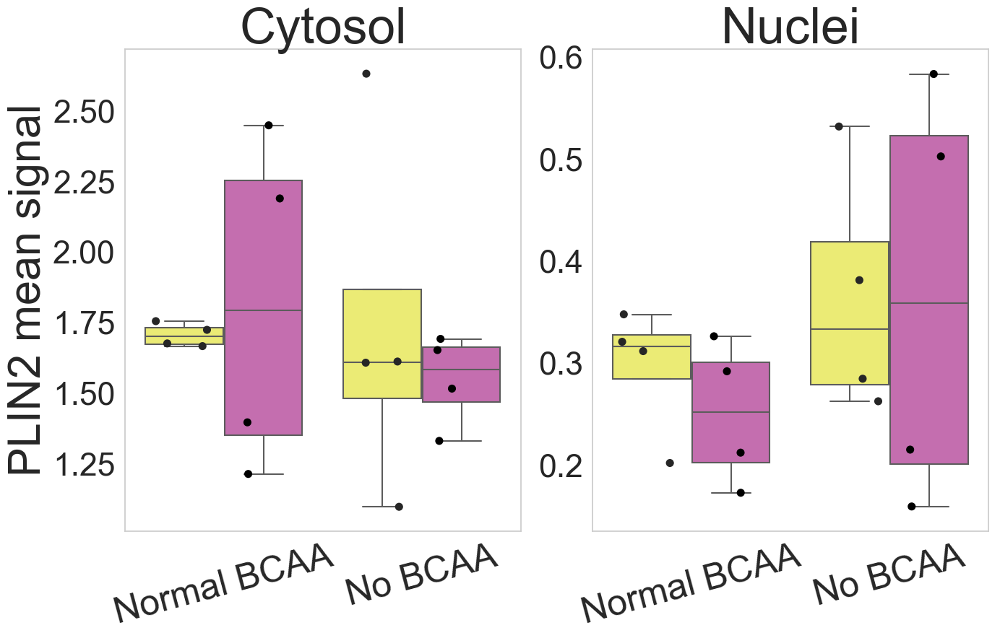

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN2.vs.IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.105708  0.105708  6.008341  0.030527
EPS        1.0  0.002001  0.002001  0.113740  0.741752
BCAA:EPS   1.0  0.032436  0.032436  1.843613  0.199512
Residual  12.0  0.211123  0.017594       NaN       NaN
Shapiro-Wilk p-value for PLIN2.vs.IMCL in Normal BCAA : 0.2323
Shapiro-Wilk p-value for PLIN2.vs.IMCL in No BCAA : 0.6848

MW P value between Normal BCAA and No BCAA: 0.026#
t-test P value between Normal BCAA and No BCAA: 0.0278#

parametric tests are more advised. T-test will be used

signifficant pairs: [('Normal BCAA', 'No BCAA')]
p-value if signifficant: [0.0278] 


 2-WAY ANOVA on PLIN2.vs.IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0

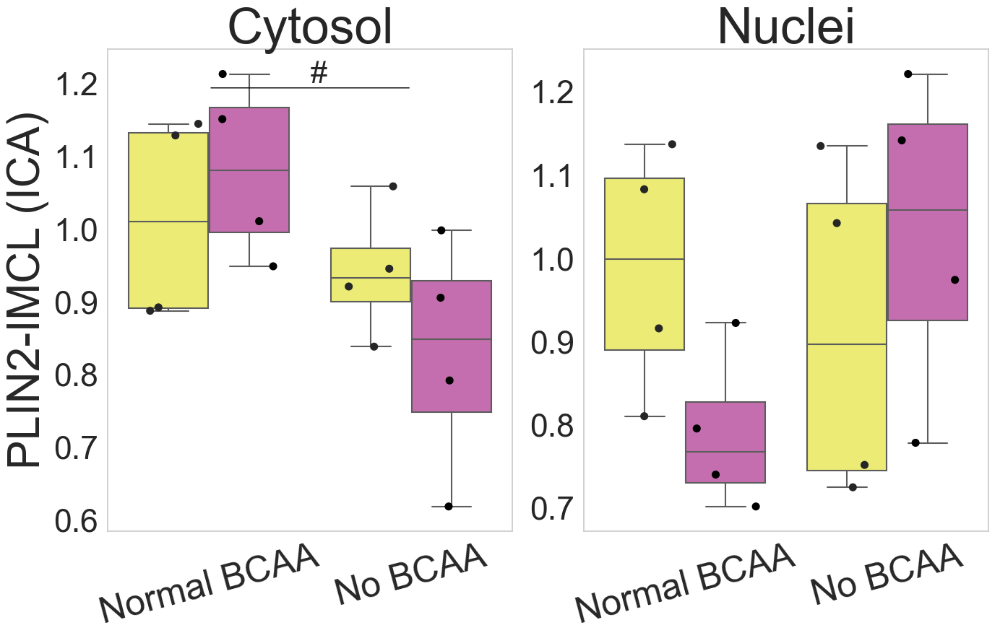

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on IMCL.vs.PLIN2:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.005690  0.005690  0.255508  0.622379
EPS        1.0  0.041908  0.041908  1.881755  0.195237
BCAA:EPS   1.0  0.004934  0.004934  0.221562  0.646293
Residual  12.0  0.267248  0.022271       NaN       NaN
Shapiro-Wilk p-value for IMCL.vs.PLIN2 in Normal BCAA : 0.1207
Shapiro-Wilk p-value for IMCL.vs.PLIN2 in No BCAA : 0.6551

MW P value between Normal BCAA and No BCAA: 0.1136
t-test P value between Normal BCAA and No BCAA: 0.6224

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on IMCL.vs.PLIN2:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.005690  0.005690  0.255508  0

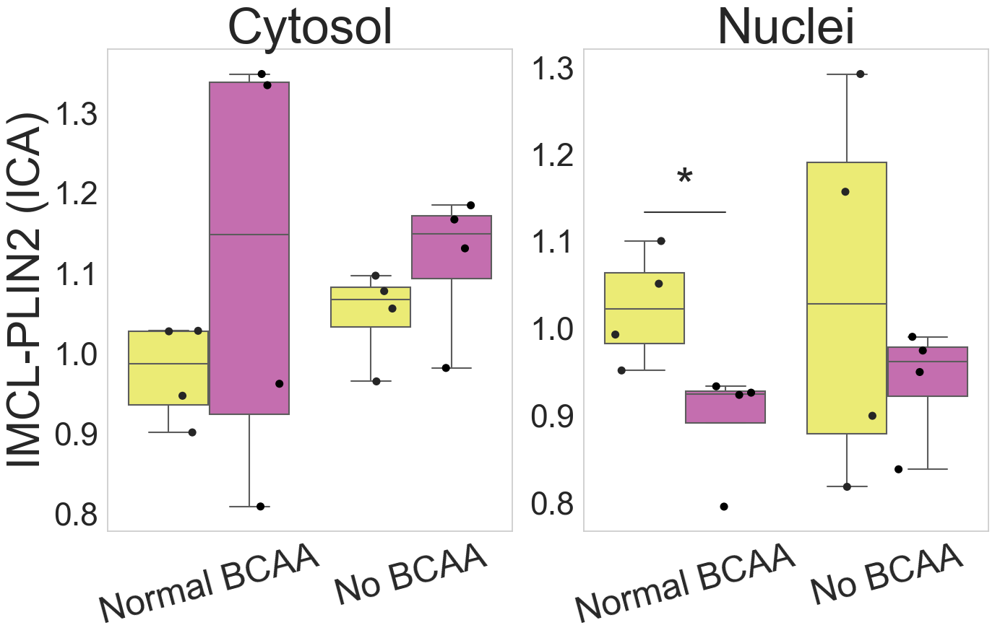

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN5.vs.PLIN2:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.005481  0.005481  0.287702  0.601499
EPS        1.0  0.028802  0.028802  1.511851  0.242420
BCAA:EPS   1.0  0.033943  0.033943  1.781691  0.206715
Residual  12.0  0.228613  0.019051       NaN       NaN
Shapiro-Wilk p-value for PLIN5.vs.PLIN2 in Normal BCAA : 0.7687
Shapiro-Wilk p-value for PLIN5.vs.PLIN2 in No BCAA : 0.7835

MW P value between Normal BCAA and No BCAA: 0.3183
t-test P value between Normal BCAA and No BCAA: 0.6158

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN5.vs.PLIN2:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.005481  0.005481  0.28770

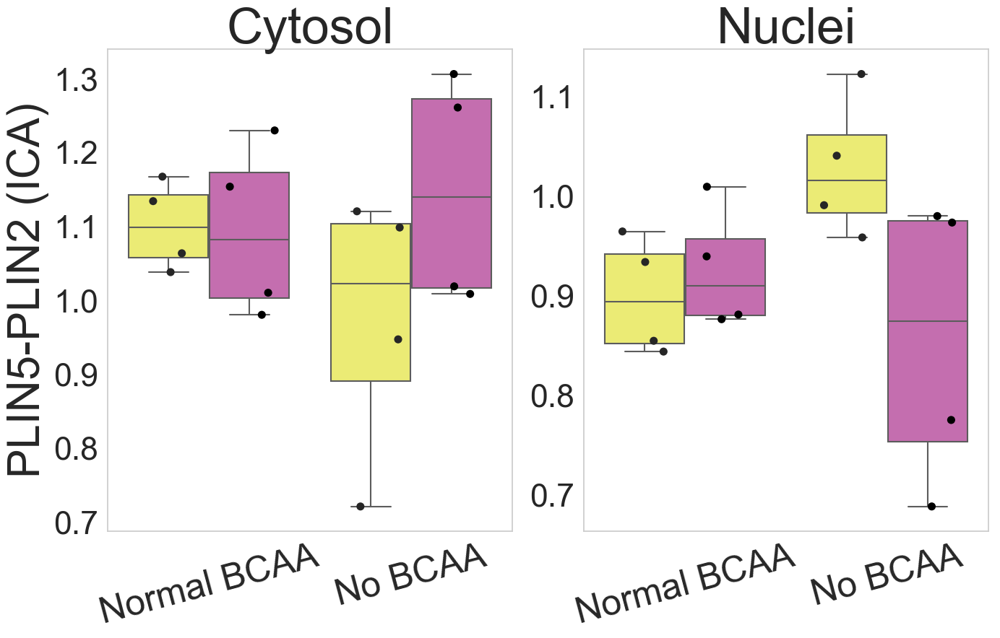

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN2.vs.PLIN5:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.023493  0.023493  0.301284  0.593145
EPS        1.0  0.085453  0.085453  1.095910  0.315794
BCAA:EPS   1.0  0.099769  0.099769  1.279502  0.280092
Residual  12.0  0.935697  0.077975       NaN       NaN
Shapiro-Wilk p-value for PLIN2.vs.PLIN5 in Normal BCAA : 0.7996
Shapiro-Wilk p-value for PLIN2.vs.PLIN5 in No BCAA : 0.6991

MW P value between Normal BCAA and No BCAA: 0.2818
t-test P value between Normal BCAA and No BCAA: 0.5966

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN2.vs.PLIN5:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.023493  0.023493  0.30128

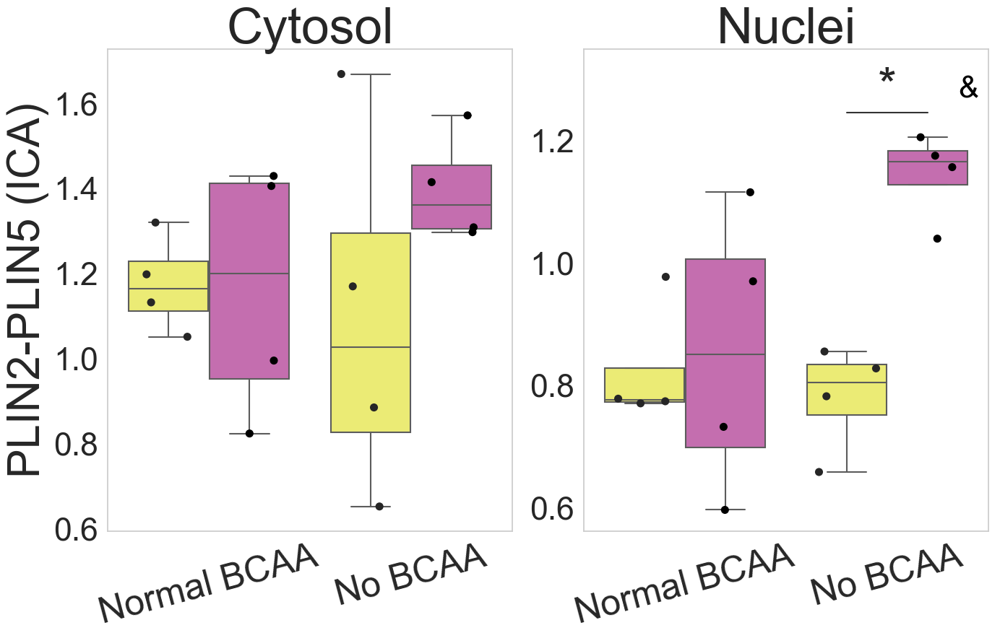

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PGC1a_signal_fraction:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.383997  0.383997  1.655698  0.222454
EPS        1.0  0.012007  0.012007  0.051769  0.823843
BCAA:EPS   1.0  0.131244  0.131244  0.565890  0.466397
Residual  12.0  2.783092  0.231924       NaN       NaN
Shapiro-Wilk p-value for PGC1a_signal_fraction in Normal BCAA : 0.1945
Shapiro-Wilk p-value for PGC1a_signal_fraction in No BCAA : 0.7683

MW P value between Normal BCAA and No BCAA: 0.1351
t-test P value between Normal BCAA and No BCAA: 0.1968

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PGC1a_signal_fraction:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0 

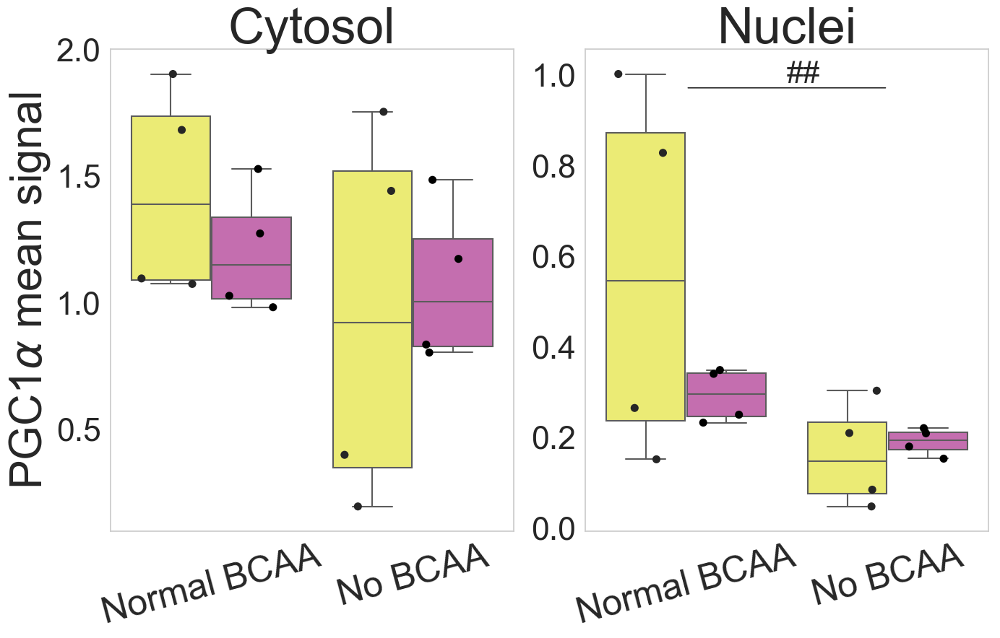

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PGC1a.vs.IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.056183  0.056183  0.738712  0.410205
EPS        1.0  0.130659  0.130659  1.717940  0.219260
BCAA:EPS   1.0  0.000498  0.000498  0.006546  0.937111
Residual  10.0  0.760554  0.076055       NaN       NaN
Shapiro-Wilk p-value for PGC1a.vs.IMCL in Normal BCAA : 0.0598
Shapiro-Wilk p-value for PGC1a.vs.IMCL in No BCAA : 0.0158#

MW P value between Normal BCAA and No BCAA: 0.3046
t-test P value between Normal BCAA and No BCAA: 0.4016

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PGC1a.vs.IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.056183  0.056183  

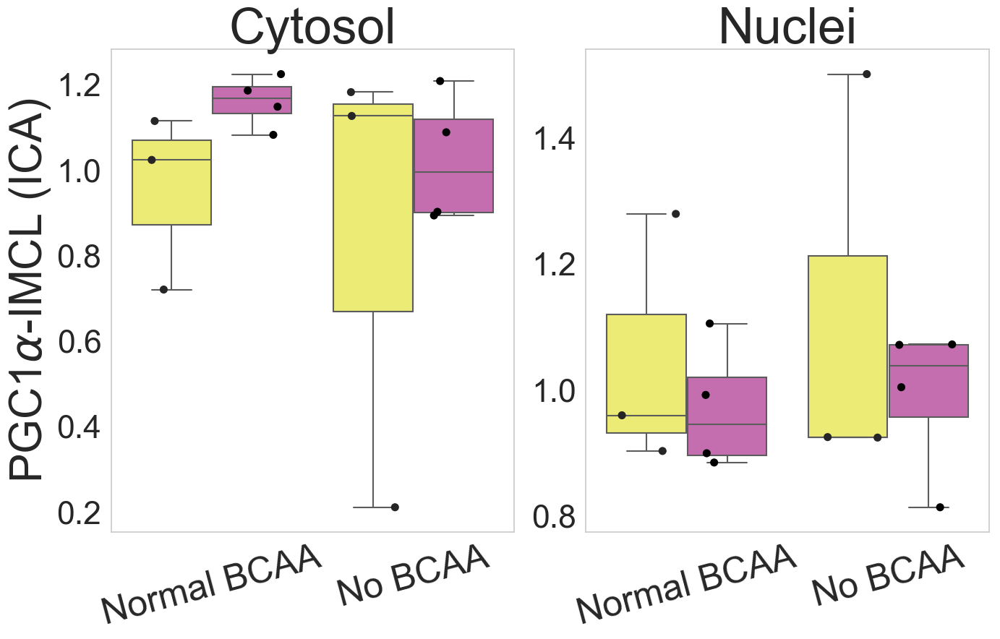

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on IMCL.vs.PGC1a:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.155580  0.155580  1.674095  0.224795
EPS        1.0  0.362307  0.362307  3.898558  0.076573
BCAA:EPS   1.0  0.018240  0.018240  0.196264  0.667183
Residual  10.0  0.929337  0.092934       NaN       NaN
Shapiro-Wilk p-value for IMCL.vs.PGC1a in Normal BCAA : 0.9301
Shapiro-Wilk p-value for IMCL.vs.PGC1a in No BCAA : 0.0814

MW P value between Normal BCAA and No BCAA: 0.1251
t-test P value between Normal BCAA and No BCAA: 0.2556

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on IMCL.vs.PGC1a:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.155580  0.155580  1.674095  0

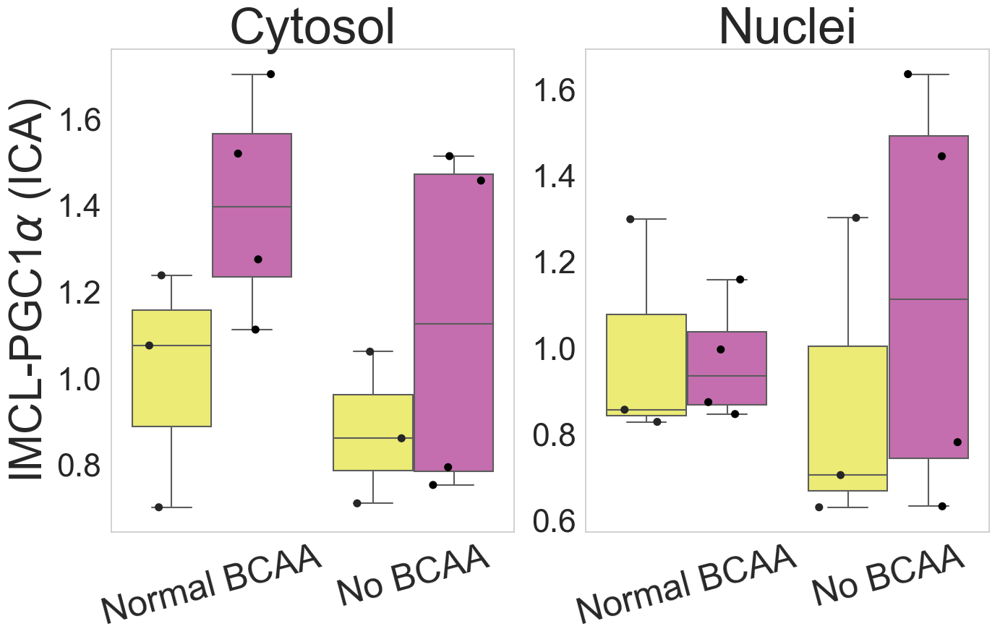

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN5.vs.PGC1a:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.483647  0.483647  1.927710  0.190244
EPS        1.0  0.724255  0.724255  2.886718  0.115066
BCAA:EPS   1.0  0.006021  0.006021  0.024000  0.879459
Residual  12.0  3.010707  0.250892       NaN       NaN
Shapiro-Wilk p-value for PLIN5.vs.PGC1a in Normal BCAA : 0.2127
Shapiro-Wilk p-value for PLIN5.vs.PGC1a in No BCAA : 0.0372#

MW P value between Normal BCAA and No BCAA: 0.0781
t-test P value between Normal BCAA and No BCAA: 0.1999

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN5.vs.PGC1a:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.483647  0.4836

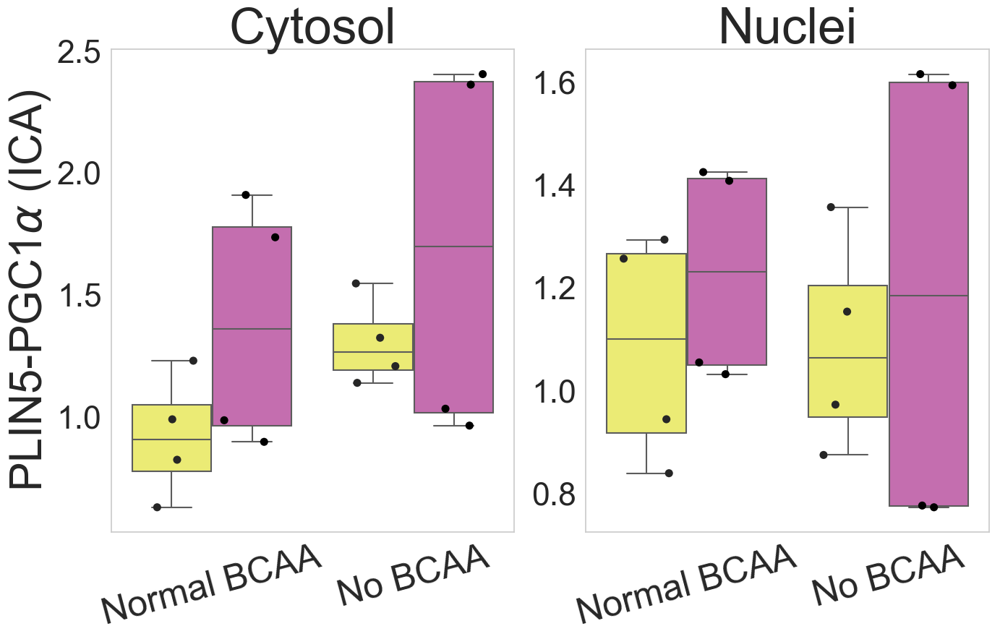

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PGC1a.vs.PLIN5:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.854843  0.854843  4.005336  0.068495
EPS        1.0  0.790309  0.790309  3.702966  0.078352
BCAA:EPS   1.0  0.089236  0.089236  0.418112  0.530054
Residual  12.0  2.561112  0.213426       NaN       NaN
Shapiro-Wilk p-value for PGC1a.vs.PLIN5 in Normal BCAA : 0.0489#
Shapiro-Wilk p-value for PGC1a.vs.PLIN5 in No BCAA : 0.0164#

MW P value between Normal BCAA and No BCAA: 0.026#
t-test P value between Normal BCAA and No BCAA: 0.0833

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: [('Normal BCAA', 'No BCAA')]
p-value if signifficant: [0.026] 


 2-WAY ANOVA on PGC1a.vs.PLIN5:
             df    sum_sq   mean_sq         F    PR(>F)


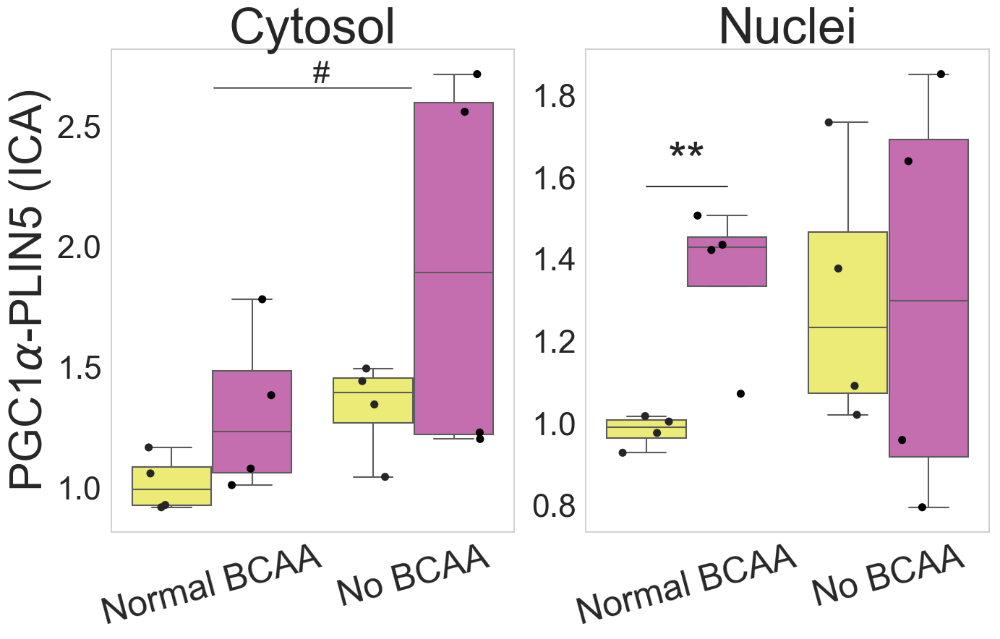

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PCK1_signal_fraction:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  1.402936  1.402936  7.142466  0.021695
EPS        1.0  0.682451  0.682451  3.474415  0.089215
BCAA:EPS   1.0  0.281872  0.281872  1.435033  0.256119
Residual  11.0  2.160640  0.196422       NaN       NaN
Shapiro-Wilk p-value for PCK1_signal_fraction in Normal BCAA : 0.016#
Shapiro-Wilk p-value for PCK1_signal_fraction in No BCAA : 0.8887

MW P value between Normal BCAA and No BCAA: 0.0214#
t-test P value between Normal BCAA and No BCAA: 0.0311#

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: [('Normal BCAA', 'No BCAA')]
p-value if signifficant: [0.0214] 


 2-WAY ANOVA on PCK1_signal_fraction:
             df    sum_sq   mea

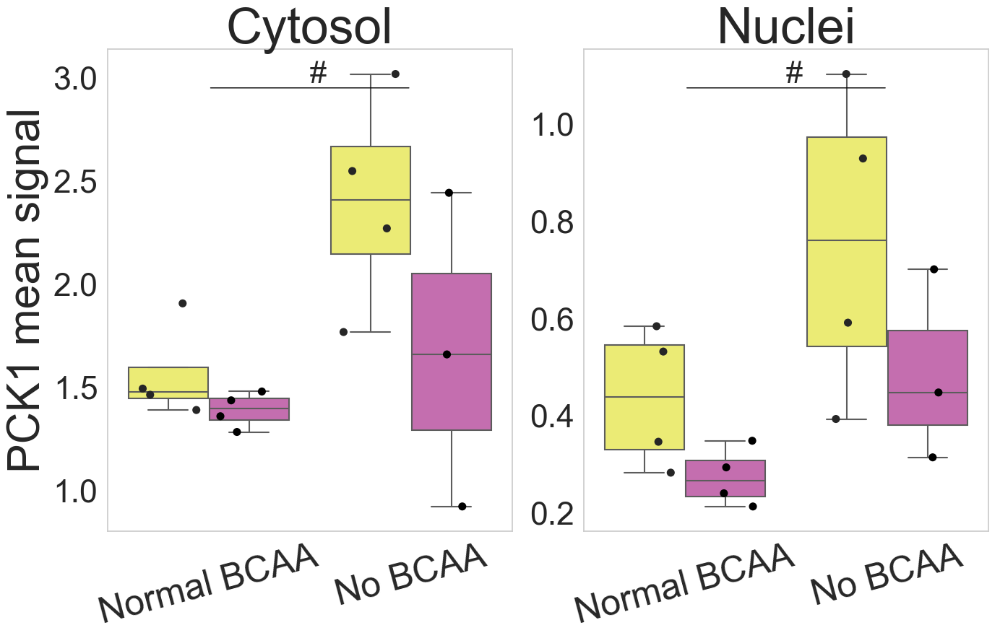

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PCK1.vs.IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.004349  0.004349  0.098809  0.759145
EPS        1.0  0.037628  0.037628  0.854818  0.375030
BCAA:EPS   1.0  0.000286  0.000286  0.006488  0.937248
Residual  11.0  0.484211  0.044019       NaN       NaN
Shapiro-Wilk p-value for PCK1.vs.IMCL in Normal BCAA : 0.1308
Shapiro-Wilk p-value for PCK1.vs.IMCL in No BCAA : 0.2501

MW P value between Normal BCAA and No BCAA: 0.3427
t-test P value between Normal BCAA and No BCAA: 0.7473

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PCK1.vs.IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.004349  0.004349  0.098809  0.759

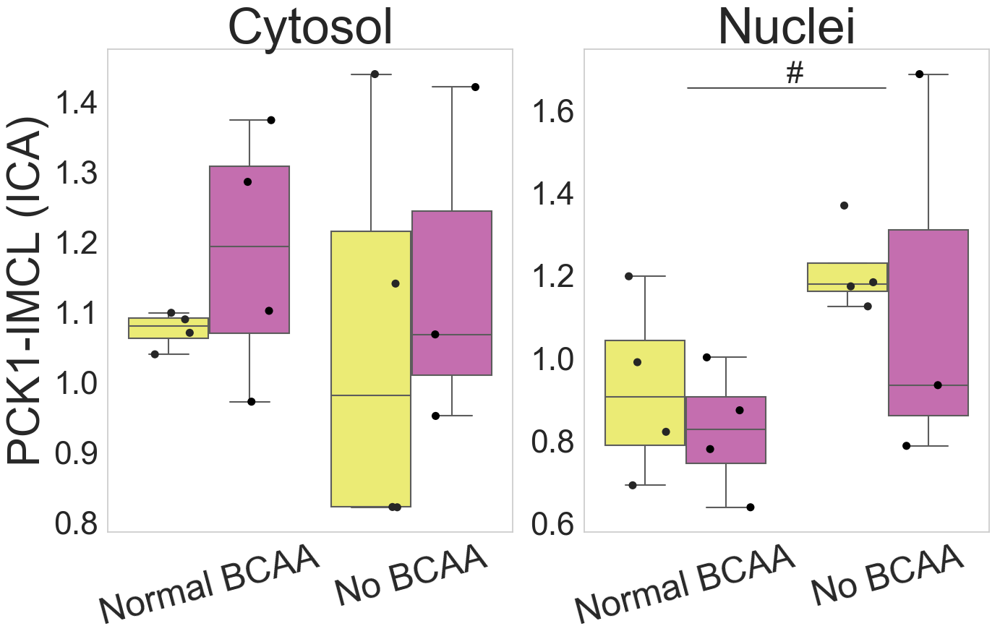

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on IMCL.vs.PCK1:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.037776  0.037776  1.395952  0.262316
EPS        1.0  0.047605  0.047605  1.759163  0.211608
BCAA:EPS   1.0  0.007844  0.007844  0.289877  0.601024
Residual  11.0  0.297672  0.027061       NaN       NaN
Shapiro-Wilk p-value for IMCL.vs.PCK1 in Normal BCAA : 0.0228#
Shapiro-Wilk p-value for IMCL.vs.PCK1 in No BCAA : 0.3144

MW P value between Normal BCAA and No BCAA: 0.226
t-test P value between Normal BCAA and No BCAA: 0.2594

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on IMCL.vs.PCK1:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.037776  0.037776  1.395

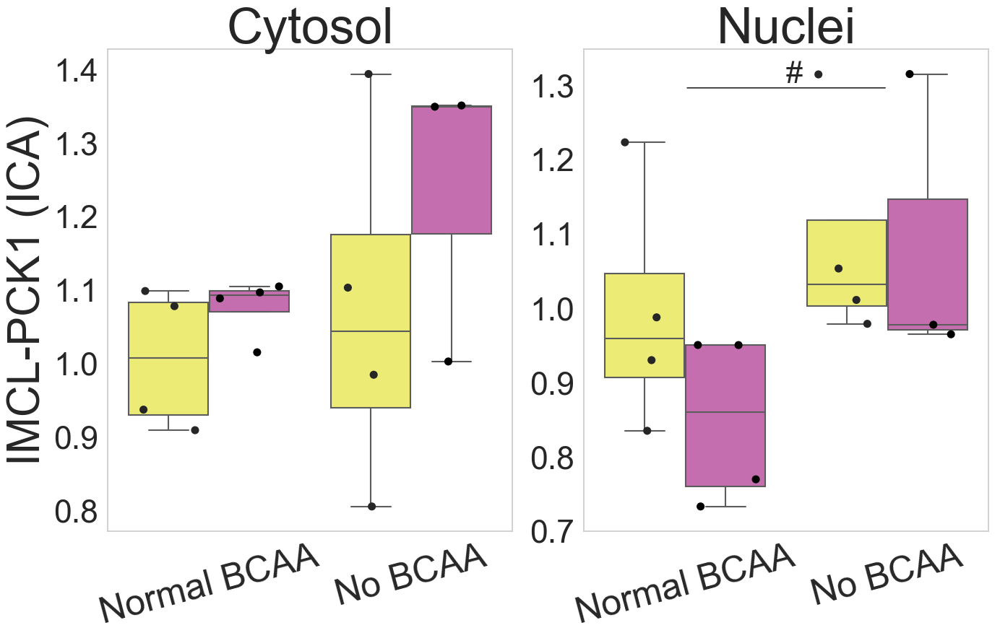

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN5.vs.PCK1:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.002543  0.002543  0.302111  0.593545
EPS        1.0  0.000283  0.000283  0.033585  0.857927
BCAA:EPS   1.0  0.000002  0.000002  0.000182  0.989473
Residual  11.0  0.092574  0.008416       NaN       NaN
Shapiro-Wilk p-value for PLIN5.vs.PCK1 in Normal BCAA : 0.5085
Shapiro-Wilk p-value for PLIN5.vs.PCK1 in No BCAA : 0.2509

MW P value between Normal BCAA and No BCAA: 0.4769
t-test P value between Normal BCAA and No BCAA: 0.561

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN5.vs.PCK1:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.002543  0.002543  0.302111  0.

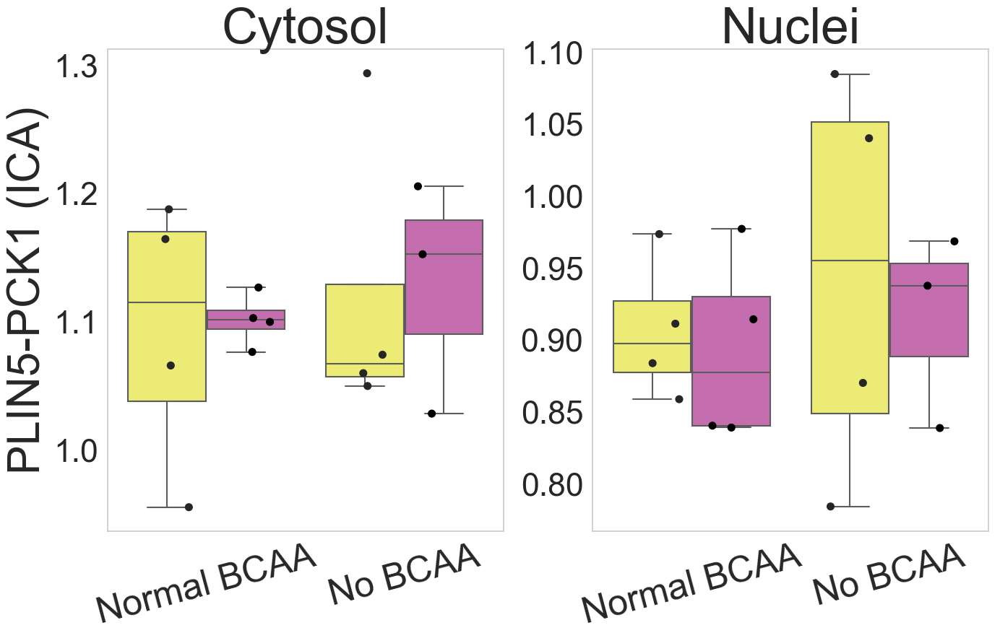

Normal BCAA group seems to have insufficient number of cases (0)
No BCAA group seems to have insufficient number of cases (0)
Normal BCAA and No BCAA could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PCK1.vs.PLIN5:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.055715  0.055715  0.379797  0.550252
EPS        1.0  0.205463  0.205463  1.400606  0.261568
BCAA:EPS   1.0  0.185677  0.185677  1.265726  0.284519
Residual  11.0  1.613657  0.146696       NaN       NaN
Shapiro-Wilk p-value for PCK1.vs.PLIN5 in Normal BCAA : 0.7278
Shapiro-Wilk p-value for PCK1.vs.PLIN5 in No BCAA : 0.1119

MW P value between Normal BCAA and No BCAA: 0.4769
t-test P value between Normal BCAA and No BCAA: 0.5581

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PCK1.vs.PLIN5:
             df    sum_sq   mean_sq         F    PR(>F)
BCAA       1.0  0.055715  0.055715  0.379797  0

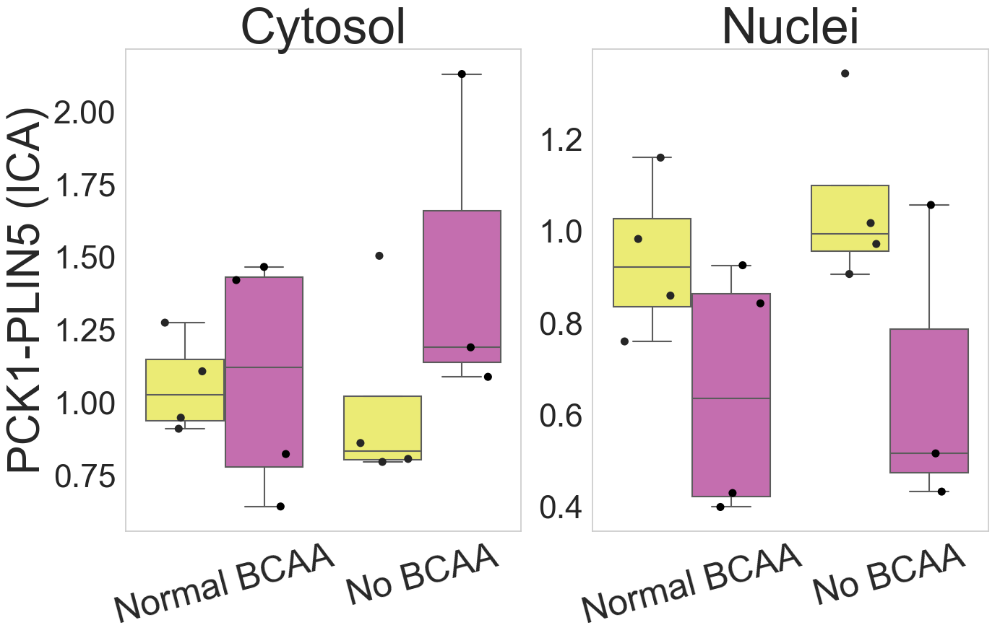

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on IMCL_signal_fraction:
             df     sum_sq   mean_sq         F    PR(>F)
EPS        1.0   0.429258  0.429258  0.624998  0.433638
BCAA       1.0   0.561624  0.561624  0.817723  0.371005
EPS:BCAA   1.0   0.084556  0.084556  0.123114  0.727436
Residual  42.0  28.846225  0.686815       NaN       NaN
Shapiro-Wilk p-value for IMCL_signal_fraction in Rest : 0.0988
Shapiro-Wilk p-value for IMCL_signal_fraction in EPS : 0.0267#

MW P value between Rest and EPS: 0.4389
t-test P value between Rest and EPS: 0.4279

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on IMCL_signal_fraction:
             df     sum_sq   mean_sq         F    PR(>F)
EPS        1.0   0.429258  0.429258  0.624998  0.433638
B

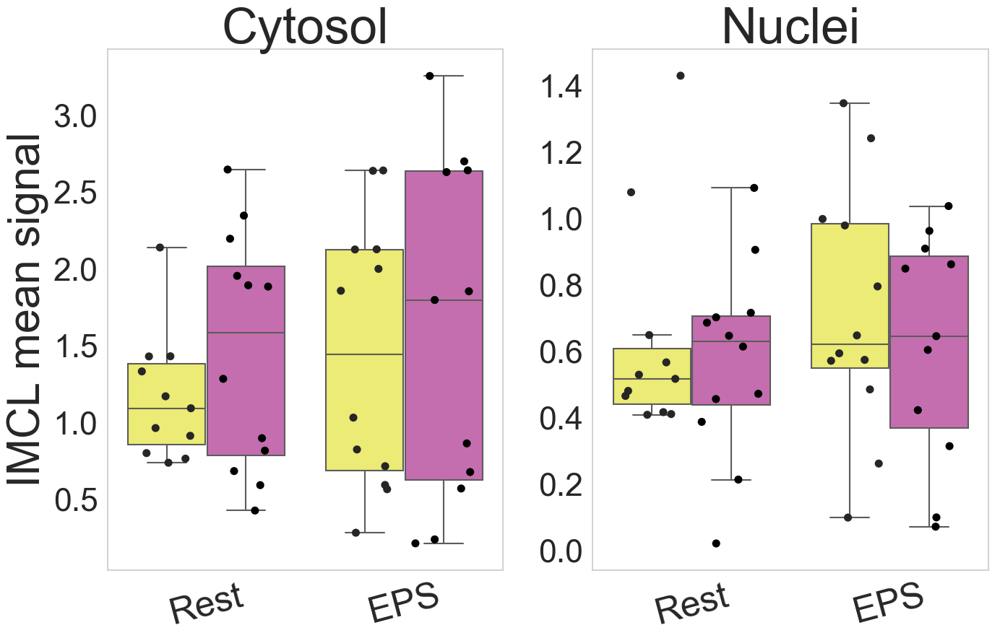

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN5_signal_fraction:
             df     sum_sq   mean_sq         F    PR(>F)
EPS        1.0   0.713377  0.713377  2.557661  0.117440
BCAA       1.0   0.633449  0.633449  2.271097  0.139474
EPS:BCAA   1.0   0.021987  0.021987  0.078829  0.780302
Residual  41.0  11.435629  0.278918       NaN       NaN
Shapiro-Wilk p-value for PLIN5_signal_fraction in Rest : 0.11
Shapiro-Wilk p-value for PLIN5_signal_fraction in EPS : 0.0284#

MW P value between Rest and EPS: 0.1305
t-test P value between Rest and EPS: 0.1185

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN5_signal_fraction:
             df     sum_sq   mean_sq         F    PR(>F)
EPS        1.0   0.713377  0.713377  2.557661  0.117440

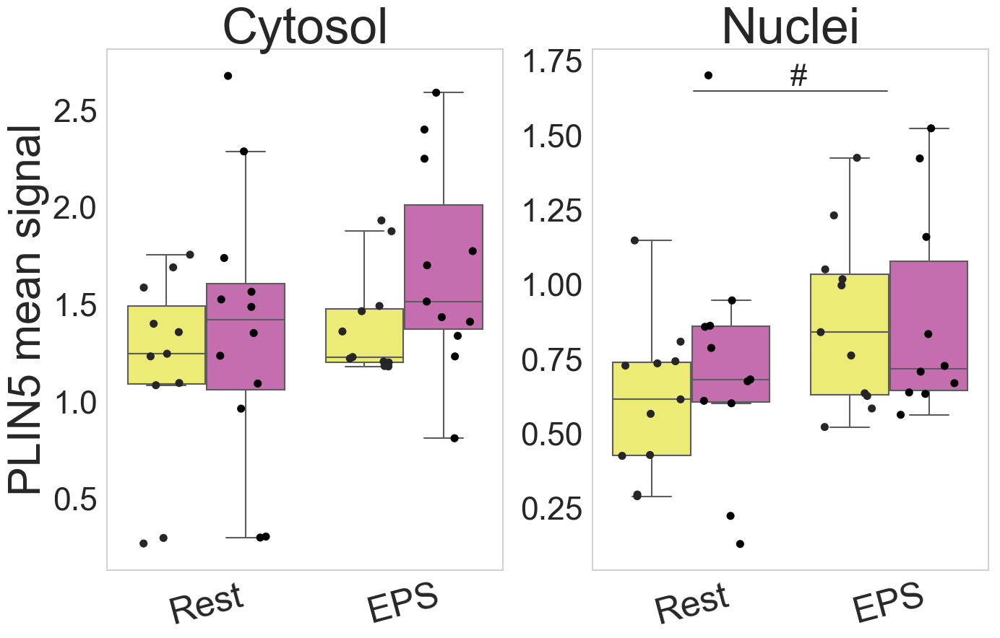

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN5.vs.IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.002850  0.002850  0.115321  0.735943
BCAA       1.0  0.000946  0.000946  0.038257  0.845918
EPS:BCAA   1.0  0.003202  0.003202  0.129551  0.720791
Residual  40.0  0.988584  0.024715       NaN       NaN
Shapiro-Wilk p-value for PLIN5.vs.IMCL in Rest : 0.2247
Shapiro-Wilk p-value for PLIN5.vs.IMCL in EPS : 0.0063##

MW P value between Rest and EPS: 0.4813
t-test P value between Rest and EPS: 0.7301

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN5.vs.IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.002850  0.002850  0.115321  0.735943
BCAA       1.0  0.000946  0.000946 

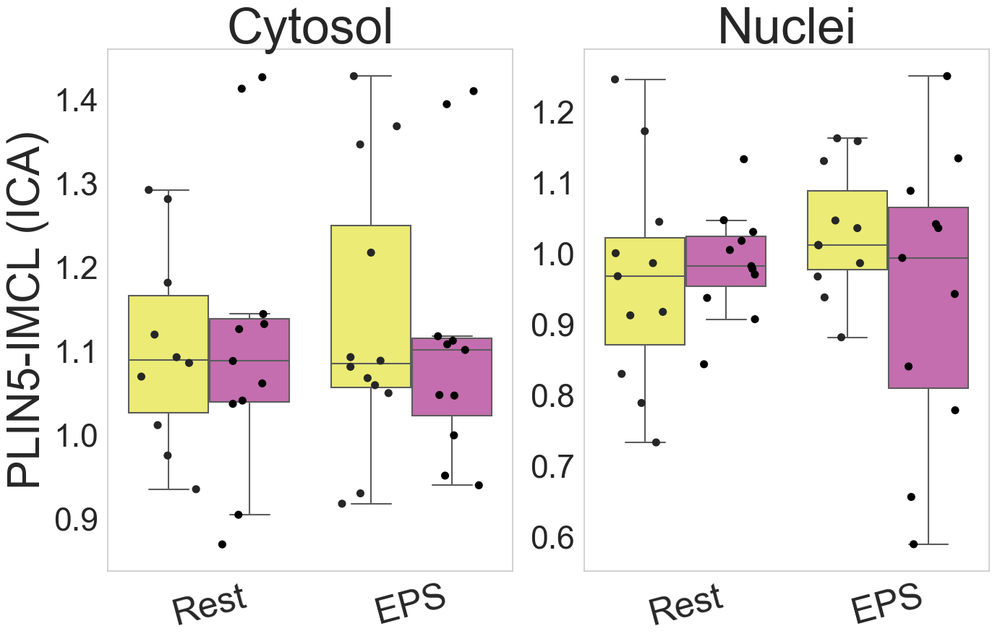

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on IMCL.vs.PLIN5:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.132775  0.132775  0.994907  0.324397
BCAA       1.0  0.003454  0.003454  0.025881  0.872981
EPS:BCAA   1.0  0.071688  0.071688  0.537170  0.467778
Residual  41.0  5.471658  0.133455       NaN       NaN
Shapiro-Wilk p-value for IMCL.vs.PLIN5 in Rest : 0.2895
Shapiro-Wilk p-value for IMCL.vs.PLIN5 in EPS : 0.0199#

MW P value between Rest and EPS: 0.1789
t-test P value between Rest and EPS: 0.316

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on IMCL.vs.PLIN5:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.132775  0.132775  0.994907  0.324397
BCAA       1.0  0.003454  0.003454  0

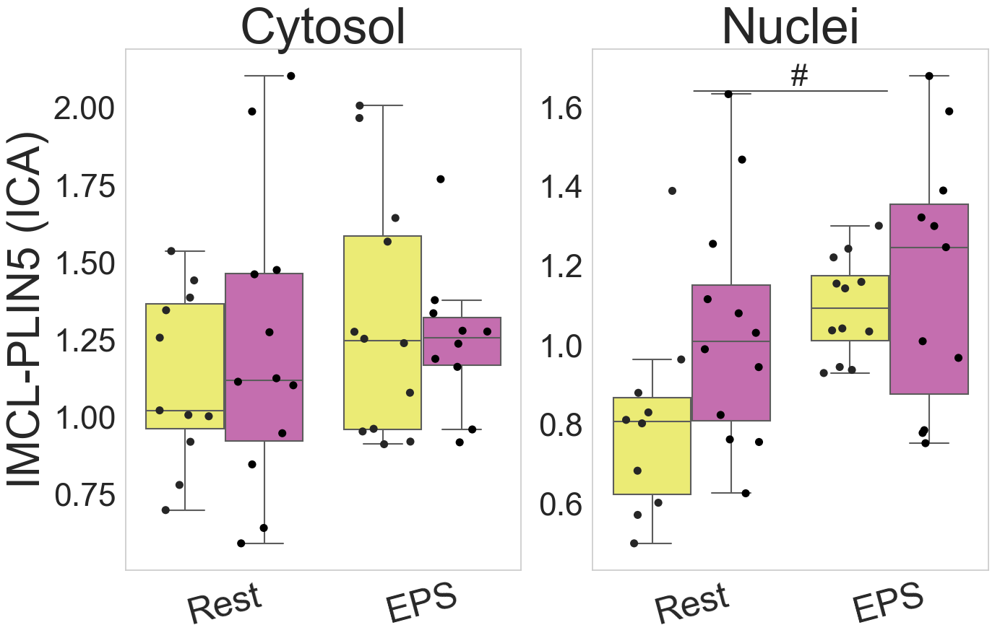

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PGC1a.vs.PLIN5-IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.790309  0.790309  3.702966  0.078352
BCAA       1.0  0.854843  0.854843  4.005336  0.068495
EPS:BCAA   1.0  0.089236  0.089236  0.418112  0.530054
Residual  12.0  2.561112  0.213426       NaN       NaN
Shapiro-Wilk p-value for PGC1a.vs.PLIN5-IMCL in Rest : 0.265
Shapiro-Wilk p-value for PGC1a.vs.PLIN5-IMCL in EPS : 0.1099

MW P value between Rest and EPS: 0.0037##
t-test P value between Rest and EPS: 0.0111#

parametric tests are more advised. T-test will be used

signifficant pairs: [('Rest', 'EPS')]
p-value if signifficant: [0.0111] 


 2-WAY ANOVA on PGC1a.vs.PLIN5-IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.790309  0.790309  3.702966  0.078352


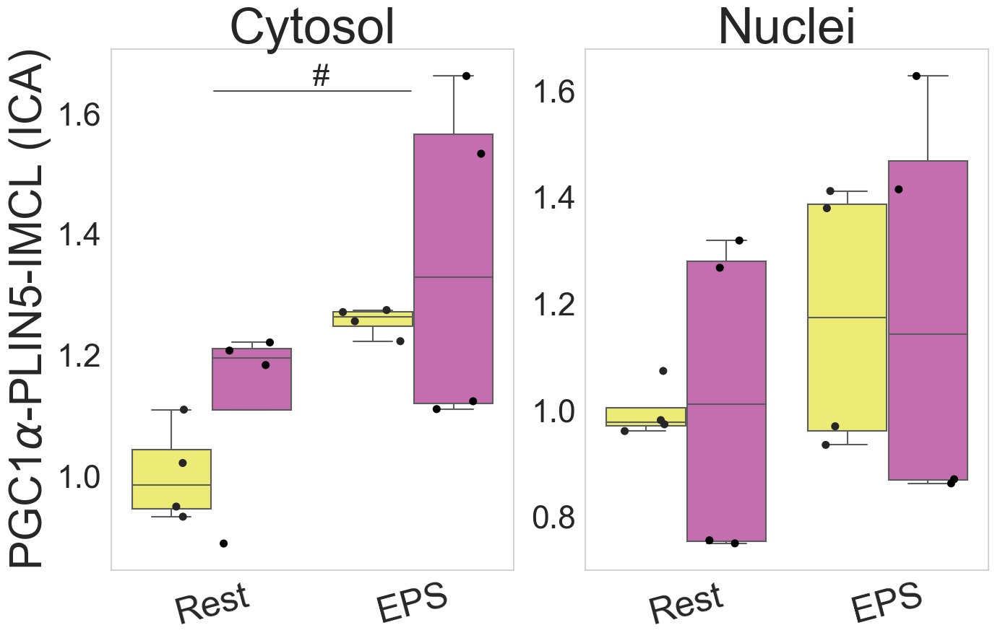

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN2_signal_fraction:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.006832  0.006832  0.034070  0.856641
BCAA       1.0  0.054072  0.054072  0.269659  0.613004
EPS:BCAA   1.0  0.087634  0.087634  0.437032  0.521049
Residual  12.0  2.406254  0.200521       NaN       NaN
Shapiro-Wilk p-value for PLIN2_signal_fraction in Rest : 0.0239#
Shapiro-Wilk p-value for PLIN2_signal_fraction in EPS : 0.2649

MW P value between Rest and EPS: 0.2818
t-test P value between Rest and EPS: 0.8492

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN2_signal_fraction:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.006832  0.006832  0.034070  0.856641
BCAA

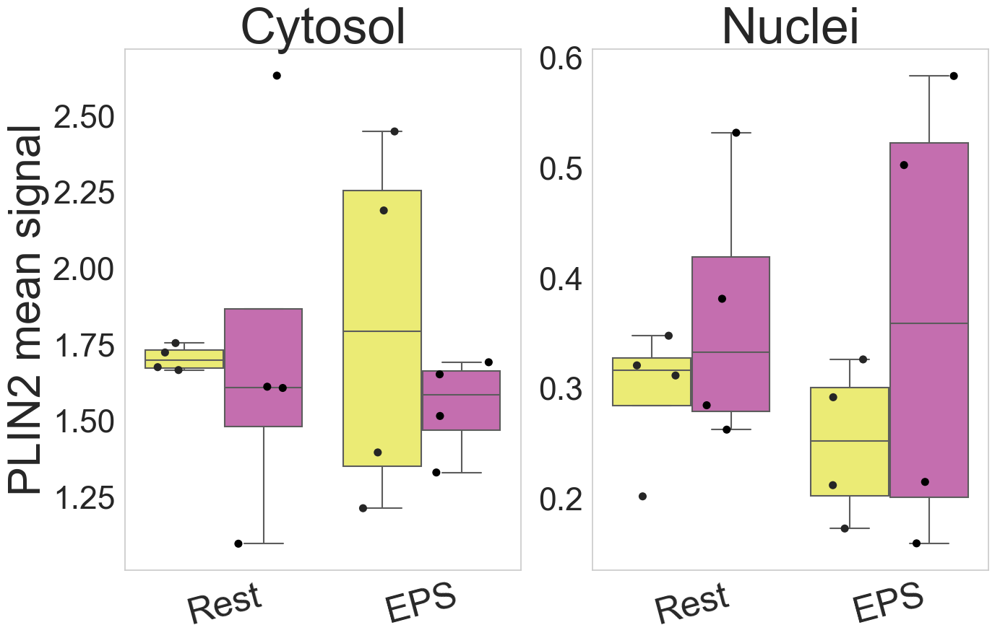

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN2.vs.IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.002001  0.002001  0.113740  0.741752
BCAA       1.0  0.105708  0.105708  6.008341  0.030527
EPS:BCAA   1.0  0.032436  0.032436  1.843613  0.199512
Residual  12.0  0.211123  0.017594       NaN       NaN
Shapiro-Wilk p-value for PLIN2.vs.IMCL in Rest : 0.2146
Shapiro-Wilk p-value for PLIN2.vs.IMCL in EPS : 0.8931

MW P value between Rest and EPS: 0.4374
t-test P value between Rest and EPS: 0.7812

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN2.vs.IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.002001  0.002001  0.113740  0.741752
BCAA       1.0  0.105708  0.105708  6.008341  0

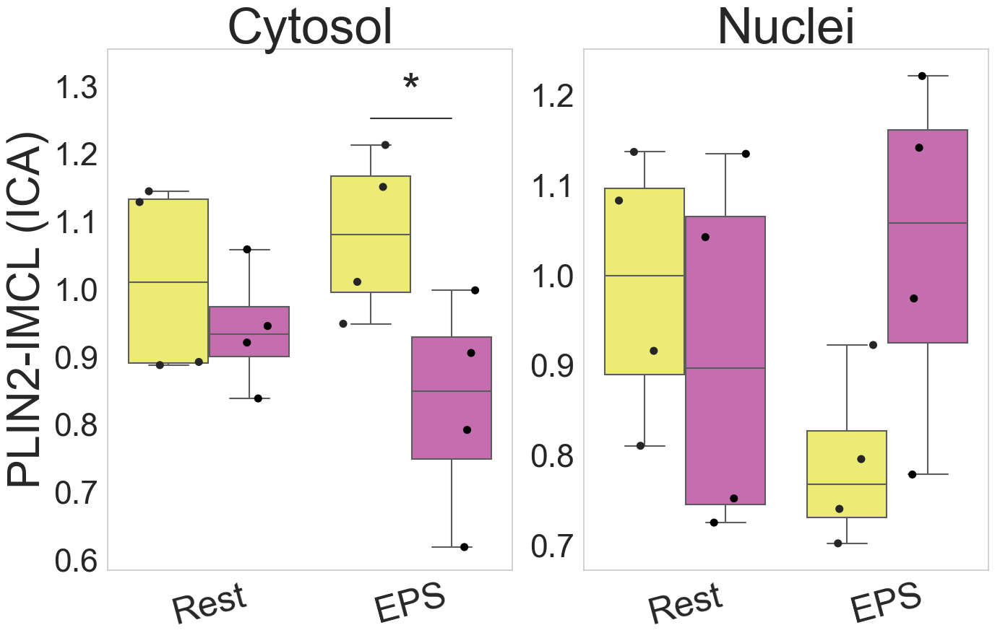

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on IMCL.vs.PLIN2:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.041908  0.041908  1.881755  0.195237
BCAA       1.0  0.005690  0.005690  0.255508  0.622379
EPS:BCAA   1.0  0.004934  0.004934  0.221562  0.646293
Residual  12.0  0.267248  0.022271       NaN       NaN
Shapiro-Wilk p-value for IMCL.vs.PLIN2 in Rest : 0.664
Shapiro-Wilk p-value for IMCL.vs.PLIN2 in EPS : 0.6743

MW P value between Rest and EPS: 0.0946
t-test P value between Rest and EPS: 0.1682

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on IMCL.vs.PLIN2:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.041908  0.041908  1.881755  0.195237
BCAA       1.0  0.005690  0.005690  0.255508  0.

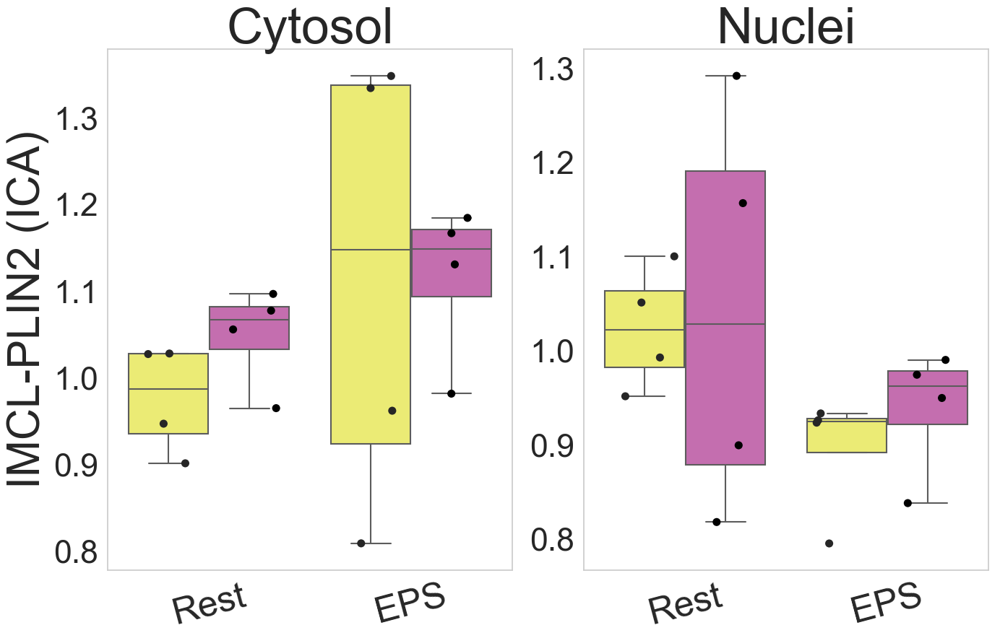

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN5.vs.PLIN2:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.028802  0.028802  1.511851  0.242420
BCAA       1.0  0.005481  0.005481  0.287702  0.601499
EPS:BCAA   1.0  0.033943  0.033943  1.781691  0.206715
Residual  12.0  0.228613  0.019051       NaN       NaN
Shapiro-Wilk p-value for PLIN5.vs.PLIN2 in Rest : 0.0457#
Shapiro-Wilk p-value for PLIN5.vs.PLIN2 in EPS : 0.1095

MW P value between Rest and EPS: 0.2474
t-test P value between Rest and EPS: 0.2402

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN5.vs.PLIN2:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.028802  0.028802  1.511851  0.242420
BCAA       1.0  0.005481  0.0054

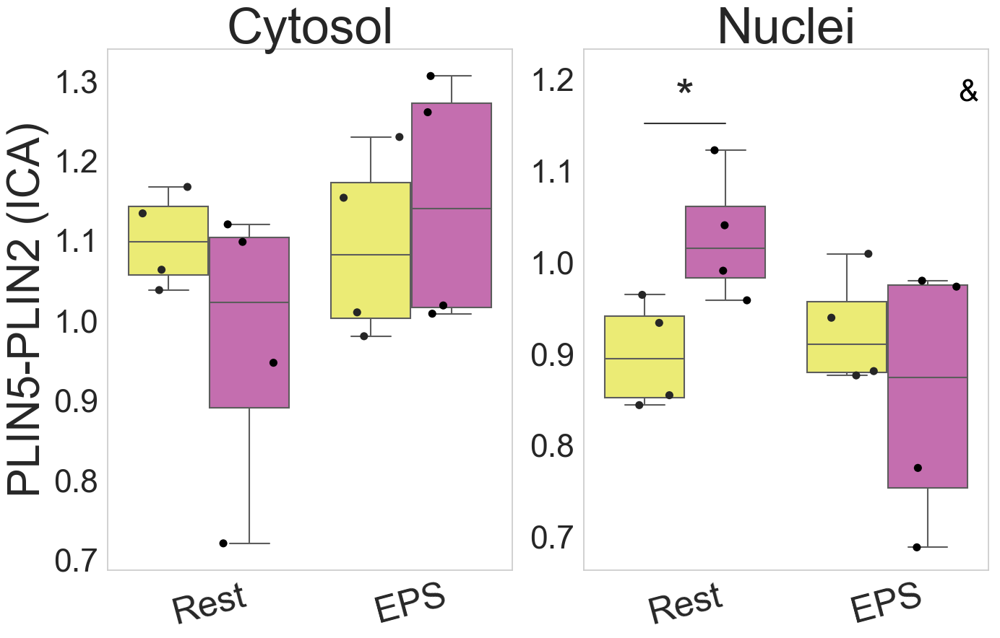

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN2.vs.PLIN5:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.085453  0.085453  1.095910  0.315794
BCAA       1.0  0.023493  0.023493  0.301284  0.593145
EPS:BCAA   1.0  0.099769  0.099769  1.279502  0.280092
Residual  12.0  0.935697  0.077975       NaN       NaN
Shapiro-Wilk p-value for PLIN2.vs.PLIN5 in Rest : 0.9105
Shapiro-Wilk p-value for PLIN2.vs.PLIN5 in EPS : 0.1832

MW P value between Rest and EPS: 0.1351
t-test P value between Rest and EPS: 0.3058

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN2.vs.PLIN5:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.085453  0.085453  1.095910  0.315794
BCAA       1.0  0.023493  0.023493  0.30128

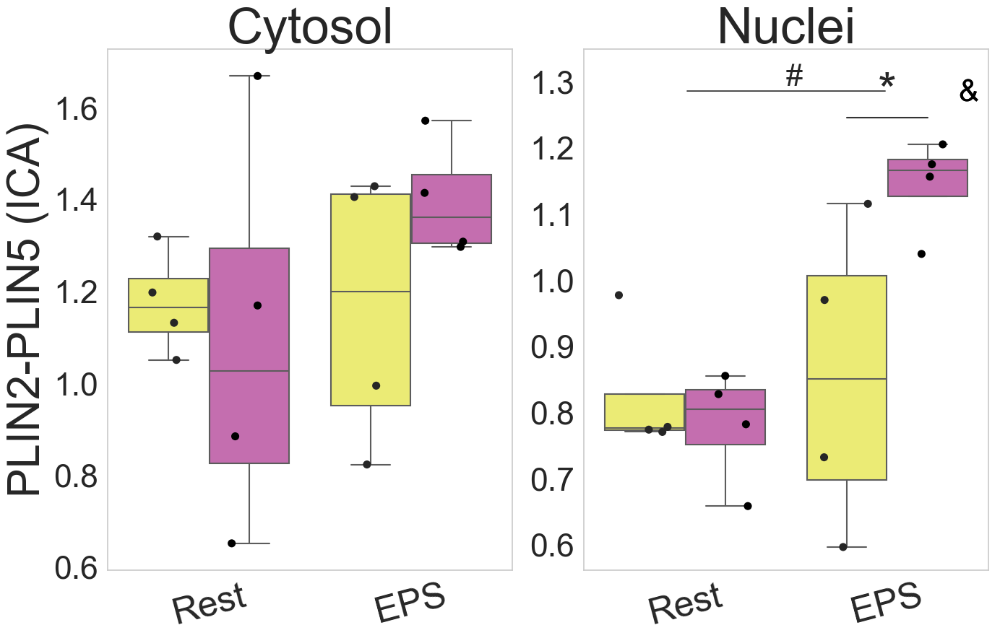

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PGC1a_signal_fraction:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.012007  0.012007  0.051769  0.823843
BCAA       1.0  0.383997  0.383997  1.655698  0.222454
EPS:BCAA   1.0  0.131244  0.131244  0.565890  0.466397
Residual  12.0  2.783092  0.231924       NaN       NaN
Shapiro-Wilk p-value for PGC1a_signal_fraction in Rest : 0.3577
Shapiro-Wilk p-value for PGC1a_signal_fraction in EPS : 0.5076

MW P value between Rest and EPS: 0.2818
t-test P value between Rest and EPS: 0.8247

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PGC1a_signal_fraction:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.012007  0.012007  0.051769  0.823843
BCAA       1.0 

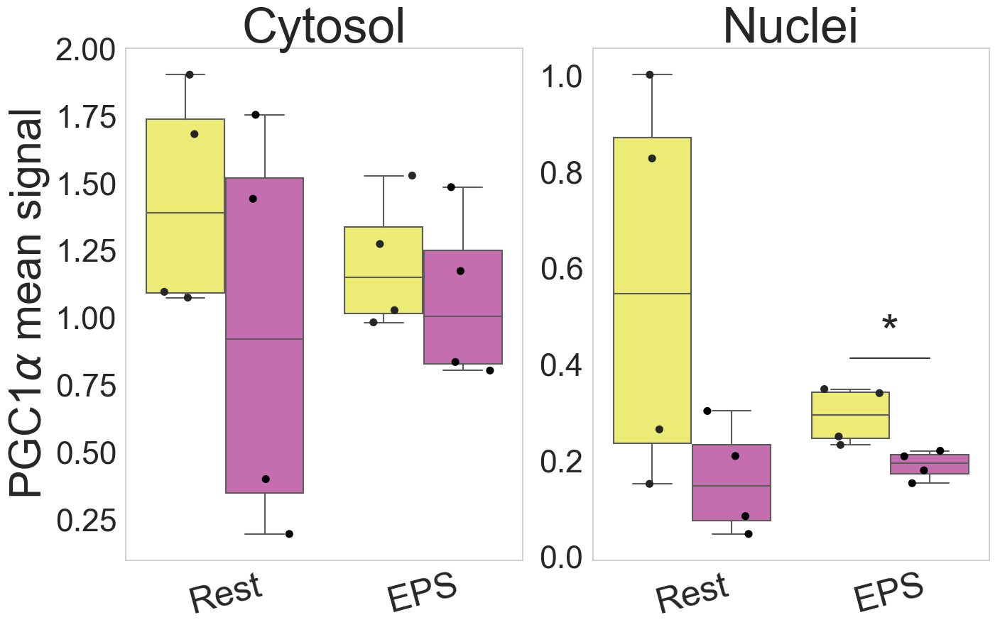

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PGC1a.vs.IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.130659  0.130659  1.717940  0.219260
BCAA       1.0  0.056183  0.056183  0.738712  0.410205
EPS:BCAA   1.0  0.000498  0.000498  0.006546  0.937111
Residual  10.0  0.760554  0.076055       NaN       NaN
Shapiro-Wilk p-value for PGC1a.vs.IMCL in Rest : 0.0552
Shapiro-Wilk p-value for PGC1a.vs.IMCL in EPS : 0.1092

MW P value between Rest and EPS: 0.1362
t-test P value between Rest and EPS: 0.1912

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PGC1a.vs.IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.130659  0.130659  1.717940  0.219260
BCAA       1.0  0.056183  0.056183  0.738712  0

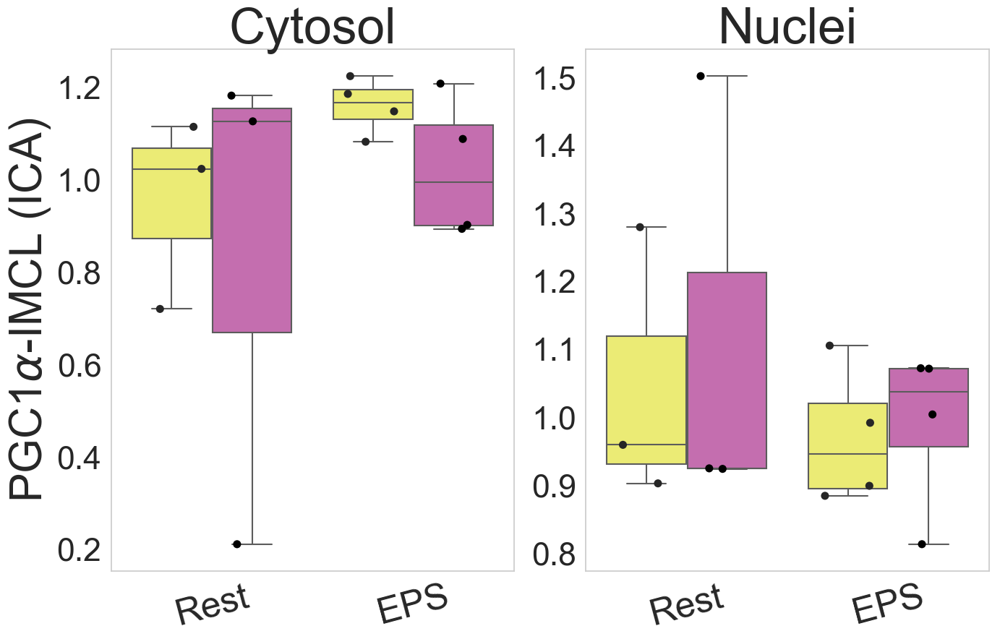

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on IMCL.vs.PGC1a:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.362307  0.362307  3.898558  0.076573
BCAA       1.0  0.155580  0.155580  1.674095  0.224795
EPS:BCAA   1.0  0.018240  0.018240  0.196264  0.667183
Residual  10.0  0.929337  0.092934       NaN       NaN
Shapiro-Wilk p-value for IMCL.vs.PGC1a in Rest : 0.4373
Shapiro-Wilk p-value for IMCL.vs.PGC1a in EPS : 0.338

MW P value between Rest and EPS: 0.0306#
t-test P value between Rest and EPS: 0.0705

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on IMCL.vs.PGC1a:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.362307  0.362307  3.898558  0.076573
BCAA       1.0  0.155580  0.155580  1.674095  0

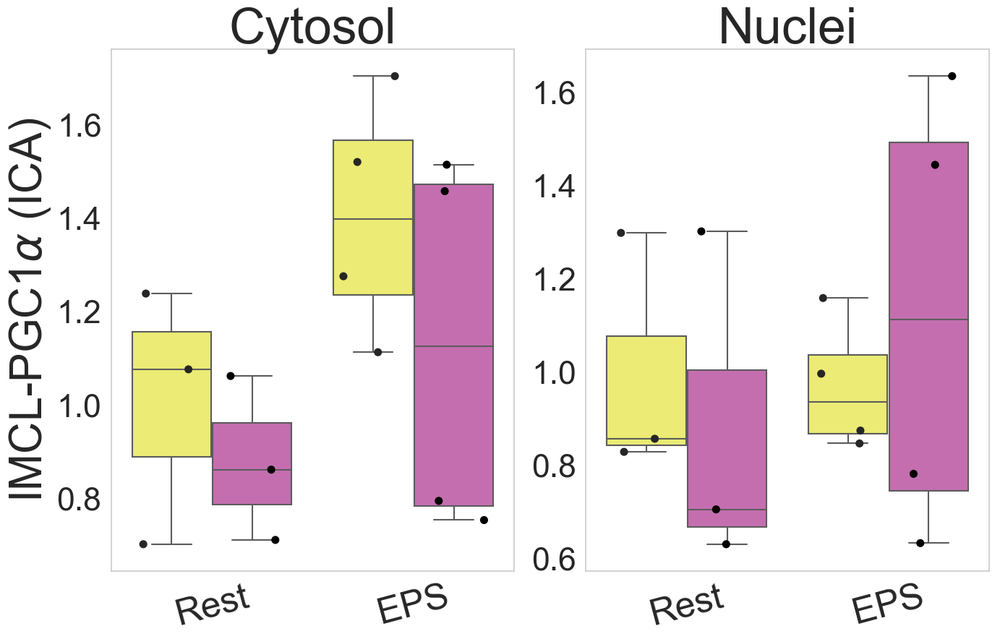

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN5.vs.PGC1a:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.724255  0.724255  2.886718  0.115066
BCAA       1.0  0.483647  0.483647  1.927710  0.190244
EPS:BCAA   1.0  0.006021  0.006021  0.024000  0.879459
Residual  12.0  3.010707  0.250892       NaN       NaN
Shapiro-Wilk p-value for PLIN5.vs.PGC1a in Rest : 0.9585
Shapiro-Wilk p-value for PLIN5.vs.PGC1a in EPS : 0.0631

MW P value between Rest and EPS: 0.186
t-test P value between Rest and EPS: 0.1109

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN5.vs.PGC1a:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.724255  0.724255  2.886718  0.115066
BCAA       1.0  0.483647  0.483647  1.927710

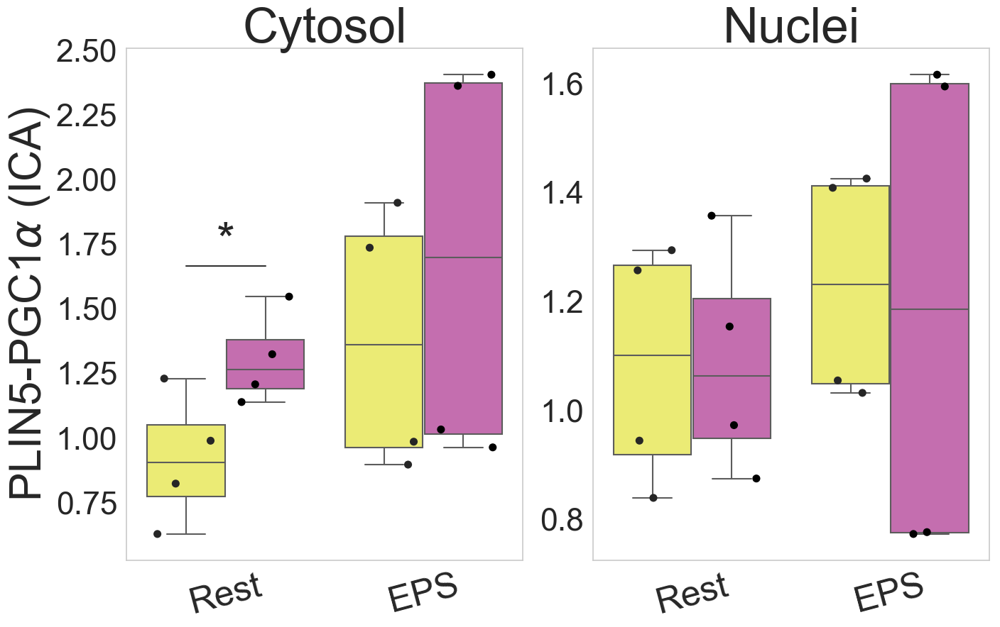

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PGC1a.vs.PLIN5:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.790309  0.790309  3.702966  0.078352
BCAA       1.0  0.854843  0.854843  4.005336  0.068495
EPS:BCAA   1.0  0.089236  0.089236  0.418112  0.530054
Residual  12.0  2.561112  0.213426       NaN       NaN
Shapiro-Wilk p-value for PGC1a.vs.PLIN5 in Rest : 0.3059
Shapiro-Wilk p-value for PGC1a.vs.PLIN5 in EPS : 0.0481#

MW P value between Rest and EPS: 0.0781
t-test P value between Rest and EPS: 0.0973

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PGC1a.vs.PLIN5:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.790309  0.790309  3.702966  0.078352
BCAA       1.0  0.854843  0.8548

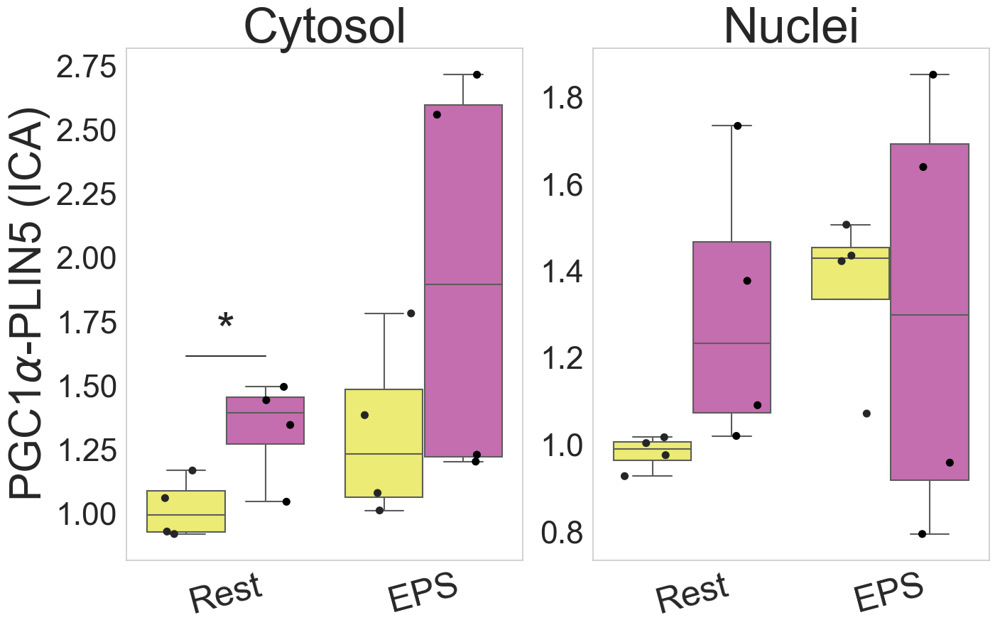

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PCK1_signal_fraction:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.825554  0.825554  4.202963  0.064963
BCAA       1.0  1.259833  1.259833  6.413918  0.027846
EPS:BCAA   1.0  0.281872  0.281872  1.435033  0.256119
Residual  11.0  2.160640  0.196422       NaN       NaN
Shapiro-Wilk p-value for PCK1_signal_fraction in Rest : 0.34
Shapiro-Wilk p-value for PCK1_signal_fraction in EPS : 0.236

MW P value between Rest and EPS: 0.0364#
t-test P value between Rest and EPS: 0.1124

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PCK1_signal_fraction:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.825554  0.825554  4.202963  0.064963
BCAA       1.0  1.259

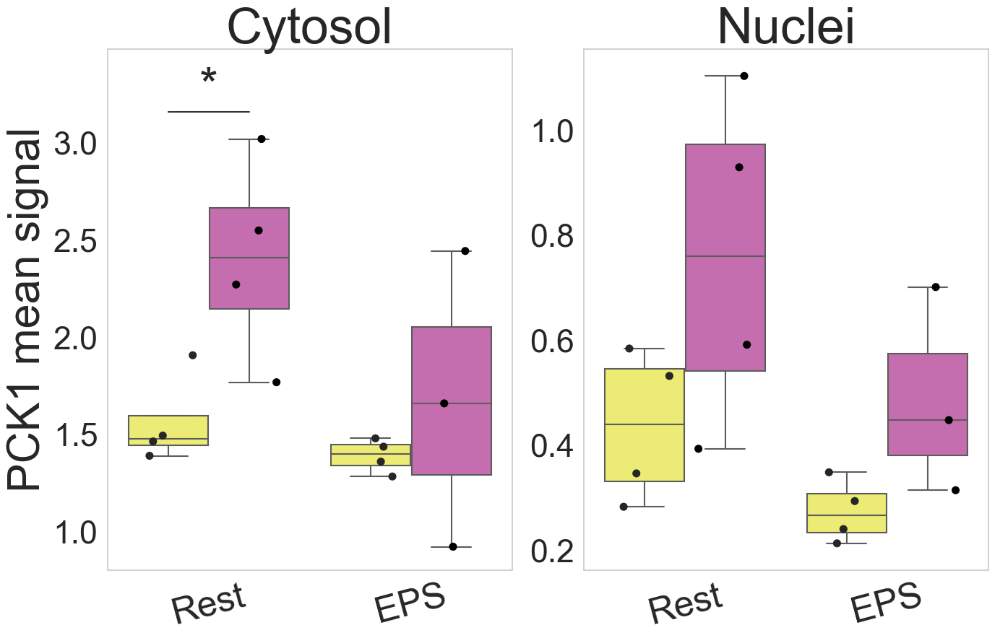

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PCK1.vs.IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.039282  0.039282  0.892373  0.365123
BCAA       1.0  0.002696  0.002696  0.061254  0.809084
EPS:BCAA   1.0  0.000286  0.000286  0.006488  0.937248
Residual  11.0  0.484211  0.044019       NaN       NaN
Shapiro-Wilk p-value for PCK1.vs.IMCL in Rest : 0.215
Shapiro-Wilk p-value for PCK1.vs.IMCL in EPS : 0.334

MW P value between Rest and EPS: 0.2622
t-test P value between Rest and EPS: 0.3246

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PCK1.vs.IMCL:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.039282  0.039282  0.892373  0.365123
BCAA       1.0  0.002696  0.002696  0.061254  0.80908

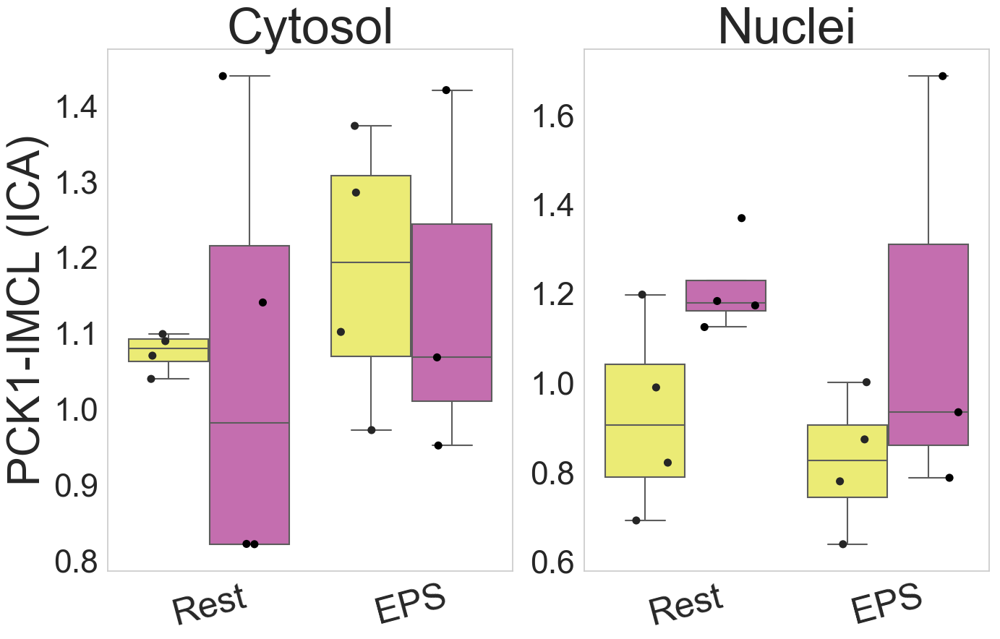

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on IMCL.vs.PCK1:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.041512  0.041512  1.534014  0.241291
BCAA       1.0  0.043869  0.043869  1.621100  0.229187
EPS:BCAA   1.0  0.007844  0.007844  0.289877  0.601024
Residual  11.0  0.297672  0.027061       NaN       NaN
Shapiro-Wilk p-value for IMCL.vs.PCK1 in Rest : 0.4712
Shapiro-Wilk p-value for IMCL.vs.PCK1 in EPS : 0.0412#

MW P value between Rest and EPS: 0.1122
t-test P value between Rest and EPS: 0.2359

non-parametric tests are more advised. Mann-Whitney will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on IMCL.vs.PCK1:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.041512  0.041512  1.534014  0.241291
BCAA       1.0  0.043869  0.043869  1.62

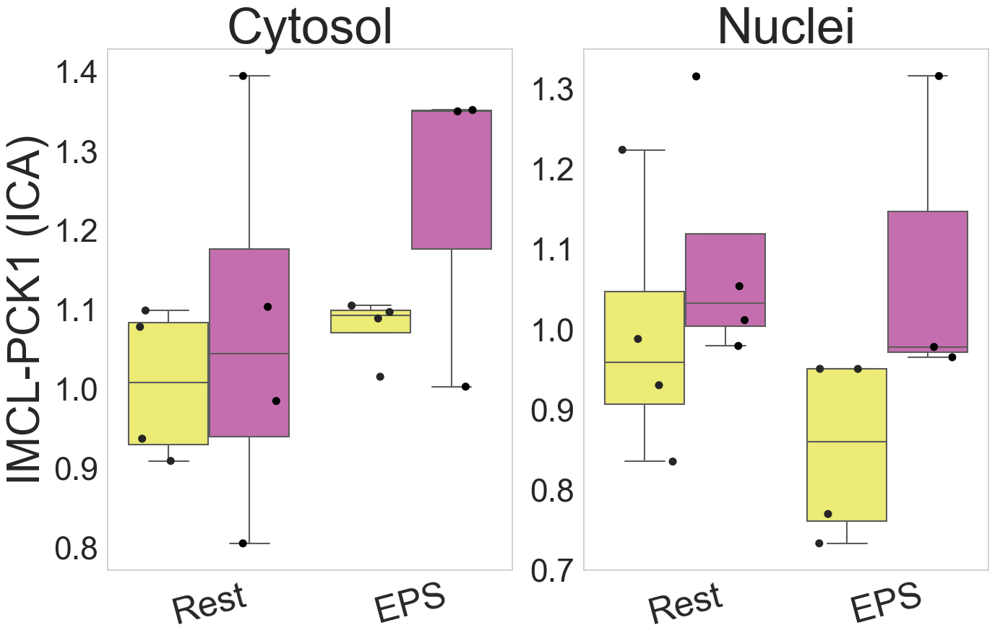

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PLIN5.vs.PCK1:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.000173  0.000173  0.020602  0.888465
BCAA       1.0  0.002652  0.002652  0.315094  0.585825
EPS:BCAA   1.0  0.000002  0.000002  0.000182  0.989473
Residual  11.0  0.092574  0.008416       NaN       NaN
Shapiro-Wilk p-value for PLIN5.vs.PCK1 in Rest : 0.6092
Shapiro-Wilk p-value for PLIN5.vs.PCK1 in EPS : 0.9855

MW P value between Rest and EPS: 0.3013
t-test P value between Rest and EPS: 0.8801

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PLIN5.vs.PCK1:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.000173  0.000173  0.020602  0.888465
BCAA       1.0  0.002652  0.002652  0.315094  0

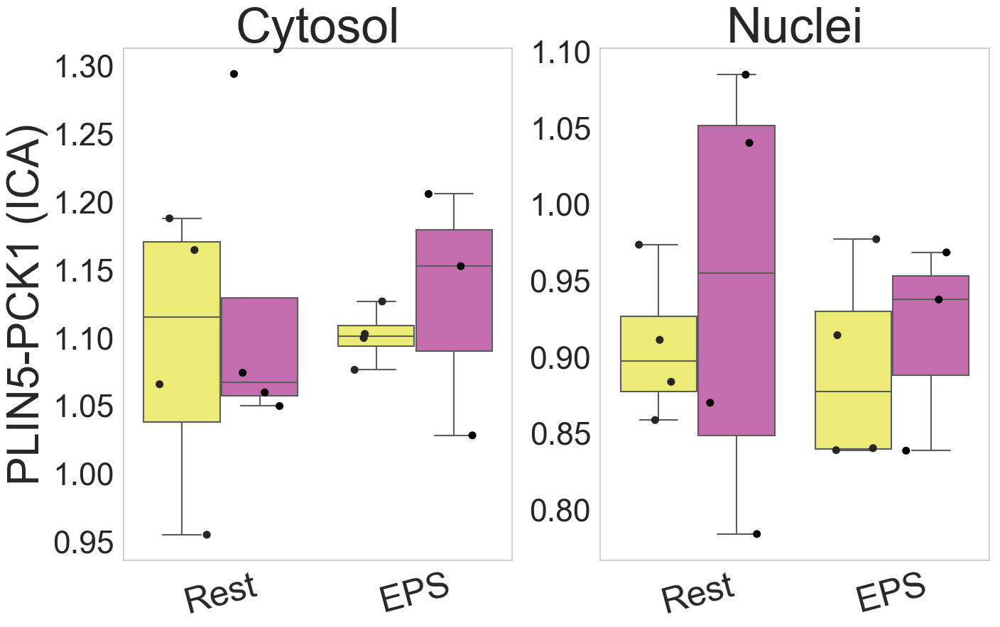

Rest group seems to have insufficient number of cases (0)
EPS group seems to have insufficient number of cases (0)
Rest and EPS could not be compared as there is no valid. One of these is missing

 2-WAY ANOVA on PCK1.vs.PLIN5:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.189454  0.189454  1.291471  0.279929
BCAA       1.0  0.071724  0.071724  0.488932  0.498923
EPS:BCAA   1.0  0.185677  0.185677  1.265726  0.284519
Residual  11.0  1.613657  0.146696       NaN       NaN
Shapiro-Wilk p-value for PCK1.vs.PLIN5 in Rest : 0.1478
Shapiro-Wilk p-value for PCK1.vs.PLIN5 in EPS : 0.7681

MW P value between Rest and EPS: 0.226
t-test P value between Rest and EPS: 0.2719

parametric tests are more advised. T-test will be used

signifficant pairs: []
p-value if signifficant: [] 


 2-WAY ANOVA on PCK1.vs.PLIN5:
             df    sum_sq   mean_sq         F    PR(>F)
EPS        1.0  0.189454  0.189454  1.291471  0.279929
BCAA       1.0  0.071724  0.071724  0.488932  0.

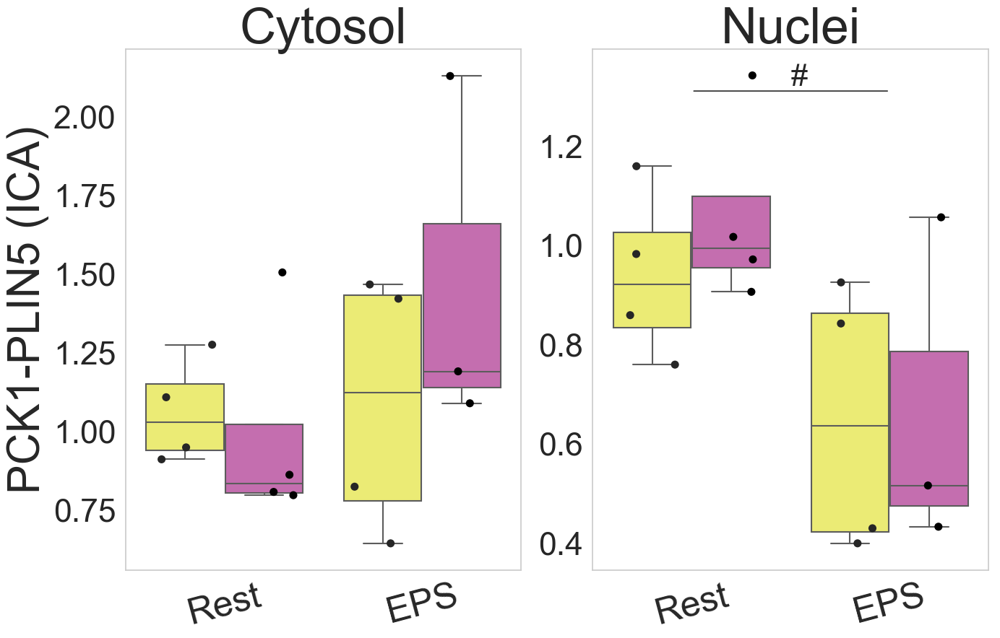

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('default')
sns.set()
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_palette('Set2')

pal = ['#E1BE6A', '#40B0A6'] #more sober, but more boring too
pal = ['#FEFE62', '#D35FB7'] #this flashy, ice creamy, maybe girly

new_comps = ['Cytosol', 'Nuclei']

main_var = main
main_var = z_main
typ = 'dual'

exprms = ['BCAA', 'EPS']
for exp in exprms:
    exp2 = exprms.copy()
    exp2.remove(exp)
    var_list = list(main_var.columns[6:])
    #print(var_list)
    #if main_var is main: 
        #del var_list[34]
    #var_list = ['LD.vs.PLIN2','PLIN2.vs.LD','LD.vs.PLIN5','PLIN5.vs.LD','PLIN5.vs.PLIN2','PLIN2.vs.PLIN5','LD.vs.PGC1a','PGC1a.vs.LD','PLIN5.vs.PGC1a','PGC1a.vs.PLIN5','LD.vs.PCK1','PCK1.vs.LD','PLIN5.vs.PCK1','PCK1.vs.PLIN5']
    #var_list = ["PLIN5 signal fraction (AU)"]

    for y_ax in var_list:
        var = [main_var[(main_var['compartiment'] == 'cytosol') & (main_var['cell type'] == 'tubes')],
               main_var[(main_var['compartiment'] == 'nuclei') & (main_var['cell type'] == 'tubes')]]
        comps = ['cytosol', 'nuclei']
        
        fig = plt.figure(figsize=(14,9))
        y_max = main_var['{}'.format(y_ax)].max()
        y_min = main_var['{}'.format(y_ax)].min()
        
        for i, v in enumerate(var): 
            ax = fig.add_subplot(1, 2, i+1)

            sns.boxplot(x=exp, y=y_ax, data=v, hue=exp2[0], showfliers=False, palette=pal, ax=ax)
            sns.stripplot(x=exp, y=y_ax, data=v, hue=exp2[0], dodge=True, jitter=0.3, color='black', ax=ax, size=8)
            
            handles, labels = ax.get_legend_handles_labels()
            #labels_ = labels.copy()
            #if 'yes' in labels_: labels_[labels.index('yes')] = ''
            #new_labels = ['{} {}'.format(labels[0], exp2[0]), '{} {}'.format(labels[1], exp2[0])]
            

            # 4 legends for defaul: boxplot x 2 species, and stripplot x 2 species
            # use the first 2 legends
            ax.legend('', labels, loc='best', frameon=False, fontsize=28)
            if i == 0:
                if '.vs.' in y_ax:
                    ax.set_ylabel('{} {}'.format(y_ax.replace('.vs.', '-'), '(ICA)').replace("PGC1a", '{}{}'.format('PGC1', r'$\alpha$')),
                                  fontsize=44)
                elif 'signal' in y_ax: 
                    ax.set_ylabel('{}'.format(y_ax.replace('_signal_fraction', ' mean signal').replace("PGC1a", '{}{}'.format('PGC1', r'$\alpha$'))),
                                  fontsize=44)
            else:
                ax.set_ylabel('', fontsize=42) 
            ax.set_xlabel('')
            ax.tick_params(labelsize=32)
            ax.set_xticklabels(v[exp].unique(), fontsize=36, rotation=15)
            #ax.set_aspect('auto')
            #ax.set_ylim(0, 20)
            plt.title('{}'.format(new_comps[i]), fontsize=50)
            
            #ax.set_ylim(y_min-(y_max*0.05), 1.25*y_max)
            makeStats(v, y_ax, [exp, exp2[0]], ax, typ)
        
        #fig.legend(handles[0:2], labels, loc='best', frameon=False, fontsize=28)

        fig.tight_layout()
        plt.show()
        
        directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\second_paper'
        fig.savefig('{}\{}_{}_{}.png'.format(directory, typ, exp, y_ax))
        #fig.savefig('{}\{}_{}_{}.pdf'.format(directory, typ, exp, y_ax))

    

'PLIN5.vs.PCK1c'

C:\Devel\Anaconda3\lib\site-packages\ipykernel_launcher.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


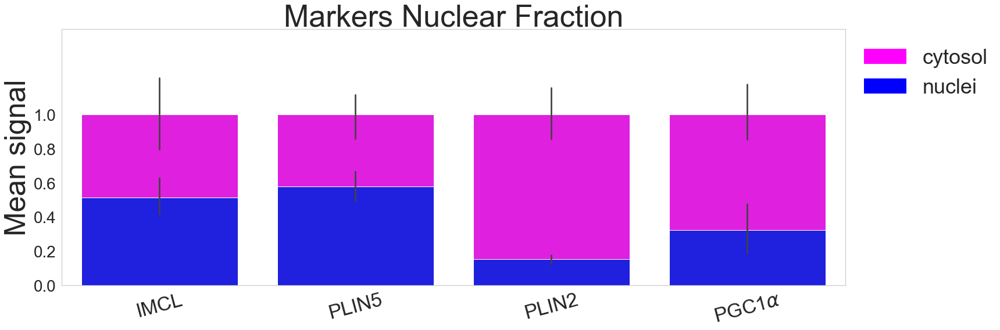

In [12]:
#LETS COMPARE CYTOSOL VS NUCLEI BTWEEN ALL MARKERS
import matplotlib.patches as mpatches
#reorganize original table only with Normal BCAA/NoEPS group 
old_df = z_main[(z_main['BCAA'] == 'Normal BCAA') & (z_main['BCAA'] == 'Normal BCAA') & (z_main['cell type'] == 'tubes')].copy()

compart_df = pd.DataFrame()

#In this next portion we reorganize the dataframe by renaming the marker columns with its respective marker. The result is going to be a larger dataframe with more columns
markers = ['IMCL', 'PLIN5', 'PLIN2', 'PGC1a']
for mk in markers:
    for cm in old_df.columns:
        if '{}_signal_fraction'.format(mk) == cm:
            temp_df = pd.DataFrame()
            temp_df['compartment'] = old_df['compartiment'][old_df[cm] > 0]
            temp_df['signal_fraction'] = old_df[cm][old_df[cm] > 0]
            #print(mk)
            temp_df['marker'] = mk
            #print(temp_df)
            
            
            compart_df = pd.concat([compart_df, temp_df], axis=0, ignore_index=True, sort=False)

#Normalizing everything against cytosolic signal
t = compart_df.copy()
for v in markers:
    ctr_var = t['signal_fraction'][(t['compartment'] == 'cytosol') & (t['marker'] == v)]
    ctr_avg = ctr_var.mean(skipna = True)#find its mean
    t['signal_fraction'][t['marker'] == v] = t['signal_fraction'][t['marker'] == v].div(ctr_avg)#Divide every value by its mean

    
    
pal = ['#E1BE6A', '#40B0A6'] #more sober, but more boring too
pal = ['#FEFE62', '#D35FB7'] #this flashy, ice creamy, maybe girly
pal = ['#FFC20A', '#0C7BDC'] #simple


fig = plt.figure(figsize=(24,8))

y_max = t['{}'.format('signal_fraction')].max()
        
ax = fig.add_subplot(1, 1, 1)

#sns.catplot(kind='bar', x='marker', y='signal_fraction', data=t, hue='compartment', palette=pal, ax=ax, alpha=.6, height=6)
#sns.barplot(x="marker", y="signal_fraction", hue="compartment", data=t, palette=pal, ax=ax)

sns.barplot(x="marker", y="signal_fraction", data=t[t['compartment'] == 'cytosol'], ax=ax, color='#FF00FF')
sns.barplot(x="marker", y="signal_fraction", data=t[t['compartment'] == 'nuclei'], ax=ax, color='#0000FF')

#sns.boxplot(x='marker', y='signal_fraction', data=t, hue='compartment', showfliers=False, palette=pal, ax=ax)
#sns.stripplot(x='marker', y='signal_fraction', data=t, hue='compartment', dodge=True, jitter=0.3, color='black', ax=ax, size=4)

pairs = [(("IMCL", "cytosol"), ("IMCL", "nuclei")), (("PLIN5", "cytosol"), ("PLIN5", "nuclei")), 
         (("PLIN2", "cytosol"), ("PLIN2", "nuclei")), (("PGC1a", "cytosol"), ("PGC1a", "nuclei")), (("PCK1", "cytosol"), ("PCK1", "nuclei"))]
order = markers

test = 't-test_paired'
test = 'Mann-Whitney'

#add_stat_annotation(ax, data=t, x='marker', y='signal_fraction', hue='compartment',
#                            order=order, box_pairs=pairs, line_height=0.0,
#                            test=test, text_format='star', verbose = 2,
#                            loc='inside', fontsize=26)


ax.set_ylabel('{}'.format('Mean signal'), fontsize=50)

ax.set_xlabel('')
ax.tick_params(labelsize=28)
ax.set_xticklabels(list(map(lambda item: item.replace("PGC1a",'{}{}'.format('PGC1', r'$\alpha$')), t['marker'].unique())),
                   fontsize=34, rotation=15)
plt.title('{}'.format('Markers Nuclear Fraction'), fontsize=52)
ax.set_ylim(0, 1.5)
ax.set_yticks([y/10 for y in list(range(0, 11, 2))])

top_bar = mpatches.Patch(color='#0000FF', label='nuclei')
bottom_bar = mpatches.Patch(color='#FF00FF', label='cytosol')
plt.legend(handles=[bottom_bar, top_bar], fontsize=36, frameon=False, bbox_to_anchor=(1,1), loc="upper left")          

plt.tight_layout()

directory = r'D:\VASCO\bcaa_final_testing\regular_BCAAEPS\python_graphs\second_paper'
fig.savefig('{}\{}.png'.format(directory, 'nuclear_fractions_stacked'))
fig.savefig('{}\{}.pdf'.format(directory, 'nuclear_fractions'))

In [231]:

for mk in t['marker'].unique():
    #MW
    sw = stats.shapiro(t['signal_fraction'][(t['marker'] == mk) & (t['compartment'] == 'nuclei')])
    print('Shapiro-Wilk test returned {} for {}'.format(sw, mk))
    
    h, pv = stats.mannwhitneyu(t['signal_fraction'][(t['marker'] == 'IMCL') & (t['compartment'] == 'nuclei')],
                                t['signal_fraction'][(t['marker'] == mk) & (t['compartment'] == 'nuclei')])
    print('Mann-Whintey return p-value of {} when comparing nuclear fraction of IMCL against {}.'.format(pv, mk))
    
    #T-TEST
    h, pv = stats.ttest_ind(t['signal_fraction'][(t['marker'] == 'IMCL') & (t['compartment'] == 'nuclei')],
                                t['signal_fraction'][(t['marker'] == mk) & (t['compartment'] == 'nuclei')])
    print('T-Test return p-value of {} when comparing nuclear fraction of IMCL against {}.\n'.format(pv, mk))
    

Shapiro-Wilk test returned (0.9078885912895203, 0.03687942773103714) for IMCL
Mann-Whintey return p-value of 0.49561475955411016 when comparing nuclear fraction of IMCL against IMCL.
T-Test return p-value of 1.0 when comparing nuclear fraction of IMCL against IMCL.

Shapiro-Wilk test returned (0.9656758904457092, 0.6115736961364746) for PLIN5
Mann-Whintey return p-value of 0.09584730102594402 when comparing nuclear fraction of IMCL against PLIN5.
T-Test return p-value of 0.3880044911011563 when comparing nuclear fraction of IMCL against PLIN5.

Shapiro-Wilk test returned (0.8715956211090088, 0.1562339961528778) for PLIN2
Mann-Whintey return p-value of 8.176058148996676e-05 when comparing nuclear fraction of IMCL against PLIN2.
T-Test return p-value of 0.0006647731046249941 when comparing nuclear fraction of IMCL against PLIN2.

Shapiro-Wilk test returned (0.7759138941764832, 0.015725137665867805) for PGC1a
Mann-Whintey return p-value of 0.01600150561030097 when comparing nuclear fracti